In [1]:
import numpy as np
import sklearn as sk
from sklearn import datasets
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.cluster import KMeans
from sklearn import metrics
import math
from yellowbrick.cluster import SilhouetteVisualizer

In [2]:
n = 10000

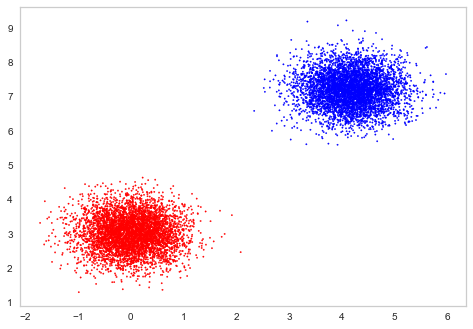

In [48]:
blobs, blob_labels = sk.datasets.make_blobs(n_samples=n, n_features=2, center_box=(0, 10.0), centers=2, cluster_std=0.5, random_state=1)
blobs = blobs.round(3)
plt.scatter(blobs[:, 0], blobs[:, 1], c=blob_labels, cmap="bwr", s=2)
plt.grid(which='major');

In [4]:
k = 2
d = 2 #0.00005 #0.000005 #0.0000005
eps = 0.1
X = blobs
n_initial = len(X) # the size of the current point set, a.k.a. n is all of the initial points

In [47]:
def visualize_splitting(Z, c_centers, lines, X, initial_bbox, title="Sub-Cell Construction"):
    plt.figure(figsize=(8, 6))

    # Plot the initial bounding box
    bbox = np.array(initial_bbox)
    plt.plot(bbox[:, 0], bbox[:, 1], color='green', linestyle='-', linewidth=1) #label='Initial Bounding Box'

    # Plot the original points
    plt.scatter(X[:, 0], X[:, 1], color='blue', marker='.', label='Original Points')

    # Plot cell centers
    centers = np.array(c_centers)
    plt.scatter(centers[:, 0], centers[:, 1], color='red', marker='x', label='Cell Centers', s=45)

    # Plot the splitting lines
    for line in lines:
        for rect_coords in line:
            rect = patches.Rectangle(
                (rect_coords[0][0], rect_coords[1][0]),  # Bottom-left and top-right corner
                rect_coords[0][1] - rect_coords[0][0],   # Width
                rect_coords[1][1] - rect_coords[1][0],   # Height
                edgecolor='green', facecolor='none')
            plt.gca().add_patch(rect)

    plt.title(title)
    plt.axis("off")
    plt.legend(loc='upper left', bbox_to_anchor=(0.03, 1.08), frameon=True, framealpha=1, edgecolor='black')
    plt.grid(False)
    plt.show()

In [6]:
def recursive_split(X, cell, k, d, eps, opt, n_initial, delta, nr_of_cells, cs, i, lines, Z, c_centers):
    x1, x2, y1, y2 = cell
    points_in_cell = X[(X[:, 0] >= x1) & (X[:, 0] < x2) & (X[:, 1] >= y1) & (X[:, 1] < y2)]
    
    threshold = ((delta)*opt) / pow(2, i)
    print("Threshold value:", round(threshold, 5), "Points in cell:", len(points_in_cell))
    if len(points_in_cell) < threshold:
        # If there are less than the threshold number of points, it's a light cell
        # First time this is checked, it checks the grid g**i if it is light (step #3)
        # Afterwards when it recurs it does step #3.4, marks c as a light cell and adds it to Z
        # Also when it recurs it does step #3.5 here (delete c from Y) as the light cell c will no longer be recured
        
        if len(points_in_cell) >= 1: 
            #print("\033[1m Points in light cell:\n", points_in_cell, "\033[0;0m")
            # If c is not empty (this already checks step #4)
            Z.append(points_in_cell)
            # Save the center coordinates for step #4.1
            c_centers.append(((x1 + x2) / 2, (y1 + y2) / 2))
    else: 
        #print("Current number of cells: " + str(nr_of_cells))
        # Cell counter, each time a cell gets split into 4 subcells the total increases by 3
        nr_of_cells = nr_of_cells + 3

        # The would-be number of cells if the below code executes
        # Does not allow to create more subcells than cs
        if i>=0 and len(points_in_cell)!=0:# and i >= np.log(delta * opt)+1: # and nr_of_cells <= cs:
        
            # Step #3.1 if c is heavy then: Split the cell
            # First time this executes - only if g**i is heavy and splits it into 4 sub-cells c1, c2, c3, c4 (step #3)
            # Afterwards the level of each cell goes to g**i-1, with side length 2**i-1 with each recursion
            i = i - 1
            mid_x = (x1 + x2) / 2
            mid_y = (y1 + y2) / 2
            
            lines.append([
                ((x1, mid_x), (y1, mid_y)),  # Top-left
                ((mid_x, x2), (y1, mid_y)),  # Top-right
                ((x1, mid_x), (mid_y, y2)),  # Bottom-left
                ((mid_x, x2), (mid_y, y2))])  # Bottom-right
            
            cells = [
                (x1, mid_x, y1, mid_y),  # Top-left
                (mid_x, x2, y1, mid_y),  # Top-right
                (x1, mid_x, mid_y, y2),  # Bottom-left
                (mid_x, x2, mid_y, y2)   # Bottom-right
            ]
            # Step #3.2 and #3.3 as it implicitly adds c1, c2, c3, c4 to Y with each recursion below
            for sub_cell in cells:
                recursive_split(points_in_cell, sub_cell, k, d, eps, opt, n_initial, delta, nr_of_cells, cs, i, lines,
                                Z, c_centers)
    return Z, c_centers, lines

In [7]:
def coreset(Z, rep_c, delta, cs, eps):
    
    # rep_c = c_centers = representative center point of a cell
    # n_c = number of  points in each cell
    n_c = [len(c) for c in Z]
    
    # S = pairs respective center coordinates with number of points in each cell
    S = []
    for index in range(0, len(rep_c)):
        S.append([rep_c[index], n_c[index]])
    #print(rep_c, n_c)
    if len(S) > cs*(1+eps) or len(S) == 0:
        return None # failure indication
    else:
        return S

In [8]:
def coreset_construction(X, k, d, eps, n_initial):
    
    if X.size > 0: 
        print("The array is non-empty, proceeding with coreset construction algorithm")
        
        # Step #1: Define the boundaries of the coordinate plane, at the start let Y be the only cell in grid g^(log(D))
        x_min, x_max, y_min, y_max = min(X[:, 0]), max(X[:, 0]), min(X[:, 1]), max(X[:, 1])
        Y = x_min, x_max, y_min, y_max
        
        # Calculate delta
        #delta below 6 fails to construct coreset
        delta = ( 1 / ( (4*k*np.sqrt(d)) * (np.log(n_initial)+1) ) )
        if delta < 1: delta = 6
        #delta = ( 1 / ( (4*k*np.sqrt(d)) * (np.log(n_initial)+1) ) ) * pow( ( eps / (14*np.sqrt(d)) ), d)
        print("delta =", round(delta, 4))
        # Calculate coreset size
        cs = math.ceil(2/delta + (np.log(n_initial) + 2) * k * pow(2, d))
        print("cs =", cs)
        DELTA = 6 # take DELTA as an arbitrary constant, lets say 5
        # Opt = number of guesses for opt approx., round up: (delta+1) * log_base(1 + eps)(DELTA) * (sqrt(2))
        Opt =  math.ceil( (delta+1) * (np.log(np.sqrt(DELTA))/np.log(1 + eps)) * np.sqrt(2) )
        print("Number of guesses for opt approximation =", Opt)

        for j in range(0, Opt):
            print("\nIteration j = " + str(j) + ", with approximation Opt = (1+eps)^j = " + str(pow((1+eps), j)) + "\n")
            
            # Cell counter
            nr_of_cells = 1
            # i-th iteration tracking for recursive alg
            i = DELTA
            # Lines defining sub-cell boundries
            lines = []
            # Step #0: arr to store light cells c
            Z = []
            # Cell centers
            c_centers = []

            # Start the recursive splitting, here Opt = (1+eps)^j
            Z, c_centers, lines = recursive_split(X, Y, k, d, eps, pow((1+eps), j), n_initial,
                                                  delta, nr_of_cells, cs, i, lines, Z, c_centers)
            # Start the coreset calculation
            S = coreset(Z, c_centers, delta, cs, eps)
                        
            if S is not None:
                print("\n Coreset constructed: \n", S, ", of size:", len(S))
                
                initial_bbox = [[x_min, y_min], [x_max, y_min], [x_max, y_max], [x_min, y_max], [x_min, y_min]]
                visualize_splitting(Z, c_centers, lines, X, initial_bbox)
                
                return S
        return "Coreset could not be constructed"
    else:
        return "The array is empty."

The array is non-empty, proceeding with coreset construction algorithm
delta = 6
cs = 91
Number of guesses for opt approximation = 94

Iteration j = 0, with approximation Opt = (1+eps)^j = 1.0

Threshold value: 0.09375 Points in cell: 9998
Threshold value: 0.1875 Points in cell: 5000
Threshold value: 0.375 Points in cell: 2253
Threshold value: 0.75 Points in cell: 28
Threshold value: 1.5 Points in cell: 0
Threshold value: 1.5 Points in cell: 2
Threshold value: 3.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 1
Threshold value: 3.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 1
Threshold value: 1.5 Points in cell: 3
Threshold value: 3.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 1
Threshold value: 3.0 Points in cell: 1
Threshold value: 3.0 Points in cell: 1
Threshold value: 1.5 Points in cell: 23
Threshold value: 3.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 1
Threshold value: 6.0 Points in cell: 0
Thres

Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 5
Threshold value: 3.0 Points in cell: 28
Threshold value: 6.0 Points in cell: 5
Threshold value: 6.0 Points in cell: 7
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 12
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 4
Threshold value: 3.0 Points in cell: 24
Threshold value: 6.0 Points in cell: 5
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 13
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 3
Threshold 

Threshold value: 12.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 12
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 5
Threshold value: 1.5 Points in cell: 187
Threshold value: 3.0 Points in cell: 18
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 6
Threshold value: 6.0 Points in cell: 5
Threshold value: 3.0 Points in cell: 40
Threshold value: 6.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 1
Threshold value: 6.0 Points in cell: 7
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 1
Thres

Threshold value: 0.375 Points in cell: 1365
Threshold value: 0.75 Points in cell: 1213
Threshold value: 1.5 Points in cell: 568
Threshold value: 3.0 Points in cell: 176
Threshold value: 6.0 Points in cell: 50
Threshold value: 12.0 Points in cell: 9
Threshold value: 12.0 Points in cell: 17
Threshold value: 12.0 Points in cell: 13
Threshold value: 12.0 Points in cell: 11
Threshold value: 6.0 Points in cell: 54
Threshold value: 12.0 Points in cell: 16
Threshold value: 12.0 Points in cell: 12
Threshold value: 12.0 Points in cell: 13
Threshold value: 12.0 Points in cell: 13
Threshold value: 6.0 Points in cell: 33
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 12
Threshold value: 12.0 Points in cell: 11
Threshold value: 12.0 Points in cell: 6
Threshold value: 6.0 Points in cell: 39
Threshold value: 12.0 Points in cell: 12
Threshold value: 12.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 9
Threshold value: 12.0 Points in cell: 12
Threshold value: 3.0

Threshold value: 0.825 Points in cell: 0
Threshold value: 0.825 Points in cell: 1081
Threshold value: 1.65 Points in cell: 317
Threshold value: 3.3 Points in cell: 71
Threshold value: 6.6 Points in cell: 12
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 2
Threshold value: 6.6 Points in cell: 12
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 2
Threshold value: 6.6 Points in cell: 26
Threshold value: 13.2 Points in cell: 12
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 6
Threshold value: 6.6 Points in cell: 21
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 6
Threshold value: 3.3 Points in c

Threshold value: 6.6 Points in cell: 20
Threshold value: 13.2 Points in cell: 7
Threshold value: 13.2 Points in cell: 6
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 5
Threshold value: 6.6 Points in cell: 12
Threshold value: 13.2 Points in cell: 1
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 3
Threshold value: 6.6 Points in cell: 17
Threshold value: 13.2 Points in cell: 6
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 3
Threshold value: 1.65 Points in cell: 513
Threshold value: 3.3 Points in cell: 94
Threshold value: 6.6 Points in cell: 17
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 4
Threshold value: 6.6 Points in cell: 22
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 

Threshold value: 6.6 Points in cell: 3
Threshold value: 6.6 Points in cell: 2
Threshold value: 0.825 Points in cell: 101
Threshold value: 1.65 Points in cell: 65
Threshold value: 3.3 Points in cell: 34
Threshold value: 6.6 Points in cell: 6
Threshold value: 6.6 Points in cell: 5
Threshold value: 6.6 Points in cell: 14
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 3
Threshold value: 6.6 Points in cell: 9
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 6
Threshold value: 13.2 Points in cell: 0
Threshold value: 13.2 Points in cell: 1
Threshold value: 3.3 Points in cell: 5
Threshold value: 6.6 Points in cell: 2
Threshold value: 6.6 Points in cell: 2
Threshold value: 6.6 Points in cell: 1
Threshold value: 6.6 Points in cell: 0
Threshold value: 3.3 Points in cell: 22
Threshold value: 6.6 Points in cell: 7
Threshold value: 13.2 Points in cell: 1
Thresho

Threshold value: 7.26 Points in cell: 19
Threshold value: 14.52 Points in cell: 6
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 9
Threshold value: 3.63 Points in cell: 45
Threshold value: 7.26 Points in cell: 8
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 2
Threshold value: 7.26 Points in cell: 17
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 6
Threshold value: 14.52 Points in cell: 8
Threshold value: 14.52 Points in cell: 0
Threshold value: 7.26 Points in cell: 7
Threshold value: 7.26 Points in cell: 13
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 5
Threshold value: 3.63 Points in cell: 62
Threshold value: 7.26 Points in cell: 21
Threshold value: 1

Threshold value: 7.26 Points in cell: 4
Threshold value: 3.63 Points in cell: 8
Threshold value: 7.26 Points in cell: 4
Threshold value: 7.26 Points in cell: 1
Threshold value: 7.26 Points in cell: 1
Threshold value: 7.26 Points in cell: 2
Threshold value: 3.63 Points in cell: 18
Threshold value: 7.26 Points in cell: 10
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 1
Threshold value: 7.26 Points in cell: 5
Threshold value: 7.26 Points in cell: 1
Threshold value: 7.26 Points in cell: 2
Threshold value: 3.63 Points in cell: 6
Threshold value: 7.26 Points in cell: 2
Threshold value: 7.26 Points in cell: 0
Threshold value: 7.26 Points in cell: 4
Threshold value: 7.26 Points in cell: 0
Threshold value: 1.815 Points in cell: 4
Threshold value: 3.63 Points in cell: 0
Threshold value: 3.63 Points in cell: 0
Threshold value: 3.63 Points in cell: 3
Threshold value: 3.63 Points in c

Threshold value: 15.972 Points in cell: 8
Threshold value: 15.972 Points in cell: 10
Threshold value: 15.972 Points in cell: 8
Threshold value: 15.972 Points in cell: 17
Threshold value: 3.993 Points in cell: 71
Threshold value: 7.986 Points in cell: 13
Threshold value: 15.972 Points in cell: 7
Threshold value: 15.972 Points in cell: 0
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 5
Threshold value: 7.986 Points in cell: 26
Threshold value: 15.972 Points in cell: 8
Threshold value: 15.972 Points in cell: 8
Threshold value: 15.972 Points in cell: 6
Threshold value: 15.972 Points in cell: 4
Threshold value: 7.986 Points in cell: 8
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 1
Threshold value: 7.986 Points in cell: 24
Threshold value: 15.972 Points in cell: 5
Threshold value: 15.972 Points in cell: 6
Threshold value: 15.972 Points in

Threshold value: 7.986 Points in cell: 3
Threshold value: 7.986 Points in cell: 1
Threshold value: 3.993 Points in cell: 34
Threshold value: 7.986 Points in cell: 5
Threshold value: 7.986 Points in cell: 10
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 1
Threshold value: 7.986 Points in cell: 7
Threshold value: 7.986 Points in cell: 12
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 5
Threshold value: 1.9965 Points in cell: 187
Threshold value: 3.993 Points in cell: 18
Threshold value: 7.986 Points in cell: 3
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 6
Threshold value: 7.986 Points in cell: 5
Threshold value: 3.993 Points in cell: 40
Threshold value: 7.986 Points in cell: 6
Threshold value: 7.986 Points in cell: 7


Threshold value: 1.9965 Points in cell: 114
Threshold value: 3.993 Points in cell: 49
Threshold value: 7.986 Points in cell: 9
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 0
Threshold value: 15.972 Points in cell: 3
Threshold value: 7.986 Points in cell: 26
Threshold value: 15.972 Points in cell: 6
Threshold value: 15.972 Points in cell: 8
Threshold value: 15.972 Points in cell: 9
Threshold value: 15.972 Points in cell: 3
Threshold value: 7.986 Points in cell: 6
Threshold value: 7.986 Points in cell: 8
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 4
Threshold value: 3.993 Points in cell: 23
Threshold value: 7.986 Points in cell: 3
Threshold value: 7.986 Points in cell: 10
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in ce

Threshold value: 17.5692 Points in cell: 7
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 4
Threshold value: 8.7846 Points in cell: 42
Threshold value: 17.5692 Points in cell: 13
Threshold value: 17.5692 Points in cell: 10
Threshold value: 17.5692 Points in cell: 10
Threshold value: 17.5692 Points in cell: 9
Threshold value: 8.7846 Points in cell: 27
Threshold value: 17.5692 Points in cell: 6
Threshold value: 17.5692 Points in cell: 8
Threshold value: 17.5692 Points in cell: 9
Threshold value: 17.5692 Points in cell: 4
Threshold value: 4.3923 Points in cell: 69
Threshold value: 8.7846 Points in cell: 16
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 10
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 1
Threshold value: 8.7846 Points in cell: 17
Threshold value: 17.5692 Points in cell: 5
Threshold value: 17.5692 Points in cell: 5
Threshold value: 17.5692 Points in cell: 6
Thresho

Threshold value: 2.19615 Points in cell: 498
Threshold value: 4.3923 Points in cell: 112
Threshold value: 8.7846 Points in cell: 29
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 8
Threshold value: 17.5692 Points in cell: 6
Threshold value: 17.5692 Points in cell: 11
Threshold value: 8.7846 Points in cell: 29
Threshold value: 17.5692 Points in cell: 8
Threshold value: 17.5692 Points in cell: 10
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 7
Threshold value: 8.7846 Points in cell: 29
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 7
Threshold value: 17.5692 Points in cell: 8
Threshold value: 17.5692 Points in cell: 11
Threshold value: 8.7846 Points in cell: 25
Threshold value: 17.5692 Points in cell: 10
Threshold value: 17.5692 Points in cell: 6
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 6
Threshold value: 4.3923 Points in cell: 181
Thr

Threshold value: 19.32612 Points in cell: 5
Threshold value: 19.32612 Points in cell: 6
Threshold value: 4.83153 Points in cell: 57
Threshold value: 9.66306 Points in cell: 13
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 3
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 4
Threshold value: 9.66306 Points in cell: 13
Threshold value: 19.32612 Points in cell: 6
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 3
Threshold value: 9.66306 Points in cell: 13
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 3
Threshold value: 19.32612 Points in cell: 4
Threshold value: 9.66306 Points in cell: 18
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 7
Threshold value: 19.32612 Points in cell: 1
Threshold value: 19.32612 Points

Threshold value: 19.32612 Points in cell: 16
Threshold value: 19.32612 Points in cell: 12
Threshold value: 4.83153 Points in cell: 149
Threshold value: 9.66306 Points in cell: 37
Threshold value: 19.32612 Points in cell: 6
Threshold value: 19.32612 Points in cell: 5
Threshold value: 19.32612 Points in cell: 10
Threshold value: 19.32612 Points in cell: 16
Threshold value: 9.66306 Points in cell: 35
Threshold value: 19.32612 Points in cell: 7
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 14
Threshold value: 19.32612 Points in cell: 10
Threshold value: 9.66306 Points in cell: 38
Threshold value: 19.32612 Points in cell: 11
Threshold value: 19.32612 Points in cell: 11
Threshold value: 19.32612 Points in cell: 10
Threshold value: 19.32612 Points in cell: 6
Threshold value: 9.66306 Points in cell: 39
Threshold value: 19.32612 Points in cell: 9
Threshold value: 19.32612 Points in cell: 7
Threshold value: 19.32612 Points in cell: 12
Threshold value: 19.3

Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 10
Threshold value: 21.25873 Points in cell: 7
Threshold value: 10.62937 Points in cell: 30
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 13
Threshold value: 21.25873 Points in cell: 3
Threshold value: 2.65734 Points in cell: 433
Threshold value: 5.31468 Points in cell: 76
Threshold value: 10.62937 Points in cell: 11
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 3
Threshold value: 21.25873 Points in cell: 4
Threshold value: 10.62937 Points in cell: 32
Threshold value: 21.25873 Points in cell: 6
Threshold value: 21.25873 Points in cell: 12
Threshold value: 21.25873 Points in cell: 6
Threshold value: 21.25873 Points in cell: 8
Threshold value: 10.62937 Points in cell: 14
Threshold value: 21.2587

Threshold value: 21.25873 Points in cell: 9
Threshold value: 21.25873 Points in cell: 8
Threshold value: 21.25873 Points in cell: 5
Threshold value: 5.31468 Points in cell: 122
Threshold value: 10.62937 Points in cell: 26
Threshold value: 21.25873 Points in cell: 8
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 5
Threshold value: 21.25873 Points in cell: 6
Threshold value: 10.62937 Points in cell: 30
Threshold value: 21.25873 Points in cell: 4
Threshold value: 21.25873 Points in cell: 11
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 8
Threshold value: 10.62937 Points in cell: 23
Threshold value: 21.25873 Points in cell: 9
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 5
Threshold value: 21.25873 Points in cell: 2
Threshold value: 10.62937 Points in cell: 43
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 10
Threshold value: 21.25873

Threshold value: 11.6923 Points in cell: 11
Threshold value: 5.84615 Points in cell: 52
Threshold value: 11.6923 Points in cell: 11
Threshold value: 11.6923 Points in cell: 10
Threshold value: 11.6923 Points in cell: 17
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 8
Threshold value: 11.6923 Points in cell: 14
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 5
Threshold value: 23.38461 Points in cell: 5
Threshold value: 23.38461 Points in cell: 1
Threshold value: 5.84615 Points in cell: 69
Threshold value: 11.6923 Points in cell: 13
Threshold value: 23.38461 Points in cell: 2
Threshold value: 23.38461 Points in cell: 2
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 6
Threshold value: 11.6923 Points in cell: 16
Threshold value: 23.38461 Points in cell: 5
Threshold value: 23.38461 Points

Threshold value: 1.46154 Points in cell: 927
Threshold value: 2.92308 Points in cell: 59
Threshold value: 5.84615 Points in cell: 3
Threshold value: 5.84615 Points in cell: 9
Threshold value: 11.6923 Points in cell: 1
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 4
Threshold value: 11.6923 Points in cell: 1
Threshold value: 5.84615 Points in cell: 13
Threshold value: 11.6923 Points in cell: 4
Threshold value: 11.6923 Points in cell: 5
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 1
Threshold value: 5.84615 Points in cell: 34
Threshold value: 11.6923 Points in cell: 5
Threshold value: 11.6923 Points in cell: 10
Threshold value: 11.6923 Points in cell: 7
Threshold value: 11.6923 Points in cell: 12
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 2
Threshold value: 23.38461 Points in cell: 2
Threshold value: 23.38461 Points in cell: 5
Threshold value: 2.92308 Points in cell: 18

Threshold value: 1.46154 Points in cell: 5
Threshold value: 2.92308 Points in cell: 3
Threshold value: 5.84615 Points in cell: 3
Threshold value: 5.84615 Points in cell: 0
Threshold value: 5.84615 Points in cell: 0
Threshold value: 5.84615 Points in cell: 0
Threshold value: 2.92308 Points in cell: 2
Threshold value: 2.92308 Points in cell: 0
Threshold value: 2.92308 Points in cell: 0

Iteration j = 8, with approximation Opt = (1+eps)^j = 2.1435888100000016

Threshold value: 0.20096 Points in cell: 9998
Threshold value: 0.40192 Points in cell: 5000
Threshold value: 0.80385 Points in cell: 2253
Threshold value: 1.60769 Points in cell: 28
Threshold value: 3.21538 Points in cell: 0
Threshold value: 3.21538 Points in cell: 2
Threshold value: 3.21538 Points in cell: 3
Threshold value: 3.21538 Points in cell: 23
Threshold value: 6.43077 Points in cell: 3
Threshold value: 6.43077 Points in cell: 5
Threshold value: 6.43077 Points in cell: 4
Threshold value: 6.43077 Points in cell: 11
Threshold 

Threshold value: 0.40192 Points in cell: 0
Threshold value: 0.40192 Points in cell: 0
Threshold value: 0.40192 Points in cell: 4998
Threshold value: 0.80385 Points in cell: 1013
Threshold value: 1.60769 Points in cell: 5
Threshold value: 3.21538 Points in cell: 0
Threshold value: 3.21538 Points in cell: 1
Threshold value: 3.21538 Points in cell: 0
Threshold value: 3.21538 Points in cell: 4
Threshold value: 6.43077 Points in cell: 0
Threshold value: 6.43077 Points in cell: 0
Threshold value: 6.43077 Points in cell: 2
Threshold value: 6.43077 Points in cell: 2
Threshold value: 1.60769 Points in cell: 49
Threshold value: 3.21538 Points in cell: 1
Threshold value: 3.21538 Points in cell: 2
Threshold value: 3.21538 Points in cell: 8
Threshold value: 6.43077 Points in cell: 0
Threshold value: 6.43077 Points in cell: 2
Threshold value: 6.43077 Points in cell: 4
Threshold value: 6.43077 Points in cell: 2
Threshold value: 3.21538 Points in cell: 38
Threshold value: 6.43077 Points in cell: 4
Thr

Threshold value: 0.22106 Points in cell: 9998
Threshold value: 0.44212 Points in cell: 5000
Threshold value: 0.88423 Points in cell: 2253
Threshold value: 1.76846 Points in cell: 28
Threshold value: 3.53692 Points in cell: 0
Threshold value: 3.53692 Points in cell: 2
Threshold value: 3.53692 Points in cell: 3
Threshold value: 3.53692 Points in cell: 23
Threshold value: 7.07384 Points in cell: 3
Threshold value: 7.07384 Points in cell: 5
Threshold value: 7.07384 Points in cell: 4
Threshold value: 7.07384 Points in cell: 11
Threshold value: 14.14769 Points in cell: 2
Threshold value: 14.14769 Points in cell: 1
Threshold value: 14.14769 Points in cell: 4
Threshold value: 14.14769 Points in cell: 4
Threshold value: 1.76846 Points in cell: 223
Threshold value: 3.53692 Points in cell: 6
Threshold value: 7.07384 Points in cell: 1
Threshold value: 7.07384 Points in cell: 0
Threshold value: 7.07384 Points in cell: 2
Threshold value: 7.07384 Points in cell: 3
Threshold value: 3.53692 Points in c

Threshold value: 1.76846 Points in cell: 32
Threshold value: 3.53692 Points in cell: 1
Threshold value: 3.53692 Points in cell: 9
Threshold value: 7.07384 Points in cell: 0
Threshold value: 7.07384 Points in cell: 6
Threshold value: 7.07384 Points in cell: 2
Threshold value: 7.07384 Points in cell: 1
Threshold value: 3.53692 Points in cell: 1
Threshold value: 3.53692 Points in cell: 21
Threshold value: 7.07384 Points in cell: 0
Threshold value: 7.07384 Points in cell: 8
Threshold value: 14.14769 Points in cell: 4
Threshold value: 14.14769 Points in cell: 2
Threshold value: 14.14769 Points in cell: 1
Threshold value: 14.14769 Points in cell: 1
Threshold value: 7.07384 Points in cell: 5
Threshold value: 7.07384 Points in cell: 8
Threshold value: 14.14769 Points in cell: 1
Threshold value: 14.14769 Points in cell: 4
Threshold value: 14.14769 Points in cell: 1
Threshold value: 14.14769 Points in cell: 2
Threshold value: 1.76846 Points in cell: 927
Threshold value: 3.53692 Points in cell: 5

Threshold value: 7.78123 Points in cell: 43
Threshold value: 15.56245 Points in cell: 9
Threshold value: 15.56245 Points in cell: 11
Threshold value: 15.56245 Points in cell: 12
Threshold value: 15.56245 Points in cell: 11
Threshold value: 7.78123 Points in cell: 52
Threshold value: 15.56245 Points in cell: 11
Threshold value: 15.56245 Points in cell: 10
Threshold value: 15.56245 Points in cell: 17
Threshold value: 31.12491 Points in cell: 3
Threshold value: 31.12491 Points in cell: 3
Threshold value: 31.12491 Points in cell: 3
Threshold value: 31.12491 Points in cell: 8
Threshold value: 15.56245 Points in cell: 14
Threshold value: 7.78123 Points in cell: 69
Threshold value: 15.56245 Points in cell: 13
Threshold value: 15.56245 Points in cell: 16
Threshold value: 31.12491 Points in cell: 5
Threshold value: 31.12491 Points in cell: 4
Threshold value: 31.12491 Points in cell: 6
Threshold value: 31.12491 Points in cell: 1
Threshold value: 15.56245 Points in cell: 16
Threshold value: 31.12

Threshold value: 31.12491 Points in cell: 10
Threshold value: 31.12491 Points in cell: 12
Threshold value: 31.12491 Points in cell: 8
Threshold value: 31.12491 Points in cell: 10
Threshold value: 15.56245 Points in cell: 43
Threshold value: 31.12491 Points in cell: 7
Threshold value: 31.12491 Points in cell: 13
Threshold value: 31.12491 Points in cell: 13
Threshold value: 31.12491 Points in cell: 10
Threshold value: 0.97265 Points in cell: 1631
Threshold value: 1.94531 Points in cell: 71
Threshold value: 3.89061 Points in cell: 0
Threshold value: 3.89061 Points in cell: 1
Threshold value: 3.89061 Points in cell: 44
Threshold value: 7.78123 Points in cell: 8
Threshold value: 15.56245 Points in cell: 1
Threshold value: 15.56245 Points in cell: 1
Threshold value: 15.56245 Points in cell: 5
Threshold value: 15.56245 Points in cell: 1
Threshold value: 7.78123 Points in cell: 5
Threshold value: 7.78123 Points in cell: 14
Threshold value: 15.56245 Points in cell: 3
Threshold value: 15.56245 P

Threshold value: 8.55935 Points in cell: 170
Threshold value: 17.1187 Points in cell: 45
Threshold value: 34.2374 Points in cell: 12
Threshold value: 34.2374 Points in cell: 11
Threshold value: 34.2374 Points in cell: 13
Threshold value: 34.2374 Points in cell: 9
Threshold value: 17.1187 Points in cell: 46
Threshold value: 34.2374 Points in cell: 5
Threshold value: 34.2374 Points in cell: 13
Threshold value: 34.2374 Points in cell: 16
Threshold value: 34.2374 Points in cell: 12
Threshold value: 17.1187 Points in cell: 41
Threshold value: 34.2374 Points in cell: 10
Threshold value: 34.2374 Points in cell: 11
Threshold value: 34.2374 Points in cell: 12
Threshold value: 34.2374 Points in cell: 8
Threshold value: 17.1187 Points in cell: 38
Threshold value: 34.2374 Points in cell: 5
Threshold value: 34.2374 Points in cell: 9
Threshold value: 34.2374 Points in cell: 4
Threshold value: 34.2374 Points in cell: 20
Threshold value: 8.55935 Points in cell: 169
Threshold value: 17.1187 Points in c

Threshold value: 34.2374 Points in cell: 6
Threshold value: 34.2374 Points in cell: 11
Threshold value: 34.2374 Points in cell: 6
Threshold value: 17.1187 Points in cell: 33
Threshold value: 34.2374 Points in cell: 8
Threshold value: 34.2374 Points in cell: 5
Threshold value: 34.2374 Points in cell: 10
Threshold value: 34.2374 Points in cell: 10
Threshold value: 8.55935 Points in cell: 75
Threshold value: 17.1187 Points in cell: 20
Threshold value: 34.2374 Points in cell: 4
Threshold value: 34.2374 Points in cell: 2
Threshold value: 34.2374 Points in cell: 10
Threshold value: 34.2374 Points in cell: 4
Threshold value: 17.1187 Points in cell: 14
Threshold value: 17.1187 Points in cell: 27
Threshold value: 34.2374 Points in cell: 7
Threshold value: 34.2374 Points in cell: 4
Threshold value: 34.2374 Points in cell: 8
Threshold value: 34.2374 Points in cell: 8
Threshold value: 17.1187 Points in cell: 14
Threshold value: 2.13984 Points in cell: 131
Threshold value: 4.27968 Points in cell: 4

Threshold value: 18.83057 Points in cell: 4
Threshold value: 18.83057 Points in cell: 4
Threshold value: 2.35382 Points in cell: 22
Threshold value: 4.70764 Points in cell: 12
Threshold value: 9.41529 Points in cell: 4
Threshold value: 9.41529 Points in cell: 0
Threshold value: 9.41529 Points in cell: 5
Threshold value: 9.41529 Points in cell: 3
Threshold value: 4.70764 Points in cell: 1
Threshold value: 4.70764 Points in cell: 7
Threshold value: 9.41529 Points in cell: 3
Threshold value: 9.41529 Points in cell: 1
Threshold value: 9.41529 Points in cell: 3
Threshold value: 9.41529 Points in cell: 0
Threshold value: 4.70764 Points in cell: 2
Threshold value: 1.17691 Points in cell: 972
Threshold value: 2.35382 Points in cell: 103
Threshold value: 4.70764 Points in cell: 14
Threshold value: 9.41529 Points in cell: 4
Threshold value: 9.41529 Points in cell: 6
Threshold value: 9.41529 Points in cell: 1
Threshold value: 9.41529 Points in cell: 3
Threshold value: 4.70764 Points in cell: 68
T

Threshold value: 37.66114 Points in cell: 4
Threshold value: 18.83057 Points in cell: 33
Threshold value: 37.66114 Points in cell: 9
Threshold value: 37.66114 Points in cell: 8
Threshold value: 37.66114 Points in cell: 7
Threshold value: 37.66114 Points in cell: 9
Threshold value: 9.41529 Points in cell: 112
Threshold value: 18.83057 Points in cell: 32
Threshold value: 37.66114 Points in cell: 5
Threshold value: 37.66114 Points in cell: 8
Threshold value: 37.66114 Points in cell: 8
Threshold value: 37.66114 Points in cell: 11
Threshold value: 18.83057 Points in cell: 24
Threshold value: 37.66114 Points in cell: 3
Threshold value: 37.66114 Points in cell: 5
Threshold value: 37.66114 Points in cell: 6
Threshold value: 37.66114 Points in cell: 10
Threshold value: 18.83057 Points in cell: 26
Threshold value: 37.66114 Points in cell: 7
Threshold value: 37.66114 Points in cell: 6
Threshold value: 37.66114 Points in cell: 7
Threshold value: 37.66114 Points in cell: 6
Threshold value: 18.83057

Threshold value: 20.71363 Points in cell: 2
Threshold value: 20.71363 Points in cell: 3
Threshold value: 20.71363 Points in cell: 4
Threshold value: 20.71363 Points in cell: 7
Threshold value: 10.35681 Points in cell: 14
Threshold value: 20.71363 Points in cell: 4
Threshold value: 20.71363 Points in cell: 1
Threshold value: 20.71363 Points in cell: 6
Threshold value: 20.71363 Points in cell: 3
Threshold value: 2.5892 Points in cell: 32
Threshold value: 5.17841 Points in cell: 1
Threshold value: 5.17841 Points in cell: 9
Threshold value: 10.35681 Points in cell: 0
Threshold value: 10.35681 Points in cell: 6
Threshold value: 10.35681 Points in cell: 2
Threshold value: 10.35681 Points in cell: 1
Threshold value: 5.17841 Points in cell: 1
Threshold value: 5.17841 Points in cell: 21
Threshold value: 10.35681 Points in cell: 0
Threshold value: 10.35681 Points in cell: 8
Threshold value: 10.35681 Points in cell: 5
Threshold value: 10.35681 Points in cell: 8
Threshold value: 2.5892 Points in c

Threshold value: 11.3925 Points in cell: 169
Threshold value: 22.78499 Points in cell: 40
Threshold value: 45.56998 Points in cell: 8
Threshold value: 45.56998 Points in cell: 14
Threshold value: 45.56998 Points in cell: 8
Threshold value: 45.56998 Points in cell: 10
Threshold value: 22.78499 Points in cell: 39
Threshold value: 45.56998 Points in cell: 11
Threshold value: 45.56998 Points in cell: 8
Threshold value: 45.56998 Points in cell: 9
Threshold value: 45.56998 Points in cell: 11
Threshold value: 22.78499 Points in cell: 41
Threshold value: 45.56998 Points in cell: 10
Threshold value: 45.56998 Points in cell: 11
Threshold value: 45.56998 Points in cell: 5
Threshold value: 45.56998 Points in cell: 15
Threshold value: 22.78499 Points in cell: 49
Threshold value: 45.56998 Points in cell: 11
Threshold value: 45.56998 Points in cell: 13
Threshold value: 45.56998 Points in cell: 11
Threshold value: 45.56998 Points in cell: 14
Threshold value: 11.3925 Points in cell: 173
Threshold value

Threshold value: 22.78499 Points in cell: 8
Threshold value: 2.84812 Points in cell: 2
Threshold value: 2.84812 Points in cell: 43
Threshold value: 5.69625 Points in cell: 12
Threshold value: 11.3925 Points in cell: 2
Threshold value: 11.3925 Points in cell: 8
Threshold value: 11.3925 Points in cell: 0
Threshold value: 11.3925 Points in cell: 2
Threshold value: 5.69625 Points in cell: 29
Threshold value: 11.3925 Points in cell: 10
Threshold value: 11.3925 Points in cell: 11
Threshold value: 11.3925 Points in cell: 2
Threshold value: 11.3925 Points in cell: 6
Threshold value: 5.69625 Points in cell: 1
Threshold value: 5.69625 Points in cell: 1
Threshold value: 1.42406 Points in cell: 1365
Threshold value: 2.84812 Points in cell: 1213
Threshold value: 5.69625 Points in cell: 568
Threshold value: 11.3925 Points in cell: 176
Threshold value: 22.78499 Points in cell: 50
Threshold value: 45.56998 Points in cell: 9
Threshold value: 45.56998 Points in cell: 17
Threshold value: 45.56998 Points 

Threshold value: 3.13294 Points in cell: 927
Threshold value: 6.26587 Points in cell: 59
Threshold value: 12.53174 Points in cell: 3
Threshold value: 12.53174 Points in cell: 9
Threshold value: 12.53174 Points in cell: 13
Threshold value: 25.06349 Points in cell: 4
Threshold value: 25.06349 Points in cell: 5
Threshold value: 25.06349 Points in cell: 3
Threshold value: 25.06349 Points in cell: 1
Threshold value: 12.53174 Points in cell: 34
Threshold value: 25.06349 Points in cell: 5
Threshold value: 25.06349 Points in cell: 10
Threshold value: 25.06349 Points in cell: 7
Threshold value: 25.06349 Points in cell: 12
Threshold value: 6.26587 Points in cell: 187
Threshold value: 12.53174 Points in cell: 18
Threshold value: 25.06349 Points in cell: 3
Threshold value: 25.06349 Points in cell: 4
Threshold value: 25.06349 Points in cell: 6
Threshold value: 25.06349 Points in cell: 5
Threshold value: 12.53174 Points in cell: 40
Threshold value: 25.06349 Points in cell: 6
Threshold value: 25.0634

Threshold value: 55.13968 Points in cell: 8
Threshold value: 55.13968 Points in cell: 6
Threshold value: 27.56984 Points in cell: 24
Threshold value: 13.78492 Points in cell: 139
Threshold value: 27.56984 Points in cell: 40
Threshold value: 55.13968 Points in cell: 10
Threshold value: 55.13968 Points in cell: 8
Threshold value: 55.13968 Points in cell: 15
Threshold value: 55.13968 Points in cell: 7
Threshold value: 27.56984 Points in cell: 39
Threshold value: 55.13968 Points in cell: 12
Threshold value: 55.13968 Points in cell: 10
Threshold value: 55.13968 Points in cell: 9
Threshold value: 55.13968 Points in cell: 8
Threshold value: 27.56984 Points in cell: 33
Threshold value: 55.13968 Points in cell: 9
Threshold value: 55.13968 Points in cell: 5
Threshold value: 55.13968 Points in cell: 9
Threshold value: 55.13968 Points in cell: 10
Threshold value: 27.56984 Points in cell: 27
Threshold value: 13.78492 Points in cell: 101
Threshold value: 27.56984 Points in cell: 30
Threshold value: 

Threshold value: 3.44623 Points in cell: 46
Threshold value: 6.89246 Points in cell: 31
Threshold value: 13.78492 Points in cell: 12
Threshold value: 13.78492 Points in cell: 12
Threshold value: 13.78492 Points in cell: 1
Threshold value: 13.78492 Points in cell: 6
Threshold value: 6.89246 Points in cell: 12
Threshold value: 13.78492 Points in cell: 5
Threshold value: 13.78492 Points in cell: 4
Threshold value: 13.78492 Points in cell: 2
Threshold value: 13.78492 Points in cell: 1
Threshold value: 6.89246 Points in cell: 2
Threshold value: 6.89246 Points in cell: 1
Threshold value: 3.44623 Points in cell: 5
Threshold value: 6.89246 Points in cell: 3
Threshold value: 6.89246 Points in cell: 2
Threshold value: 6.89246 Points in cell: 0
Threshold value: 6.89246 Points in cell: 0

Iteration j = 17, with approximation Opt = (1+eps)^j = 5.054470284992945

Threshold value: 0.47386 Points in cell: 9998
Threshold value: 0.94771 Points in cell: 5000
Threshold value: 1.89543 Points in cell: 2253


Threshold value: 30.32682 Points in cell: 3
Threshold value: 30.32682 Points in cell: 7
Threshold value: 15.16341 Points in cell: 7
Threshold value: 15.16341 Points in cell: 10
Threshold value: 7.58171 Points in cell: 174
Threshold value: 15.16341 Points in cell: 48
Threshold value: 30.32682 Points in cell: 17
Threshold value: 30.32682 Points in cell: 19
Threshold value: 30.32682 Points in cell: 7
Threshold value: 30.32682 Points in cell: 5
Threshold value: 15.16341 Points in cell: 65
Threshold value: 30.32682 Points in cell: 12
Threshold value: 30.32682 Points in cell: 23
Threshold value: 30.32682 Points in cell: 9
Threshold value: 30.32682 Points in cell: 21
Threshold value: 15.16341 Points in cell: 26
Threshold value: 30.32682 Points in cell: 6
Threshold value: 30.32682 Points in cell: 11
Threshold value: 30.32682 Points in cell: 5
Threshold value: 30.32682 Points in cell: 4
Threshold value: 15.16341 Points in cell: 35
Threshold value: 30.32682 Points in cell: 7
Threshold value: 30.

Threshold value: 33.3595 Points in cell: 8
Threshold value: 8.33988 Points in cell: 660
Threshold value: 16.67975 Points in cell: 151
Threshold value: 33.3595 Points in cell: 39
Threshold value: 66.71901 Points in cell: 8
Threshold value: 66.71901 Points in cell: 5
Threshold value: 66.71901 Points in cell: 15
Threshold value: 66.71901 Points in cell: 11
Threshold value: 33.3595 Points in cell: 36
Threshold value: 66.71901 Points in cell: 13
Threshold value: 66.71901 Points in cell: 8
Threshold value: 66.71901 Points in cell: 8
Threshold value: 66.71901 Points in cell: 7
Threshold value: 33.3595 Points in cell: 34
Threshold value: 66.71901 Points in cell: 9
Threshold value: 66.71901 Points in cell: 8
Threshold value: 66.71901 Points in cell: 6
Threshold value: 66.71901 Points in cell: 11
Threshold value: 33.3595 Points in cell: 42
Threshold value: 66.71901 Points in cell: 8
Threshold value: 66.71901 Points in cell: 6
Threshold value: 66.71901 Points in cell: 16
Threshold value: 66.71901

Threshold value: 4.58693 Points in cell: 4
Threshold value: 4.58693 Points in cell: 1425
Threshold value: 9.17386 Points in cell: 294
Threshold value: 18.34773 Points in cell: 64
Threshold value: 36.69545 Points in cell: 13
Threshold value: 36.69545 Points in cell: 16
Threshold value: 36.69545 Points in cell: 14
Threshold value: 36.69545 Points in cell: 21
Threshold value: 18.34773 Points in cell: 51
Threshold value: 36.69545 Points in cell: 12
Threshold value: 36.69545 Points in cell: 7
Threshold value: 36.69545 Points in cell: 14
Threshold value: 36.69545 Points in cell: 18
Threshold value: 18.34773 Points in cell: 92
Threshold value: 36.69545 Points in cell: 21
Threshold value: 36.69545 Points in cell: 19
Threshold value: 36.69545 Points in cell: 27
Threshold value: 36.69545 Points in cell: 25
Threshold value: 18.34773 Points in cell: 87
Threshold value: 36.69545 Points in cell: 18
Threshold value: 36.69545 Points in cell: 17
Threshold value: 36.69545 Points in cell: 25
Threshold va

Threshold value: 2.52281 Points in cell: 1631
Threshold value: 5.04562 Points in cell: 71
Threshold value: 10.09125 Points in cell: 0
Threshold value: 10.09125 Points in cell: 1
Threshold value: 10.09125 Points in cell: 44
Threshold value: 20.1825 Points in cell: 8
Threshold value: 20.1825 Points in cell: 5
Threshold value: 20.1825 Points in cell: 14
Threshold value: 20.1825 Points in cell: 17
Threshold value: 10.09125 Points in cell: 26
Threshold value: 20.1825 Points in cell: 3
Threshold value: 20.1825 Points in cell: 2
Threshold value: 20.1825 Points in cell: 14
Threshold value: 20.1825 Points in cell: 7
Threshold value: 5.04562 Points in cell: 4
Threshold value: 5.04562 Points in cell: 1425
Threshold value: 10.09125 Points in cell: 294
Threshold value: 20.1825 Points in cell: 64
Threshold value: 40.365 Points in cell: 13
Threshold value: 40.365 Points in cell: 16
Threshold value: 40.365 Points in cell: 14
Threshold value: 40.365 Points in cell: 21
Threshold value: 20.1825 Points in

Threshold value: 44.4015 Points in cell: 44
Threshold value: 11.10037 Points in cell: 323
Threshold value: 22.20075 Points in cell: 83
Threshold value: 44.4015 Points in cell: 20
Threshold value: 44.4015 Points in cell: 12
Threshold value: 44.4015 Points in cell: 28
Threshold value: 44.4015 Points in cell: 23
Threshold value: 22.20075 Points in cell: 53
Threshold value: 44.4015 Points in cell: 11
Threshold value: 44.4015 Points in cell: 11
Threshold value: 44.4015 Points in cell: 21
Threshold value: 44.4015 Points in cell: 10
Threshold value: 22.20075 Points in cell: 112
Threshold value: 44.4015 Points in cell: 23
Threshold value: 44.4015 Points in cell: 24
Threshold value: 44.4015 Points in cell: 32
Threshold value: 44.4015 Points in cell: 33
Threshold value: 22.20075 Points in cell: 75
Threshold value: 44.4015 Points in cell: 20
Threshold value: 44.4015 Points in cell: 14
Threshold value: 44.4015 Points in cell: 27
Threshold value: 44.4015 Points in cell: 14
Threshold value: 5.55019 

Threshold value: 12.21041 Points in cell: 232
Threshold value: 24.42082 Points in cell: 74
Threshold value: 48.84165 Points in cell: 17
Threshold value: 48.84165 Points in cell: 23
Threshold value: 48.84165 Points in cell: 15
Threshold value: 48.84165 Points in cell: 19
Threshold value: 24.42082 Points in cell: 62
Threshold value: 48.84165 Points in cell: 20
Threshold value: 48.84165 Points in cell: 16
Threshold value: 48.84165 Points in cell: 12
Threshold value: 48.84165 Points in cell: 14
Threshold value: 24.42082 Points in cell: 44
Threshold value: 48.84165 Points in cell: 8
Threshold value: 48.84165 Points in cell: 19
Threshold value: 48.84165 Points in cell: 10
Threshold value: 48.84165 Points in cell: 7
Threshold value: 24.42082 Points in cell: 52
Threshold value: 48.84165 Points in cell: 19
Threshold value: 48.84165 Points in cell: 21
Threshold value: 48.84165 Points in cell: 6
Threshold value: 48.84165 Points in cell: 6
Threshold value: 12.21041 Points in cell: 114
Threshold va

Threshold value: 14.7746 Points in cell: 97
Threshold value: 29.5492 Points in cell: 19
Threshold value: 29.5492 Points in cell: 11
Threshold value: 29.5492 Points in cell: 45
Threshold value: 59.0984 Points in cell: 10
Threshold value: 59.0984 Points in cell: 12
Threshold value: 59.0984 Points in cell: 15
Threshold value: 59.0984 Points in cell: 8
Threshold value: 29.5492 Points in cell: 22
Threshold value: 14.7746 Points in cell: 511
Threshold value: 29.5492 Points in cell: 161
Threshold value: 59.0984 Points in cell: 48
Threshold value: 59.0984 Points in cell: 34
Threshold value: 59.0984 Points in cell: 38
Threshold value: 59.0984 Points in cell: 41
Threshold value: 29.5492 Points in cell: 110
Threshold value: 59.0984 Points in cell: 30
Threshold value: 59.0984 Points in cell: 28
Threshold value: 59.0984 Points in cell: 28
Threshold value: 59.0984 Points in cell: 24
Threshold value: 29.5492 Points in cell: 139
Threshold value: 59.0984 Points in cell: 40
Threshold value: 59.0984 Poin

Threshold value: 16.25206 Points in cell: 513
Threshold value: 32.50412 Points in cell: 94
Threshold value: 65.00824 Points in cell: 17
Threshold value: 65.00824 Points in cell: 22
Threshold value: 65.00824 Points in cell: 23
Threshold value: 65.00824 Points in cell: 32
Threshold value: 32.50412 Points in cell: 127
Threshold value: 65.00824 Points in cell: 32
Threshold value: 65.00824 Points in cell: 29
Threshold value: 65.00824 Points in cell: 29
Threshold value: 65.00824 Points in cell: 37
Threshold value: 32.50412 Points in cell: 122
Threshold value: 65.00824 Points in cell: 26
Threshold value: 65.00824 Points in cell: 30
Threshold value: 65.00824 Points in cell: 23
Threshold value: 65.00824 Points in cell: 43
Threshold value: 32.50412 Points in cell: 170
Threshold value: 65.00824 Points in cell: 48
Threshold value: 65.00824 Points in cell: 39
Threshold value: 65.00824 Points in cell: 40
Threshold value: 65.00824 Points in cell: 43
Threshold value: 4.06301 Points in cell: 1631
Thres

Threshold value: 1.22906 Points in cell: 9998
Threshold value: 2.45812 Points in cell: 5000
Threshold value: 4.91625 Points in cell: 2253
Threshold value: 9.8325 Points in cell: 28
Threshold value: 19.66499 Points in cell: 0
Threshold value: 19.66499 Points in cell: 2
Threshold value: 19.66499 Points in cell: 3
Threshold value: 19.66499 Points in cell: 23
Threshold value: 39.32998 Points in cell: 3
Threshold value: 39.32998 Points in cell: 5
Threshold value: 39.32998 Points in cell: 4
Threshold value: 39.32998 Points in cell: 11
Threshold value: 9.8325 Points in cell: 223
Threshold value: 19.66499 Points in cell: 6
Threshold value: 19.66499 Points in cell: 13
Threshold value: 19.66499 Points in cell: 73
Threshold value: 39.32998 Points in cell: 7
Threshold value: 39.32998 Points in cell: 9
Threshold value: 39.32998 Points in cell: 21
Threshold value: 39.32998 Points in cell: 36
Threshold value: 19.66499 Points in cell: 131
Threshold value: 39.32998 Points in cell: 16
Threshold value: 3

Threshold value: 21.63149 Points in cell: 274
Threshold value: 43.26298 Points in cell: 43
Threshold value: 43.26298 Points in cell: 52
Threshold value: 86.52596 Points in cell: 11
Threshold value: 86.52596 Points in cell: 10
Threshold value: 86.52596 Points in cell: 17
Threshold value: 86.52596 Points in cell: 14
Threshold value: 43.26298 Points in cell: 69
Threshold value: 86.52596 Points in cell: 13
Threshold value: 86.52596 Points in cell: 16
Threshold value: 86.52596 Points in cell: 16
Threshold value: 86.52596 Points in cell: 24
Threshold value: 43.26298 Points in cell: 110
Threshold value: 86.52596 Points in cell: 26
Threshold value: 86.52596 Points in cell: 24
Threshold value: 86.52596 Points in cell: 23
Threshold value: 86.52596 Points in cell: 37
Threshold value: 21.63149 Points in cell: 427
Threshold value: 43.26298 Points in cell: 84
Threshold value: 86.52596 Points in cell: 22
Threshold value: 86.52596 Points in cell: 17
Threshold value: 86.52596 Points in cell: 19
Thresho

Threshold value: 95.17856 Points in cell: 27
Threshold value: 95.17856 Points in cell: 18
Threshold value: 47.58928 Points in cell: 34
Threshold value: 23.79464 Points in cell: 660
Threshold value: 47.58928 Points in cell: 151
Threshold value: 95.17856 Points in cell: 39
Threshold value: 95.17856 Points in cell: 36
Threshold value: 95.17856 Points in cell: 34
Threshold value: 95.17856 Points in cell: 42
Threshold value: 47.58928 Points in cell: 149
Threshold value: 95.17856 Points in cell: 37
Threshold value: 95.17856 Points in cell: 35
Threshold value: 95.17856 Points in cell: 38
Threshold value: 95.17856 Points in cell: 39
Threshold value: 47.58928 Points in cell: 167
Threshold value: 95.17856 Points in cell: 40
Threshold value: 95.17856 Points in cell: 37
Threshold value: 95.17856 Points in cell: 51
Threshold value: 95.17856 Points in cell: 39
Threshold value: 47.58928 Points in cell: 193
Threshold value: 95.17856 Points in cell: 52
Threshold value: 95.17856 Points in cell: 41
Thres

Threshold value: 7.19788 Points in cell: 972
Threshold value: 14.39576 Points in cell: 103
Threshold value: 28.79151 Points in cell: 14
Threshold value: 28.79151 Points in cell: 68
Threshold value: 57.58303 Points in cell: 14
Threshold value: 57.58303 Points in cell: 26
Threshold value: 57.58303 Points in cell: 6
Threshold value: 57.58303 Points in cell: 22
Threshold value: 28.79151 Points in cell: 2
Threshold value: 28.79151 Points in cell: 19
Threshold value: 14.39576 Points in cell: 846
Threshold value: 28.79151 Points in cell: 268
Threshold value: 57.58303 Points in cell: 62
Threshold value: 115.16605 Points in cell: 13
Threshold value: 115.16605 Points in cell: 19
Threshold value: 115.16605 Points in cell: 14
Threshold value: 115.16605 Points in cell: 16
Threshold value: 57.58303 Points in cell: 99
Threshold value: 115.16605 Points in cell: 21
Threshold value: 115.16605 Points in cell: 33
Threshold value: 115.16605 Points in cell: 26
Threshold value: 115.16605 Points in cell: 19
T

Threshold value: 15.83533 Points in cell: 5

Iteration j = 33, with approximation Opt = (1+eps)^j = 23.22515441988787

Threshold value: 2.17736 Points in cell: 9998
Threshold value: 4.35472 Points in cell: 5000
Threshold value: 8.70943 Points in cell: 2253
Threshold value: 17.41887 Points in cell: 28
Threshold value: 34.83773 Points in cell: 0
Threshold value: 34.83773 Points in cell: 2
Threshold value: 34.83773 Points in cell: 3
Threshold value: 34.83773 Points in cell: 23
Threshold value: 17.41887 Points in cell: 223
Threshold value: 34.83773 Points in cell: 6
Threshold value: 34.83773 Points in cell: 13
Threshold value: 34.83773 Points in cell: 73
Threshold value: 69.67546 Points in cell: 7
Threshold value: 69.67546 Points in cell: 9
Threshold value: 69.67546 Points in cell: 21
Threshold value: 69.67546 Points in cell: 36
Threshold value: 34.83773 Points in cell: 131
Threshold value: 69.67546 Points in cell: 16
Threshold value: 69.67546 Points in cell: 16
Threshold value: 69.67546 P

Threshold value: 76.64301 Points in cell: 54
Threshold value: 76.64301 Points in cell: 84
Threshold value: 153.28602 Points in cell: 27
Threshold value: 153.28602 Points in cell: 21
Threshold value: 153.28602 Points in cell: 22
Threshold value: 153.28602 Points in cell: 14
Threshold value: 76.64301 Points in cell: 50
Threshold value: 38.3215 Points in cell: 232
Threshold value: 76.64301 Points in cell: 74
Threshold value: 76.64301 Points in cell: 62
Threshold value: 76.64301 Points in cell: 44
Threshold value: 76.64301 Points in cell: 52
Threshold value: 38.3215 Points in cell: 114
Threshold value: 76.64301 Points in cell: 49
Threshold value: 76.64301 Points in cell: 23
Threshold value: 76.64301 Points in cell: 31
Threshold value: 76.64301 Points in cell: 11
Threshold value: 19.16075 Points in cell: 101
Threshold value: 38.3215 Points in cell: 65
Threshold value: 76.64301 Points in cell: 34
Threshold value: 76.64301 Points in cell: 5
Threshold value: 76.64301 Points in cell: 22
Thresho

Threshold value: 51.00592 Points in cell: 427
Threshold value: 102.01185 Points in cell: 84
Threshold value: 102.01185 Points in cell: 86
Threshold value: 102.01185 Points in cell: 131
Threshold value: 204.02369 Points in cell: 34
Threshold value: 204.02369 Points in cell: 32
Threshold value: 204.02369 Points in cell: 30
Threshold value: 204.02369 Points in cell: 35
Threshold value: 102.01185 Points in cell: 126
Threshold value: 204.02369 Points in cell: 33
Threshold value: 204.02369 Points in cell: 32
Threshold value: 204.02369 Points in cell: 31
Threshold value: 204.02369 Points in cell: 30
Threshold value: 51.00592 Points in cell: 433
Threshold value: 102.01185 Points in cell: 76
Threshold value: 102.01185 Points in cell: 137
Threshold value: 204.02369 Points in cell: 33
Threshold value: 204.02369 Points in cell: 31
Threshold value: 204.02369 Points in cell: 30
Threshold value: 204.02369 Points in cell: 43
Threshold value: 102.01185 Points in cell: 71
Threshold value: 102.01185 Poin

Threshold value: 61.71717 Points in cell: 77
Threshold value: 123.43433 Points in cell: 35
Threshold value: 123.43433 Points in cell: 15
Threshold value: 123.43433 Points in cell: 16
Threshold value: 123.43433 Points in cell: 11
Threshold value: 61.71717 Points in cell: 74
Threshold value: 123.43433 Points in cell: 32
Threshold value: 123.43433 Points in cell: 24
Threshold value: 123.43433 Points in cell: 12
Threshold value: 123.43433 Points in cell: 6
Threshold value: 61.71717 Points in cell: 25
Threshold value: 30.85858 Points in cell: 15
Threshold value: 30.85858 Points in cell: 11
Threshold value: 30.85858 Points in cell: 0
Threshold value: 7.71465 Points in cell: 0
Threshold value: 7.71465 Points in cell: 0
Threshold value: 7.71465 Points in cell: 4998
Threshold value: 15.42929 Points in cell: 1013
Threshold value: 30.85858 Points in cell: 5
Threshold value: 30.85858 Points in cell: 49
Threshold value: 61.71717 Points in cell: 1
Threshold value: 61.71717 Points in cell: 2
Threshol

Threshold value: 82.14555 Points in cell: 513
Threshold value: 164.2911 Points in cell: 94
Threshold value: 164.2911 Points in cell: 127
Threshold value: 164.2911 Points in cell: 122
Threshold value: 164.2911 Points in cell: 170
Threshold value: 328.5822 Points in cell: 48
Threshold value: 328.5822 Points in cell: 39
Threshold value: 328.5822 Points in cell: 40
Threshold value: 328.5822 Points in cell: 43
Threshold value: 20.53639 Points in cell: 1631
Threshold value: 41.07277 Points in cell: 71
Threshold value: 82.14555 Points in cell: 0
Threshold value: 82.14555 Points in cell: 1
Threshold value: 82.14555 Points in cell: 44
Threshold value: 82.14555 Points in cell: 26
Threshold value: 41.07277 Points in cell: 4
Threshold value: 41.07277 Points in cell: 1425
Threshold value: 82.14555 Points in cell: 294
Threshold value: 164.2911 Points in cell: 64
Threshold value: 164.2911 Points in cell: 51
Threshold value: 164.2911 Points in cell: 92
Threshold value: 164.2911 Points in cell: 87
Thre

Threshold value: 240.5386 Points in cell: 21
Threshold value: 240.5386 Points in cell: 62
Threshold value: 240.5386 Points in cell: 24
Threshold value: 240.5386 Points in cell: 61
Threshold value: 120.2693 Points in cell: 513
Threshold value: 240.5386 Points in cell: 94
Threshold value: 240.5386 Points in cell: 127
Threshold value: 240.5386 Points in cell: 122
Threshold value: 240.5386 Points in cell: 170
Threshold value: 30.06732 Points in cell: 1631
Threshold value: 60.13465 Points in cell: 71
Threshold value: 120.2693 Points in cell: 0
Threshold value: 120.2693 Points in cell: 1
Threshold value: 120.2693 Points in cell: 44
Threshold value: 120.2693 Points in cell: 26
Threshold value: 60.13465 Points in cell: 4
Threshold value: 60.13465 Points in cell: 1425
Threshold value: 120.2693 Points in cell: 294
Threshold value: 240.5386 Points in cell: 64
Threshold value: 240.5386 Points in cell: 51
Threshold value: 240.5386 Points in cell: 92
Threshold value: 240.5386 Points in cell: 87
Thre

Threshold value: 88.04314 Points in cell: 71
Threshold value: 88.04314 Points in cell: 4
Threshold value: 88.04314 Points in cell: 1425
Threshold value: 176.08628 Points in cell: 294
Threshold value: 352.17256 Points in cell: 64
Threshold value: 352.17256 Points in cell: 51
Threshold value: 352.17256 Points in cell: 92
Threshold value: 352.17256 Points in cell: 87
Threshold value: 176.08628 Points in cell: 148
Threshold value: 176.08628 Points in cell: 660
Threshold value: 352.17256 Points in cell: 151
Threshold value: 352.17256 Points in cell: 149
Threshold value: 352.17256 Points in cell: 167
Threshold value: 352.17256 Points in cell: 193
Threshold value: 176.08628 Points in cell: 323
Threshold value: 352.17256 Points in cell: 83
Threshold value: 352.17256 Points in cell: 53
Threshold value: 352.17256 Points in cell: 112
Threshold value: 352.17256 Points in cell: 75
Threshold value: 88.04314 Points in cell: 131
Threshold value: 176.08628 Points in cell: 42
Threshold value: 176.08628 

Threshold value: 35.44859 Points in cell: 0
Threshold value: 35.44859 Points in cell: 4998
Threshold value: 70.89718 Points in cell: 1013
Threshold value: 141.79436 Points in cell: 5
Threshold value: 141.79436 Points in cell: 49
Threshold value: 141.79436 Points in cell: 32
Threshold value: 141.79436 Points in cell: 927
Threshold value: 283.58871 Points in cell: 59
Threshold value: 283.58871 Points in cell: 187
Threshold value: 283.58871 Points in cell: 168
Threshold value: 283.58871 Points in cell: 513
Threshold value: 567.17743 Points in cell: 94
Threshold value: 567.17743 Points in cell: 127
Threshold value: 567.17743 Points in cell: 122
Threshold value: 567.17743 Points in cell: 170
Threshold value: 70.89718 Points in cell: 1631
Threshold value: 141.79436 Points in cell: 71
Threshold value: 141.79436 Points in cell: 4
Threshold value: 141.79436 Points in cell: 1425
Threshold value: 283.58871 Points in cell: 294
Threshold value: 567.17743 Points in cell: 64
Threshold value: 567.1774

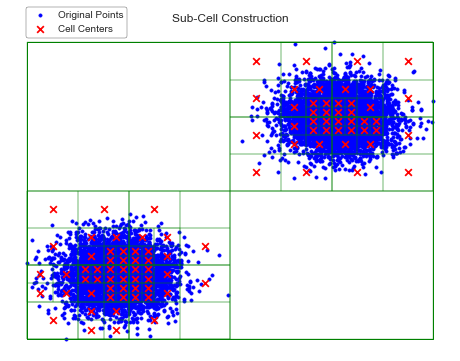

In [51]:
S = coreset_construction(X, k, d, eps, n_initial)

# K means for blobs

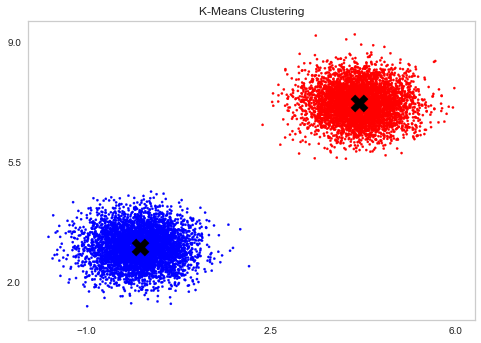

In [46]:
kmeans = KMeans(n_clusters=2, random_state=0)
y_kmeans = kmeans.fit_predict(X)

plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=5, cmap='bwr')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=300, alpha=1, marker='X')
plt.title('K-Means Clustering')
plt.grid(which='major')

x_ticks = [-1,2.5,6]
plt.xticks(x_ticks)

y_ticks = [2,5.5,9]
plt.yticks(y_ticks)
plt.show()

plt.show()

In [11]:
silhouette_score = metrics.silhouette_score(X, y_kmeans)
inertia = kmeans.inertia_

print(f"Silhouette Score: {silhouette_score}") #how well-separated the clusters are
print(f"Inertia: {inertia}") # how far the points within a cluster are from the center of that cluster.

Silhouette Score: 0.8499148597106194
Inertia: 4999.757262429402


# K means for coreset of blobs

In [12]:
coordinates = np.array([item[0] for item in S])
coreset_array = coordinates.reshape(-1, 2)
coreset_array[0:5]

array([[-1.236125  ,  1.7929375 ],
       [-0.5148125 ,  1.54546875],
       [-0.0339375 ,  1.54546875],
       [-0.5148125 ,  2.04040625],
       [-0.0339375 ,  2.04040625]])

C:\Users\Stasius\AppData\Roaming\Python\Python38\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


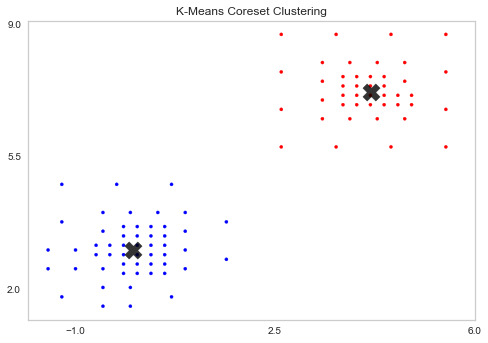

In [45]:
corekmeans = KMeans(n_clusters=2, random_state=0)
y_corekmeans = corekmeans.fit_predict(coreset_array, sample_weight= [item[1] for item in S])

plt.scatter(coreset_array[:, 0], coreset_array[:, 1], c=y_corekmeans, s=10, cmap='bwr')
corecenters = corekmeans.cluster_centers_
plt.scatter(corecenters[:, 0], corecenters[:, 1], c='black', s=300, alpha=0.8, marker='X')
plt.title('K-Means Coreset Clustering')
plt.grid(which='major')

x_ticks = [-1,2.5,6]
plt.xticks(x_ticks)

y_ticks = [2,5.5,9]
plt.yticks(y_ticks)
plt.show()

plt.show()

In [14]:
silhouette_score_core = metrics.silhouette_score(coreset_array, y_corekmeans)
inertia_core = corekmeans.inertia_

print(f"Silhouette Score: {silhouette_score_core}")
print(f"Inertia: {inertia_core}")

Silhouette Score: 0.7729363169419209
Inertia: 5890.956154474428


# Half circles (moons)

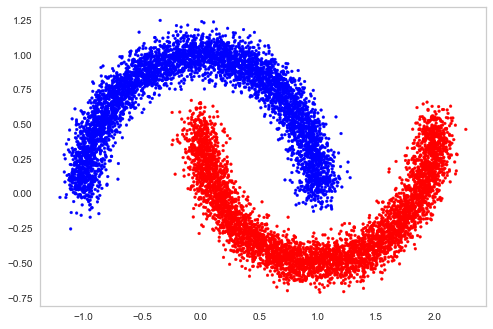

In [49]:
moons, moon_labels = sk.datasets.make_moons(n_samples=n, random_state=1, noise = 0.08)
moons = moons.round(3)
plt.scatter(moons[:, 0], moons[:, 1], c=moon_labels, cmap="bwr", s=8)
plt.grid(which='major');

The array is non-empty, proceeding with coreset construction algorithm
delta = 6
cs = 91
Number of guesses for opt approximation = 94

Iteration j = 0, with approximation Opt = (1+eps)^j = 1.0

Threshold value: 0.09375 Points in cell: 9998
Threshold value: 0.1875 Points in cell: 1753
Threshold value: 0.375 Points in cell: 1
Threshold value: 0.75 Points in cell: 0
Threshold value: 0.75 Points in cell: 0
Threshold value: 0.75 Points in cell: 1
Threshold value: 1.5 Points in cell: 0
Threshold value: 1.5 Points in cell: 0
Threshold value: 1.5 Points in cell: 1
Threshold value: 1.5 Points in cell: 0
Threshold value: 0.75 Points in cell: 0
Threshold value: 0.375 Points in cell: 434
Threshold value: 0.75 Points in cell: 0
Threshold value: 0.75 Points in cell: 23
Threshold value: 1.5 Points in cell: 0
Threshold value: 1.5 Points in cell: 1
Threshold value: 1.5 Points in cell: 2
Threshold value: 3.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 0


Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 4
Threshold value: 1.5 Points in cell: 110
Threshold value: 3.0 Points in cell: 8
Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 4
Threshold value: 3.0 Points in cell: 19
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 2
Threshold value: 3.0 Points in cell: 40
Threshold

Threshold value: 0.375 Points in cell: 452
Threshold value: 0.75 Points in cell: 33
Threshold value: 1.5 Points in cell: 6
Threshold value: 3.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 1
Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 1
Threshold value: 3.0 Points in cell: 2
Threshold value: 3.0 Points in cell: 0
Threshold value: 1.5 Points in cell: 1
Threshold value: 1.5 Points in cell: 0
Threshold value: 1.5 Points in cell: 26
Threshold value: 3.0 Points in cell: 2
Threshold value: 3.0 Points in cell: 5
Threshold value: 6.0 Points in cell: 1
Threshold value: 6.0 Points in cell: 1
Threshold value: 6.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 1
Threshold value: 3.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 1
Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 3
Threshold value: 3

Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 2
Threshold value: 3.0 Points in cell: 29
Threshold value: 6.0 Points in cell: 9
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 7
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 9
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 2
Threshold value: 0.75 Points in cell: 281
Threshold value: 1.5 Points in cell: 89
Threshold value: 3.0 Points in cell: 28
Threshold value: 6.0 Points in cell: 8
Thresho

Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 9
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 17
Threshold value: 12.0 Points in cell: 7
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 4
Threshold value: 1.5 Points in cell: 170
Threshold value: 3.0 Points in cell: 47
Threshold value: 6.0 Points in cell: 7
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 12
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 15
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 6


Threshold value: 6.0 Points in cell: 9
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 7
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 1
Threshold value: 6.0 Points in cell: 13
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 4
Threshold value: 3.0 Points in cell: 54
Threshold value: 6.0 Points in cell: 23
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 7
Threshold value: 12.0 Points in cell: 7
Threshold value: 12.0 Points in cell: 6
Threshold value: 6.0 Points in cell: 11
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 5
Threshold value: 6.0 Points in cell: 13
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 5
T

Threshold value: 6.6 Points in cell: 4
Threshold value: 6.6 Points in cell: 6
Threshold value: 3.3 Points in cell: 40
Threshold value: 6.6 Points in cell: 10
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 1
Threshold value: 13.2 Points in cell: 4
Threshold value: 6.6 Points in cell: 6
Threshold value: 6.6 Points in cell: 9
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 0
Threshold value: 13.2 Points in cell: 2
Threshold value: 6.6 Points in cell: 15
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 5
Threshold value: 3.3 Points in cell: 43
Threshold value: 6.6 Points in cell: 17
Threshold value: 13.2 Points in cell: 7
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 5
Thre

Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 0
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 5
Threshold value: 6.6 Points in cell: 6
Threshold value: 3.3 Points in cell: 11
Threshold value: 6.6 Points in cell: 4
Threshold value: 6.6 Points in cell: 1
Threshold value: 6.6 Points in cell: 5
Threshold value: 6.6 Points in cell: 1
Threshold value: 3.3 Points in cell: 43
Threshold value: 6.6 Points in cell: 10
Threshold value: 13.2 Points in cell: 1
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 3
Threshold value: 6.6 Points in cell: 5
Threshold value: 6.6 Points in cell: 19
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 8
Threshold value: 13.2 Points in cell: 3
Threshold value: 6.6 Points in cell: 9
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 1
Thresho

Threshold value: 6.6 Points in cell: 2
Threshold value: 6.6 Points in cell: 2
Threshold value: 3.3 Points in cell: 12
Threshold value: 6.6 Points in cell: 7
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 0
Threshold value: 13.2 Points in cell: 2
Threshold value: 6.6 Points in cell: 2
Threshold value: 6.6 Points in cell: 2
Threshold value: 6.6 Points in cell: 1
Threshold value: 3.3 Points in cell: 5
Threshold value: 6.6 Points in cell: 1
Threshold value: 6.6 Points in cell: 1
Threshold value: 6.6 Points in cell: 0
Threshold value: 6.6 Points in cell: 3
Threshold value: 3.3 Points in cell: 5
Threshold value: 6.6 Points in cell: 2
Threshold value: 6.6 Points in cell: 0
Threshold value: 6.6 Points in cell: 3
Threshold value: 6.6 Points in cell: 0
Threshold value: 1.65 Points in cell: 3
Threshold value: 3.3 Points in cell: 0
Threshold value: 3.3 Points in cell: 0
Threshold value: 3.3 Points in cell: 1
Threshold value: 3.

Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 4
Threshold value: 3.3 Points in cell: 52
Threshold value: 6.6 Points in cell: 14
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 4
Threshold value: 6.6 Points in cell: 14
Threshold value: 13.2 Points in cell: 0
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 5
Threshold value: 6.6 Points in cell: 14
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 4
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 6
Threshold value: 6.6 Points in cell: 10
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 2
Threshold value: 3.3 Points in cell: 47
Threshold value: 6.6 Points in cell: 14


Threshold value: 14.52 Points in cell: 5
Threshold value: 14.52 Points in cell: 3
Threshold value: 7.26 Points in cell: 3
Threshold value: 7.26 Points in cell: 10
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 0
Threshold value: 14.52 Points in cell: 6
Threshold value: 14.52 Points in cell: 0
Threshold value: 1.815 Points in cell: 102
Threshold value: 3.63 Points in cell: 34
Threshold value: 7.26 Points in cell: 10
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 2
Threshold value: 7.26 Points in cell: 7
Threshold value: 7.26 Points in cell: 11
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 3
Threshold value: 7.26 Points in cell: 6
Threshold value: 3.63 Points in cell: 12
Threshold value: 7.26 Points in cell: 6
Threshold value: 7

Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 1
Threshold value: 7.26 Points in cell: 7
Threshold value: 7.26 Points in cell: 8
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 1
Threshold value: 3.63 Points in cell: 9
Threshold value: 7.26 Points in cell: 1
Threshold value: 7.26 Points in cell: 1
Threshold value: 7.26 Points in cell: 5
Threshold value: 7.26 Points in cell: 2
Threshold value: 1.815 Points in cell: 3
Threshold value: 3.63 Points in cell: 0
Threshold value: 3.63 Points in cell: 0
Threshold value: 3.63 Points in cell: 3
Threshold value: 3.63 Points in cell: 0
Threshold value: 0.9075 Points in cell: 0
Threshold value: 0.9075 Points in cell: 471
Threshold value: 1.815 Points in cell: 161
Threshold value: 3.63 Points in cell: 46
Threshold value: 7.26 Points in cell: 9
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52

Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 2
Threshold value: 0.9075 Points in cell: 281
Threshold value: 1.815 Points in cell: 89
Threshold value: 3.63 Points in cell: 28
Threshold value: 7.26 Points in cell: 8
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 0
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 3
Threshold value: 7.26 Points in cell: 5
Threshold value: 7.26 Points in cell: 10
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 2
Threshold value: 7.26 Points in cell: 5
Threshold value: 3.63 Points in cell: 4
Threshold value: 7.26 Points in cell: 1
Threshold value: 7.26 Points in cell: 0
Threshold value: 7.26 Points in cell: 1
Threshold value: 7.26 Points in cell: 2
Threshold value: 3.63 Points in cell: 43
Threshold value: 7.2

Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 5
Threshold value: 14.52 Points in cell: 4
Threshold value: 3.63 Points in cell: 21
Threshold value: 7.26 Points in cell: 7
Threshold value: 7.26 Points in cell: 6
Threshold value: 7.26 Points in cell: 4
Threshold value: 7.26 Points in cell: 4
Threshold value: 3.63 Points in cell: 25
Threshold value: 7.26 Points in cell: 8
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 2
Threshold value: 7.26 Points in cell: 9
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 3
Threshold value: 7.26 Points in cell: 4
Threshold value: 7.26 Points in cell: 4
Threshold value: 1.815 Points in cell: 13
Threshold value: 3.63 Points in cell: 3
Threshold value: 3.63 Points in cell: 8
Threshold value: 7.26 Poi

Threshold value: 1.9965 Points in cell: 164
Threshold value: 3.993 Points in cell: 40
Threshold value: 7.986 Points in cell: 9
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 6
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 1
Threshold value: 7.986 Points in cell: 9
Threshold value: 15.972 Points in cell: 0
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 4
Threshold value: 7.986 Points in cell: 12
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 3
Threshold value: 7.986 Points in cell: 10
Threshold value: 15.972 Points in cell: 0
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 4
Threshold value: 3.993 Points in cell: 52
Threshold value: 7.986 Points in c

Threshold value: 7.986 Points in cell: 11
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 5
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 1
Threshold value: 7.986 Points in cell: 15
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 6
Threshold value: 15.972 Points in cell: 2
Threshold value: 7.986 Points in cell: 7
Threshold value: 7.986 Points in cell: 7
Threshold value: 3.993 Points in cell: 53
Threshold value: 7.986 Points in cell: 18
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 8
Threshold value: 15.972 Points in cell: 4
Threshold value: 7.986 Points in cell: 15
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 6
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 2
Threshold value: 7.986 Points in cel

Threshold value: 15.972 Points in cell: 7
Threshold value: 15.972 Points in cell: 5
Threshold value: 7.986 Points in cell: 11
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 3
Threshold value: 3.993 Points in cell: 12
Threshold value: 7.986 Points in cell: 1
Threshold value: 7.986 Points in cell: 3
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 4
Threshold value: 3.993 Points in cell: 39
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 14
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 7
Threshold value: 15.972 Points in cell: 3
Threshold value: 7.986 Points in cell: 7
Threshold value: 7.986 Points in cell: 14
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 

Threshold value: 1.9965 Points in cell: 143
Threshold value: 3.993 Points in cell: 15
Threshold value: 7.986 Points in cell: 2
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 5
Threshold value: 3.993 Points in cell: 41
Threshold value: 7.986 Points in cell: 8
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 0
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 4
Threshold value: 7.986 Points in cell: 8
Threshold value: 15.972 Points in cell: 1
Threshold value: 15.972 Points in cell: 0
Threshold value: 15.972 Points in cell: 5
Threshold value: 15.972 Points in cell: 2
Threshold value: 7.986 Points in cell: 12
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 3
Threshold value: 7.986 Points in cell: 13
Threshold value: 15.972 Points in cell

Threshold value: 7.986 Points in cell: 1
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 1
Threshold value: 7.986 Points in cell: 3
Threshold value: 3.993 Points in cell: 13
Threshold value: 7.986 Points in cell: 5
Threshold value: 7.986 Points in cell: 7
Threshold value: 7.986 Points in cell: 0
Threshold value: 7.986 Points in cell: 1
Threshold value: 3.993 Points in cell: 1
Threshold value: 1.9965 Points in cell: 2
Threshold value: 3.993 Points in cell: 2
Threshold value: 3.993 Points in cell: 0
Threshold value: 3.993 Points in cell: 0
Threshold value: 3.993 Points in cell: 0
Threshold value: 0.99825 Points in cell: 0
Threshold value: 0.99825 Points in cell: 7
Threshold value: 1.9965 Points in cell: 7
Threshold value: 3.993 Points in cell: 6
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 0
Threshold value: 7.986 Points in cell: 2
Threshold value: 7.986 Points in cell: 0
Threshold value: 3.993 Points in cell: 0
Threshold

Threshold value: 17.5692 Points in cell: 9
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 3
Threshold value: 8.7846 Points in cell: 10
Threshold value: 17.5692 Points in cell: 1
Threshold value: 17.5692 Points in cell: 5
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 2
Threshold value: 4.3923 Points in cell: 59
Threshold value: 8.7846 Points in cell: 14
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 6
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 2
Threshold value: 8.7846 Points in cell: 18
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 7
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 4
Threshold value: 8.7846 Points in cell: 7
Threshold value: 8.7846 Points in cell: 20
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 3
Threshold va

Threshold value: 0.54904 Points in cell: 948
Threshold value: 1.09808 Points in cell: 402
Threshold value: 2.19615 Points in cell: 69
Threshold value: 4.3923 Points in cell: 6
Threshold value: 8.7846 Points in cell: 1
Threshold value: 8.7846 Points in cell: 2
Threshold value: 8.7846 Points in cell: 0
Threshold value: 8.7846 Points in cell: 3
Threshold value: 4.3923 Points in cell: 40
Threshold value: 8.7846 Points in cell: 9
Threshold value: 17.5692 Points in cell: 1
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 1
Threshold value: 17.5692 Points in cell: 5
Threshold value: 8.7846 Points in cell: 16
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 5
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 5
Threshold value: 8.7846 Points in cell: 3
Threshold value: 8.7846 Points in cell: 12
Threshold value: 17.5692 Points in cell: 1
Threshold value: 17.5692 Points in cell: 3
Threshold val

Threshold value: 8.7846 Points in cell: 18
Threshold value: 17.5692 Points in cell: 1
Threshold value: 17.5692 Points in cell: 9
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 4
Threshold value: 8.7846 Points in cell: 17
Threshold value: 17.5692 Points in cell: 7
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 4
Threshold value: 2.19615 Points in cell: 170
Threshold value: 4.3923 Points in cell: 47
Threshold value: 8.7846 Points in cell: 7
Threshold value: 8.7846 Points in cell: 12
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 4
Threshold value: 8.7846 Points in cell: 15
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 6
Threshold value: 17.5692 Points in cell: 4
Threshold 

Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 5
Threshold value: 8.7846 Points in cell: 8
Threshold value: 4.3923 Points in cell: 17
Threshold value: 8.7846 Points in cell: 4
Threshold value: 8.7846 Points in cell: 7
Threshold value: 8.7846 Points in cell: 3
Threshold value: 8.7846 Points in cell: 3
Threshold value: 4.3923 Points in cell: 30
Threshold value: 8.7846 Points in cell: 13
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 1
Threshold value: 17.5692 Points in cell: 6
Threshold value: 8.7846 Points in cell: 10
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 2
Threshold value: 8.7846 Points in cell: 3
Threshold value: 8.7846 Points in cell: 4
Threshold value: 2

Threshold value: 9.66306 Points in cell: 10
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 3
Threshold value: 19.32612 Points in cell: 3
Threshold value: 9.66306 Points in cell: 8
Threshold value: 9.66306 Points in cell: 10
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 1
Threshold value: 19.32612 Points in cell: 3
Threshold value: 4.83153 Points in cell: 22
Threshold value: 9.66306 Points in cell: 2
Threshold value: 9.66306 Points in cell: 3
Threshold value: 9.66306 Points in cell: 10
Threshold value: 19.32612 Points in cell: 1
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 5
Threshold value: 19.32612 Points in cell: 2
Threshold value: 9.66306 Points in cell: 7
Threshold value: 4.83153 Points in cell: 46
Threshold value: 9.66306 Points in cell: 10
Threshold value: 19.32612 Points in 

Threshold value: 19.32612 Points in cell: 6
Threshold value: 19.32612 Points in cell: 1
Threshold value: 9.66306 Points in cell: 21
Threshold value: 19.32612 Points in cell: 3
Threshold value: 19.32612 Points in cell: 6
Threshold value: 19.32612 Points in cell: 7
Threshold value: 19.32612 Points in cell: 5
Threshold value: 9.66306 Points in cell: 11
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 3
Threshold value: 4.83153 Points in cell: 12
Threshold value: 9.66306 Points in cell: 1
Threshold value: 9.66306 Points in cell: 3
Threshold value: 9.66306 Points in cell: 4
Threshold value: 9.66306 Points in cell: 4
Threshold value: 4.83153 Points in cell: 39
Threshold value: 9.66306 Points in cell: 4
Threshold value: 9.66306 Points in cell: 14
Threshold value: 19.32612 Points in cell: 3
Threshold value: 19.32612 Points in cell: 1
Threshold value: 19.32612 Points in c

Threshold value: 19.32612 Points in cell: 3
Threshold value: 19.32612 Points in cell: 2
Threshold value: 9.66306 Points in cell: 9
Threshold value: 9.66306 Points in cell: 8
Threshold value: 4.83153 Points in cell: 10
Threshold value: 9.66306 Points in cell: 1
Threshold value: 9.66306 Points in cell: 7
Threshold value: 9.66306 Points in cell: 2
Threshold value: 9.66306 Points in cell: 0
Threshold value: 4.83153 Points in cell: 16
Threshold value: 9.66306 Points in cell: 6
Threshold value: 9.66306 Points in cell: 3
Threshold value: 9.66306 Points in cell: 3
Threshold value: 9.66306 Points in cell: 4
Threshold value: 2.41577 Points in cell: 152
Threshold value: 4.83153 Points in cell: 52
Threshold value: 9.66306 Points in cell: 15
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 6
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 3
Threshold value: 9.66306 Points in cell: 15
Threshold value: 19.32612 Points in cell:

Threshold value: 5.31468 Points in cell: 46
Threshold value: 10.62937 Points in cell: 10
Threshold value: 10.62937 Points in cell: 11
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 1
Threshold value: 21.25873 Points in cell: 5
Threshold value: 21.25873 Points in cell: 3
Threshold value: 10.62937 Points in cell: 11
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 3
Threshold value: 21.25873 Points in cell: 3
Threshold value: 21.25873 Points in cell: 3
Threshold value: 10.62937 Points in cell: 14
Threshold value: 21.25873 Points in cell: 6
Threshold value: 21.25873 Points in cell: 3
Threshold value: 21.25873 Points in cell: 3
Threshold value: 21.25873 Points in cell: 2
Threshold value: 5.31468 Points in cell: 37
Threshold value: 10.62937 Points in cell: 3
Threshold value: 10.62937 Points in cell: 11
Threshold value: 21.25873 Points in cell: 1
Threshold value: 21.25873 Points in cell: 3
Threshold value: 21.25873 P

Threshold value: 10.62937 Points in cell: 1
Threshold value: 10.62937 Points in cell: 4
Threshold value: 2.65734 Points in cell: 173
Threshold value: 5.31468 Points in cell: 38
Threshold value: 10.62937 Points in cell: 9
Threshold value: 10.62937 Points in cell: 12
Threshold value: 21.25873 Points in cell: 1
Threshold value: 21.25873 Points in cell: 5
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 4
Threshold value: 10.62937 Points in cell: 3
Threshold value: 10.62937 Points in cell: 14
Threshold value: 21.25873 Points in cell: 1
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 3
Threshold value: 21.25873 Points in cell: 3
Threshold value: 5.31468 Points in cell: 49
Threshold value: 10.62937 Points in cell: 15
Threshold value: 21.25873 Points in cell: 4
Threshold value: 21.25873 Points in cell: 5
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 4
Threshold value: 10.62937 Po

Threshold value: 21.25873 Points in cell: 3
Threshold value: 5.31468 Points in cell: 54
Threshold value: 10.62937 Points in cell: 9
Threshold value: 10.62937 Points in cell: 16
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 5
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 7
Threshold value: 10.62937 Points in cell: 14
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 4
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 1
Threshold value: 10.62937 Points in cell: 15
Threshold value: 21.25873 Points in cell: 5
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 5
Threshold value: 21.25873 Points in cell: 3
Threshold value: 1.32867 Points in cell: 550
Threshold value: 2.65734 Points in cell: 51
Threshold value: 5.31468 Points in cell: 4
Threshold value: 5.31468 Points in cell: 11
Threshold value: 10.62937 Poi

Threshold value: 11.6923 Points in cell: 9
Threshold value: 11.6923 Points in cell: 12
Threshold value: 23.38461 Points in cell: 1
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 5
Threshold value: 23.38461 Points in cell: 3
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 10
Threshold value: 2.92308 Points in cell: 102
Threshold value: 5.84615 Points in cell: 34
Threshold value: 11.6923 Points in cell: 10
Threshold value: 11.6923 Points in cell: 7
Threshold value: 11.6923 Points in cell: 11
Threshold value: 11.6923 Points in cell: 6
Threshold value: 5.84615 Points in cell: 12
Threshold value: 11.6923 Points in cell: 6
Threshold value: 11.6923 Points in cell: 1
Threshold value: 11.6923 Points in cell: 5
Threshold value: 11.6923 Points in cell: 0
Threshold value: 5.84615 Points in cell: 44
Threshold value: 11.6923 Points in cell: 16
Threshold value: 23.38461 Points in cell: 2
Threshold value: 23.38461 Points in cel

Threshold value: 0.73077 Points in cell: 914
Threshold value: 1.46154 Points in cell: 329
Threshold value: 2.92308 Points in cell: 45
Threshold value: 5.84615 Points in cell: 7
Threshold value: 11.6923 Points in cell: 2
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 1
Threshold value: 11.6923 Points in cell: 1
Threshold value: 5.84615 Points in cell: 26
Threshold value: 11.6923 Points in cell: 10
Threshold value: 11.6923 Points in cell: 7
Threshold value: 11.6923 Points in cell: 4
Threshold value: 11.6923 Points in cell: 5
Threshold value: 5.84615 Points in cell: 1
Threshold value: 5.84615 Points in cell: 11
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 1
Threshold value: 11.6923 Points in cell: 4
Threshold value: 2.92308 Points in cell: 173
Threshold value: 5.84615 Points in cell: 38
Threshold value: 11.6923 Points in cell: 9
Threshold value: 11.6923 Points in cell: 12

Threshold value: 23.38461 Points in cell: 5
Threshold value: 23.38461 Points in cell: 1
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 3
Threshold value: 11.6923 Points in cell: 10
Threshold value: 11.6923 Points in cell: 11
Threshold value: 5.84615 Points in cell: 44
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 15
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 6
Threshold value: 23.38461 Points in cell: 5
Threshold value: 23.38461 Points in cell: 1
Threshold value: 11.6923 Points in cell: 11
Threshold value: 11.6923 Points in cell: 15
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 4
Threshold value: 23.38461 Points in cell: 5
Threshold value: 2.92308 Points in cell: 186
Threshold value: 5.84615 Points in cell: 33
Threshold value: 11.6923 Points in cell: 5
Threshold value: 11.6923 Points i

Threshold value: 3.21538 Points in cell: 169
Threshold value: 6.43077 Points in cell: 63
Threshold value: 12.86153 Points in cell: 14
Threshold value: 25.72307 Points in cell: 2
Threshold value: 25.72307 Points in cell: 5
Threshold value: 25.72307 Points in cell: 3
Threshold value: 25.72307 Points in cell: 4
Threshold value: 12.86153 Points in cell: 19
Threshold value: 25.72307 Points in cell: 6
Threshold value: 25.72307 Points in cell: 6
Threshold value: 25.72307 Points in cell: 1
Threshold value: 25.72307 Points in cell: 6
Threshold value: 12.86153 Points in cell: 12
Threshold value: 12.86153 Points in cell: 18
Threshold value: 25.72307 Points in cell: 3
Threshold value: 25.72307 Points in cell: 3
Threshold value: 25.72307 Points in cell: 8
Threshold value: 25.72307 Points in cell: 4
Threshold value: 6.43077 Points in cell: 34
Threshold value: 12.86153 Points in cell: 11
Threshold value: 12.86153 Points in cell: 6
Threshold value: 12.86153 Points in cell: 8
Threshold value: 12.86153 

Threshold value: 12.86153 Points in cell: 3
Threshold value: 6.43077 Points in cell: 1
Threshold value: 0.40192 Points in cell: 3355
Threshold value: 0.80385 Points in cell: 948
Threshold value: 1.60769 Points in cell: 402
Threshold value: 3.21538 Points in cell: 69
Threshold value: 6.43077 Points in cell: 6
Threshold value: 6.43077 Points in cell: 40
Threshold value: 12.86153 Points in cell: 9
Threshold value: 12.86153 Points in cell: 16
Threshold value: 25.72307 Points in cell: 4
Threshold value: 25.72307 Points in cell: 5
Threshold value: 25.72307 Points in cell: 2
Threshold value: 25.72307 Points in cell: 5
Threshold value: 12.86153 Points in cell: 3
Threshold value: 12.86153 Points in cell: 12
Threshold value: 6.43077 Points in cell: 2
Threshold value: 6.43077 Points in cell: 21
Threshold value: 12.86153 Points in cell: 4
Threshold value: 12.86153 Points in cell: 9
Threshold value: 12.86153 Points in cell: 2
Threshold value: 12.86153 Points in cell: 6
Threshold value: 3.21538 Poin

Threshold value: 12.86153 Points in cell: 6
Threshold value: 12.86153 Points in cell: 4
Threshold value: 12.86153 Points in cell: 5
Threshold value: 6.43077 Points in cell: 29
Threshold value: 12.86153 Points in cell: 5
Threshold value: 12.86153 Points in cell: 9
Threshold value: 12.86153 Points in cell: 6
Threshold value: 12.86153 Points in cell: 9
Threshold value: 3.21538 Points in cell: 140
Threshold value: 6.43077 Points in cell: 36
Threshold value: 12.86153 Points in cell: 7
Threshold value: 12.86153 Points in cell: 7
Threshold value: 12.86153 Points in cell: 11
Threshold value: 12.86153 Points in cell: 11
Threshold value: 6.43077 Points in cell: 37
Threshold value: 12.86153 Points in cell: 14
Threshold value: 25.72307 Points in cell: 5
Threshold value: 25.72307 Points in cell: 1
Threshold value: 25.72307 Points in cell: 3
Threshold value: 25.72307 Points in cell: 5
Threshold value: 12.86153 Points in cell: 11
Threshold value: 12.86153 Points in cell: 9
Threshold value: 12.86153 P

Threshold value: 14.14769 Points in cell: 4
Threshold value: 14.14769 Points in cell: 5
Threshold value: 7.07384 Points in cell: 3
Threshold value: 7.07384 Points in cell: 34
Threshold value: 14.14769 Points in cell: 11
Threshold value: 14.14769 Points in cell: 8
Threshold value: 14.14769 Points in cell: 7
Threshold value: 14.14769 Points in cell: 8
Threshold value: 7.07384 Points in cell: 9
Threshold value: 14.14769 Points in cell: 1
Threshold value: 14.14769 Points in cell: 1
Threshold value: 14.14769 Points in cell: 5
Threshold value: 14.14769 Points in cell: 2
Threshold value: 3.53692 Points in cell: 3
Threshold value: 1.76846 Points in cell: 0
Threshold value: 1.76846 Points in cell: 471
Threshold value: 3.53692 Points in cell: 161
Threshold value: 7.07384 Points in cell: 46
Threshold value: 14.14769 Points in cell: 9
Threshold value: 14.14769 Points in cell: 7
Threshold value: 14.14769 Points in cell: 15
Threshold value: 28.29537 Points in cell: 2
Threshold value: 28.29537 Points

Threshold value: 3.53692 Points in cell: 143
Threshold value: 7.07384 Points in cell: 15
Threshold value: 14.14769 Points in cell: 2
Threshold value: 14.14769 Points in cell: 4
Threshold value: 14.14769 Points in cell: 4
Threshold value: 14.14769 Points in cell: 5
Threshold value: 7.07384 Points in cell: 41
Threshold value: 14.14769 Points in cell: 8
Threshold value: 14.14769 Points in cell: 8
Threshold value: 14.14769 Points in cell: 12
Threshold value: 14.14769 Points in cell: 13
Threshold value: 7.07384 Points in cell: 43
Threshold value: 14.14769 Points in cell: 10
Threshold value: 14.14769 Points in cell: 12
Threshold value: 14.14769 Points in cell: 10
Threshold value: 14.14769 Points in cell: 11
Threshold value: 7.07384 Points in cell: 44
Threshold value: 14.14769 Points in cell: 3
Threshold value: 14.14769 Points in cell: 15
Threshold value: 28.29537 Points in cell: 3
Threshold value: 28.29537 Points in cell: 6
Threshold value: 28.29537 Points in cell: 5
Threshold value: 28.2953

Threshold value: 1.94531 Points in cell: 366
Threshold value: 3.89061 Points in cell: 29
Threshold value: 7.78123 Points in cell: 6
Threshold value: 7.78123 Points in cell: 1
Threshold value: 7.78123 Points in cell: 13
Threshold value: 15.56245 Points in cell: 2
Threshold value: 15.56245 Points in cell: 0
Threshold value: 15.56245 Points in cell: 5
Threshold value: 15.56245 Points in cell: 6
Threshold value: 7.78123 Points in cell: 9
Threshold value: 15.56245 Points in cell: 2
Threshold value: 15.56245 Points in cell: 1
Threshold value: 15.56245 Points in cell: 5
Threshold value: 15.56245 Points in cell: 1
Threshold value: 3.89061 Points in cell: 25
Threshold value: 7.78123 Points in cell: 2
Threshold value: 7.78123 Points in cell: 1
Threshold value: 7.78123 Points in cell: 14
Threshold value: 15.56245 Points in cell: 4
Threshold value: 15.56245 Points in cell: 1
Threshold value: 15.56245 Points in cell: 4
Threshold value: 15.56245 Points in cell: 5
Threshold value: 7.78123 Points in c

Threshold value: 1.94531 Points in cell: 38
Threshold value: 3.89061 Points in cell: 4
Threshold value: 7.78123 Points in cell: 0
Threshold value: 7.78123 Points in cell: 4
Threshold value: 7.78123 Points in cell: 0
Threshold value: 7.78123 Points in cell: 0
Threshold value: 3.89061 Points in cell: 33
Threshold value: 7.78123 Points in cell: 9
Threshold value: 15.56245 Points in cell: 3
Threshold value: 15.56245 Points in cell: 1
Threshold value: 15.56245 Points in cell: 2
Threshold value: 15.56245 Points in cell: 3
Threshold value: 7.78123 Points in cell: 17
Threshold value: 15.56245 Points in cell: 4
Threshold value: 15.56245 Points in cell: 4
Threshold value: 15.56245 Points in cell: 5
Threshold value: 15.56245 Points in cell: 4
Threshold value: 7.78123 Points in cell: 1
Threshold value: 7.78123 Points in cell: 6
Threshold value: 3.89061 Points in cell: 0
Threshold value: 3.89061 Points in cell: 1
Threshold value: 0.97265 Points in cell: 1410
Threshold value: 1.94531 Points in cell:

Threshold value: 17.1187 Points in cell: 8
Threshold value: 8.55935 Points in cell: 48
Threshold value: 17.1187 Points in cell: 12
Threshold value: 17.1187 Points in cell: 16
Threshold value: 17.1187 Points in cell: 7
Threshold value: 17.1187 Points in cell: 13
Threshold value: 2.13984 Points in cell: 169
Threshold value: 4.27968 Points in cell: 101
Threshold value: 8.55935 Points in cell: 40
Threshold value: 17.1187 Points in cell: 14
Threshold value: 17.1187 Points in cell: 9
Threshold value: 17.1187 Points in cell: 9
Threshold value: 17.1187 Points in cell: 8
Threshold value: 8.55935 Points in cell: 17
Threshold value: 17.1187 Points in cell: 5
Threshold value: 17.1187 Points in cell: 3
Threshold value: 17.1187 Points in cell: 7
Threshold value: 17.1187 Points in cell: 2
Threshold value: 8.55935 Points in cell: 36
Threshold value: 17.1187 Points in cell: 12
Threshold value: 17.1187 Points in cell: 9
Threshold value: 17.1187 Points in cell: 11
Threshold value: 17.1187 Points in cell:

Threshold value: 4.27968 Points in cell: 163
Threshold value: 8.55935 Points in cell: 44
Threshold value: 17.1187 Points in cell: 11
Threshold value: 17.1187 Points in cell: 6
Threshold value: 17.1187 Points in cell: 16
Threshold value: 17.1187 Points in cell: 11
Threshold value: 8.55935 Points in cell: 27
Threshold value: 17.1187 Points in cell: 3
Threshold value: 17.1187 Points in cell: 6
Threshold value: 17.1187 Points in cell: 14
Threshold value: 17.1187 Points in cell: 4
Threshold value: 8.55935 Points in cell: 48
Threshold value: 17.1187 Points in cell: 11
Threshold value: 17.1187 Points in cell: 9
Threshold value: 17.1187 Points in cell: 17
Threshold value: 17.1187 Points in cell: 11
Threshold value: 8.55935 Points in cell: 44
Threshold value: 17.1187 Points in cell: 14
Threshold value: 17.1187 Points in cell: 7
Threshold value: 17.1187 Points in cell: 14
Threshold value: 17.1187 Points in cell: 9
Threshold value: 4.27968 Points in cell: 35
Threshold value: 8.55935 Points in cel

Threshold value: 4.70764 Points in cell: 175
Threshold value: 9.41529 Points in cell: 43
Threshold value: 18.83057 Points in cell: 9
Threshold value: 18.83057 Points in cell: 11
Threshold value: 18.83057 Points in cell: 11
Threshold value: 18.83057 Points in cell: 12
Threshold value: 9.41529 Points in cell: 35
Threshold value: 18.83057 Points in cell: 3
Threshold value: 18.83057 Points in cell: 10
Threshold value: 18.83057 Points in cell: 14
Threshold value: 18.83057 Points in cell: 8
Threshold value: 9.41529 Points in cell: 46
Threshold value: 18.83057 Points in cell: 10
Threshold value: 18.83057 Points in cell: 11
Threshold value: 18.83057 Points in cell: 13
Threshold value: 18.83057 Points in cell: 12
Threshold value: 9.41529 Points in cell: 51
Threshold value: 18.83057 Points in cell: 10
Threshold value: 18.83057 Points in cell: 15
Threshold value: 18.83057 Points in cell: 13
Threshold value: 18.83057 Points in cell: 13
Threshold value: 2.35382 Points in cell: 366
Threshold value: 

Threshold value: 2.35382 Points in cell: 550
Threshold value: 4.70764 Points in cell: 51
Threshold value: 9.41529 Points in cell: 4
Threshold value: 9.41529 Points in cell: 11
Threshold value: 18.83057 Points in cell: 2
Threshold value: 18.83057 Points in cell: 3
Threshold value: 18.83057 Points in cell: 3
Threshold value: 18.83057 Points in cell: 3
Threshold value: 9.41529 Points in cell: 12
Threshold value: 18.83057 Points in cell: 1
Threshold value: 18.83057 Points in cell: 4
Threshold value: 18.83057 Points in cell: 2
Threshold value: 18.83057 Points in cell: 5
Threshold value: 9.41529 Points in cell: 24
Threshold value: 18.83057 Points in cell: 3
Threshold value: 18.83057 Points in cell: 4
Threshold value: 18.83057 Points in cell: 10
Threshold value: 18.83057 Points in cell: 7
Threshold value: 4.70764 Points in cell: 143
Threshold value: 9.41529 Points in cell: 15
Threshold value: 18.83057 Points in cell: 2
Threshold value: 18.83057 Points in cell: 4
Threshold value: 18.83057 Poin

Threshold value: 1.2946 Points in cell: 541
Threshold value: 2.5892 Points in cell: 63
Threshold value: 5.17841 Points in cell: 3
Threshold value: 5.17841 Points in cell: 0
Threshold value: 5.17841 Points in cell: 57
Threshold value: 10.35681 Points in cell: 11
Threshold value: 20.71363 Points in cell: 1
Threshold value: 20.71363 Points in cell: 1
Threshold value: 20.71363 Points in cell: 4
Threshold value: 20.71363 Points in cell: 5
Threshold value: 10.35681 Points in cell: 3
Threshold value: 10.35681 Points in cell: 34
Threshold value: 20.71363 Points in cell: 11
Threshold value: 20.71363 Points in cell: 8
Threshold value: 20.71363 Points in cell: 7
Threshold value: 20.71363 Points in cell: 8
Threshold value: 10.35681 Points in cell: 9
Threshold value: 5.17841 Points in cell: 3
Threshold value: 2.5892 Points in cell: 0
Threshold value: 2.5892 Points in cell: 471
Threshold value: 5.17841 Points in cell: 161
Threshold value: 10.35681 Points in cell: 46
Threshold value: 20.71363 Points 

Threshold value: 10.35681 Points in cell: 1
Threshold value: 10.35681 Points in cell: 6
Threshold value: 10.35681 Points in cell: 0
Threshold value: 5.17841 Points in cell: 0
Threshold value: 5.17841 Points in cell: 2
Threshold value: 5.17841 Points in cell: 0
Threshold value: 1.2946 Points in cell: 391
Threshold value: 2.5892 Points in cell: 10
Threshold value: 5.17841 Points in cell: 0
Threshold value: 5.17841 Points in cell: 9
Threshold value: 10.35681 Points in cell: 0
Threshold value: 10.35681 Points in cell: 5
Threshold value: 10.35681 Points in cell: 0
Threshold value: 10.35681 Points in cell: 4
Threshold value: 5.17841 Points in cell: 0
Threshold value: 5.17841 Points in cell: 1
Threshold value: 2.5892 Points in cell: 330
Threshold value: 5.17841 Points in cell: 147
Threshold value: 10.35681 Points in cell: 22
Threshold value: 20.71363 Points in cell: 3
Threshold value: 20.71363 Points in cell: 7
Threshold value: 20.71363 Points in cell: 3
Threshold value: 20.71363 Points in ce

Threshold value: 22.78499 Points in cell: 14
Threshold value: 22.78499 Points in cell: 10
Threshold value: 11.3925 Points in cell: 35
Threshold value: 22.78499 Points in cell: 10
Threshold value: 22.78499 Points in cell: 5
Threshold value: 22.78499 Points in cell: 13
Threshold value: 22.78499 Points in cell: 7
Threshold value: 5.69625 Points in cell: 9
Threshold value: 11.3925 Points in cell: 2
Threshold value: 11.3925 Points in cell: 0
Threshold value: 11.3925 Points in cell: 6
Threshold value: 11.3925 Points in cell: 1
Threshold value: 5.69625 Points in cell: 151
Threshold value: 11.3925 Points in cell: 34
Threshold value: 22.78499 Points in cell: 8
Threshold value: 22.78499 Points in cell: 10
Threshold value: 22.78499 Points in cell: 3
Threshold value: 22.78499 Points in cell: 13
Threshold value: 11.3925 Points in cell: 53
Threshold value: 22.78499 Points in cell: 15
Threshold value: 22.78499 Points in cell: 7
Threshold value: 22.78499 Points in cell: 18
Threshold value: 22.78499 Po

Threshold value: 12.53174 Points in cell: 43
Threshold value: 25.06349 Points in cell: 15
Threshold value: 25.06349 Points in cell: 11
Threshold value: 25.06349 Points in cell: 6
Threshold value: 25.06349 Points in cell: 11
Threshold value: 12.53174 Points in cell: 13
Threshold value: 25.06349 Points in cell: 0
Threshold value: 25.06349 Points in cell: 8
Threshold value: 25.06349 Points in cell: 0
Threshold value: 25.06349 Points in cell: 5
Threshold value: 12.53174 Points in cell: 46
Threshold value: 25.06349 Points in cell: 11
Threshold value: 25.06349 Points in cell: 18
Threshold value: 25.06349 Points in cell: 8
Threshold value: 25.06349 Points in cell: 9
Threshold value: 6.26587 Points in cell: 71
Threshold value: 12.53174 Points in cell: 25
Threshold value: 25.06349 Points in cell: 13
Threshold value: 25.06349 Points in cell: 2
Threshold value: 25.06349 Points in cell: 6
Threshold value: 25.06349 Points in cell: 4
Threshold value: 12.53174 Points in cell: 7
Threshold value: 12.53

Threshold value: 6.26587 Points in cell: 163
Threshold value: 12.53174 Points in cell: 44
Threshold value: 25.06349 Points in cell: 11
Threshold value: 25.06349 Points in cell: 6
Threshold value: 25.06349 Points in cell: 16
Threshold value: 25.06349 Points in cell: 11
Threshold value: 12.53174 Points in cell: 27
Threshold value: 25.06349 Points in cell: 3
Threshold value: 25.06349 Points in cell: 6
Threshold value: 25.06349 Points in cell: 14
Threshold value: 25.06349 Points in cell: 4
Threshold value: 12.53174 Points in cell: 48
Threshold value: 25.06349 Points in cell: 11
Threshold value: 25.06349 Points in cell: 9
Threshold value: 25.06349 Points in cell: 17
Threshold value: 25.06349 Points in cell: 11
Threshold value: 12.53174 Points in cell: 44
Threshold value: 25.06349 Points in cell: 14
Threshold value: 25.06349 Points in cell: 7
Threshold value: 25.06349 Points in cell: 14
Threshold value: 25.06349 Points in cell: 9
Threshold value: 6.26587 Points in cell: 35
Threshold value: 1

Threshold value: 13.78492 Points in cell: 59
Threshold value: 27.56984 Points in cell: 14
Threshold value: 27.56984 Points in cell: 18
Threshold value: 27.56984 Points in cell: 7
Threshold value: 27.56984 Points in cell: 20
Threshold value: 13.78492 Points in cell: 49
Threshold value: 27.56984 Points in cell: 12
Threshold value: 27.56984 Points in cell: 13
Threshold value: 27.56984 Points in cell: 11
Threshold value: 27.56984 Points in cell: 13
Threshold value: 13.78492 Points in cell: 40
Threshold value: 27.56984 Points in cell: 12
Threshold value: 27.56984 Points in cell: 9
Threshold value: 27.56984 Points in cell: 12
Threshold value: 27.56984 Points in cell: 7
Threshold value: 6.89246 Points in cell: 128
Threshold value: 13.78492 Points in cell: 54
Threshold value: 27.56984 Points in cell: 17
Threshold value: 27.56984 Points in cell: 8
Threshold value: 27.56984 Points in cell: 12
Threshold value: 27.56984 Points in cell: 17
Threshold value: 13.78492 Points in cell: 30
Threshold valu

Threshold value: 27.56984 Points in cell: 2
Threshold value: 6.89246 Points in cell: 160
Threshold value: 13.78492 Points in cell: 19
Threshold value: 27.56984 Points in cell: 1
Threshold value: 27.56984 Points in cell: 4
Threshold value: 27.56984 Points in cell: 8
Threshold value: 27.56984 Points in cell: 6
Threshold value: 13.78492 Points in cell: 53
Threshold value: 27.56984 Points in cell: 8
Threshold value: 27.56984 Points in cell: 12
Threshold value: 27.56984 Points in cell: 17
Threshold value: 27.56984 Points in cell: 16
Threshold value: 13.78492 Points in cell: 41
Threshold value: 27.56984 Points in cell: 3
Threshold value: 27.56984 Points in cell: 12
Threshold value: 27.56984 Points in cell: 16
Threshold value: 27.56984 Points in cell: 10
Threshold value: 13.78492 Points in cell: 47
Threshold value: 27.56984 Points in cell: 13
Threshold value: 27.56984 Points in cell: 7
Threshold value: 27.56984 Points in cell: 8
Threshold value: 27.56984 Points in cell: 19
Threshold value: 6.

Threshold value: 15.16341 Points in cell: 35
Threshold value: 30.32682 Points in cell: 3
Threshold value: 30.32682 Points in cell: 14
Threshold value: 30.32682 Points in cell: 7
Threshold value: 30.32682 Points in cell: 11
Threshold value: 15.16341 Points in cell: 57
Threshold value: 30.32682 Points in cell: 15
Threshold value: 30.32682 Points in cell: 19
Threshold value: 30.32682 Points in cell: 12
Threshold value: 30.32682 Points in cell: 11
Threshold value: 15.16341 Points in cell: 20
Threshold value: 30.32682 Points in cell: 1
Threshold value: 30.32682 Points in cell: 10
Threshold value: 30.32682 Points in cell: 1
Threshold value: 30.32682 Points in cell: 8
Threshold value: 15.16341 Points in cell: 40
Threshold value: 30.32682 Points in cell: 10
Threshold value: 30.32682 Points in cell: 17
Threshold value: 30.32682 Points in cell: 4
Threshold value: 30.32682 Points in cell: 9
Threshold value: 7.58171 Points in cell: 0
Threshold value: 7.58171 Points in cell: 76
Threshold value: 15.

Threshold value: 16.67975 Points in cell: 14
Threshold value: 16.67975 Points in cell: 8
Threshold value: 8.33988 Points in cell: 172
Threshold value: 16.67975 Points in cell: 31
Threshold value: 33.3595 Points in cell: 7
Threshold value: 33.3595 Points in cell: 4
Threshold value: 33.3595 Points in cell: 11
Threshold value: 33.3595 Points in cell: 9
Threshold value: 16.67975 Points in cell: 36
Threshold value: 33.3595 Points in cell: 12
Threshold value: 33.3595 Points in cell: 7
Threshold value: 33.3595 Points in cell: 10
Threshold value: 33.3595 Points in cell: 7
Threshold value: 16.67975 Points in cell: 55
Threshold value: 33.3595 Points in cell: 9
Threshold value: 33.3595 Points in cell: 10
Threshold value: 33.3595 Points in cell: 22
Threshold value: 33.3595 Points in cell: 14
Threshold value: 16.67975 Points in cell: 50
Threshold value: 33.3595 Points in cell: 10
Threshold value: 33.3595 Points in cell: 15
Threshold value: 33.3595 Points in cell: 10
Threshold value: 33.3595 Points 

Threshold value: 4.16994 Points in cell: 454
Threshold value: 8.33988 Points in cell: 70
Threshold value: 16.67975 Points in cell: 4
Threshold value: 16.67975 Points in cell: 22
Threshold value: 33.3595 Points in cell: 3
Threshold value: 33.3595 Points in cell: 8
Threshold value: 33.3595 Points in cell: 4
Threshold value: 33.3595 Points in cell: 7
Threshold value: 16.67975 Points in cell: 15
Threshold value: 16.67975 Points in cell: 29
Threshold value: 33.3595 Points in cell: 5
Threshold value: 33.3595 Points in cell: 9
Threshold value: 33.3595 Points in cell: 6
Threshold value: 33.3595 Points in cell: 9
Threshold value: 8.33988 Points in cell: 140
Threshold value: 16.67975 Points in cell: 36
Threshold value: 33.3595 Points in cell: 7
Threshold value: 33.3595 Points in cell: 7
Threshold value: 33.3595 Points in cell: 11
Threshold value: 33.3595 Points in cell: 11
Threshold value: 16.67975 Points in cell: 37
Threshold value: 33.3595 Points in cell: 14
Threshold value: 33.3595 Points in 

Threshold value: 18.34773 Points in cell: 29
Threshold value: 36.69545 Points in cell: 9
Threshold value: 36.69545 Points in cell: 7
Threshold value: 36.69545 Points in cell: 4
Threshold value: 36.69545 Points in cell: 9
Threshold value: 4.58693 Points in cell: 281
Threshold value: 9.17386 Points in cell: 89
Threshold value: 18.34773 Points in cell: 28
Threshold value: 36.69545 Points in cell: 8
Threshold value: 36.69545 Points in cell: 5
Threshold value: 36.69545 Points in cell: 10
Threshold value: 36.69545 Points in cell: 5
Threshold value: 18.34773 Points in cell: 4
Threshold value: 18.34773 Points in cell: 43
Threshold value: 36.69545 Points in cell: 16
Threshold value: 36.69545 Points in cell: 5
Threshold value: 36.69545 Points in cell: 14
Threshold value: 36.69545 Points in cell: 8
Threshold value: 18.34773 Points in cell: 14
Threshold value: 9.17386 Points in cell: 2
Threshold value: 9.17386 Points in cell: 169
Threshold value: 18.34773 Points in cell: 55
Threshold value: 36.695

Threshold value: 40.365 Points in cell: 5
Threshold value: 40.365 Points in cell: 5
Threshold value: 20.1825 Points in cell: 11
Threshold value: 20.1825 Points in cell: 9
Threshold value: 20.1825 Points in cell: 2
Threshold value: 10.09125 Points in cell: 8
Threshold value: 5.04562 Points in cell: 344
Threshold value: 10.09125 Points in cell: 141
Threshold value: 20.1825 Points in cell: 40
Threshold value: 40.365 Points in cell: 11
Threshold value: 40.365 Points in cell: 15
Threshold value: 40.365 Points in cell: 7
Threshold value: 40.365 Points in cell: 7
Threshold value: 20.1825 Points in cell: 53
Threshold value: 40.365 Points in cell: 18
Threshold value: 40.365 Points in cell: 15
Threshold value: 40.365 Points in cell: 8
Threshold value: 40.365 Points in cell: 12
Threshold value: 20.1825 Points in cell: 21
Threshold value: 40.365 Points in cell: 6
Threshold value: 40.365 Points in cell: 6
Threshold value: 40.365 Points in cell: 8
Threshold value: 40.365 Points in cell: 1
Threshold 

Threshold value: 40.365 Points in cell: 9
Threshold value: 40.365 Points in cell: 13
Threshold value: 20.1825 Points in cell: 54
Threshold value: 40.365 Points in cell: 23
Threshold value: 40.365 Points in cell: 11
Threshold value: 40.365 Points in cell: 13
Threshold value: 40.365 Points in cell: 7
Threshold value: 20.1825 Points in cell: 39
Threshold value: 40.365 Points in cell: 8
Threshold value: 40.365 Points in cell: 14
Threshold value: 40.365 Points in cell: 12
Threshold value: 40.365 Points in cell: 5
Threshold value: 20.1825 Points in cell: 33
Threshold value: 40.365 Points in cell: 12
Threshold value: 40.365 Points in cell: 6
Threshold value: 40.365 Points in cell: 8
Threshold value: 40.365 Points in cell: 7
Threshold value: 10.09125 Points in cell: 20
Threshold value: 20.1825 Points in cell: 12
Threshold value: 20.1825 Points in cell: 3
Threshold value: 20.1825 Points in cell: 5
Threshold value: 20.1825 Points in cell: 0
Threshold value: 10.09125 Points in cell: 54
Threshold 

Threshold value: 22.20075 Points in cell: 16
Threshold value: 22.20075 Points in cell: 45
Threshold value: 44.4015 Points in cell: 10
Threshold value: 44.4015 Points in cell: 9
Threshold value: 44.4015 Points in cell: 12
Threshold value: 44.4015 Points in cell: 14
Threshold value: 22.20075 Points in cell: 54
Threshold value: 44.4015 Points in cell: 9
Threshold value: 44.4015 Points in cell: 16
Threshold value: 44.4015 Points in cell: 14
Threshold value: 44.4015 Points in cell: 15
Threshold value: 5.55019 Points in cell: 550
Threshold value: 11.10037 Points in cell: 51
Threshold value: 22.20075 Points in cell: 4
Threshold value: 22.20075 Points in cell: 11
Threshold value: 22.20075 Points in cell: 12
Threshold value: 22.20075 Points in cell: 24
Threshold value: 44.4015 Points in cell: 3
Threshold value: 44.4015 Points in cell: 4
Threshold value: 44.4015 Points in cell: 10
Threshold value: 44.4015 Points in cell: 7
Threshold value: 11.10037 Points in cell: 143
Threshold value: 22.20075 P

Threshold value: 48.84165 Points in cell: 8
Threshold value: 24.42082 Points in cell: 38
Threshold value: 48.84165 Points in cell: 6
Threshold value: 48.84165 Points in cell: 8
Threshold value: 48.84165 Points in cell: 14
Threshold value: 48.84165 Points in cell: 10
Threshold value: 24.42082 Points in cell: 35
Threshold value: 48.84165 Points in cell: 10
Threshold value: 48.84165 Points in cell: 5
Threshold value: 48.84165 Points in cell: 13
Threshold value: 48.84165 Points in cell: 7
Threshold value: 12.21041 Points in cell: 9
Threshold value: 12.21041 Points in cell: 151
Threshold value: 24.42082 Points in cell: 34
Threshold value: 48.84165 Points in cell: 8
Threshold value: 48.84165 Points in cell: 10
Threshold value: 48.84165 Points in cell: 3
Threshold value: 48.84165 Points in cell: 13
Threshold value: 24.42082 Points in cell: 53
Threshold value: 48.84165 Points in cell: 15
Threshold value: 48.84165 Points in cell: 7
Threshold value: 48.84165 Points in cell: 18
Threshold value: 4

Threshold value: 53.72581 Points in cell: 10
Threshold value: 53.72581 Points in cell: 5
Threshold value: 53.72581 Points in cell: 7
Threshold value: 26.86291 Points in cell: 27
Threshold value: 53.72581 Points in cell: 9
Threshold value: 53.72581 Points in cell: 9
Threshold value: 53.72581 Points in cell: 3
Threshold value: 53.72581 Points in cell: 6
Threshold value: 26.86291 Points in cell: 17
Threshold value: 13.43145 Points in cell: 55
Threshold value: 26.86291 Points in cell: 33
Threshold value: 53.72581 Points in cell: 10
Threshold value: 53.72581 Points in cell: 13
Threshold value: 53.72581 Points in cell: 5
Threshold value: 53.72581 Points in cell: 5
Threshold value: 26.86291 Points in cell: 11
Threshold value: 26.86291 Points in cell: 9
Threshold value: 26.86291 Points in cell: 2
Threshold value: 13.43145 Points in cell: 8
Threshold value: 6.71573 Points in cell: 344
Threshold value: 13.43145 Points in cell: 141
Threshold value: 26.86291 Points in cell: 40
Threshold value: 53.

Threshold value: 59.0984 Points in cell: 12
Threshold value: 59.0984 Points in cell: 3
Threshold value: 59.0984 Points in cell: 10
Threshold value: 14.7746 Points in cell: 102
Threshold value: 29.5492 Points in cell: 34
Threshold value: 59.0984 Points in cell: 10
Threshold value: 59.0984 Points in cell: 7
Threshold value: 59.0984 Points in cell: 11
Threshold value: 59.0984 Points in cell: 6
Threshold value: 29.5492 Points in cell: 12
Threshold value: 29.5492 Points in cell: 44
Threshold value: 59.0984 Points in cell: 16
Threshold value: 59.0984 Points in cell: 9
Threshold value: 59.0984 Points in cell: 13
Threshold value: 59.0984 Points in cell: 6
Threshold value: 29.5492 Points in cell: 12
Threshold value: 7.3873 Points in cell: 4
Threshold value: 3.69365 Points in cell: 891
Threshold value: 7.3873 Points in cell: 72
Threshold value: 14.7746 Points in cell: 0
Threshold value: 14.7746 Points in cell: 14
Threshold value: 14.7746 Points in cell: 0
Threshold value: 14.7746 Points in cell:

Threshold value: 7.3873 Points in cell: 18
Threshold value: 14.7746 Points in cell: 16
Threshold value: 29.5492 Points in cell: 9
Threshold value: 29.5492 Points in cell: 1
Threshold value: 29.5492 Points in cell: 6
Threshold value: 29.5492 Points in cell: 0
Threshold value: 14.7746 Points in cell: 0
Threshold value: 14.7746 Points in cell: 2
Threshold value: 14.7746 Points in cell: 0
Threshold value: 3.69365 Points in cell: 391
Threshold value: 7.3873 Points in cell: 10
Threshold value: 14.7746 Points in cell: 0
Threshold value: 14.7746 Points in cell: 9
Threshold value: 14.7746 Points in cell: 0
Threshold value: 14.7746 Points in cell: 1
Threshold value: 7.3873 Points in cell: 330
Threshold value: 14.7746 Points in cell: 147
Threshold value: 29.5492 Points in cell: 22
Threshold value: 29.5492 Points in cell: 59
Threshold value: 59.0984 Points in cell: 17
Threshold value: 59.0984 Points in cell: 10
Threshold value: 59.0984 Points in cell: 19
Threshold value: 59.0984 Points in cell: 13

Threshold value: 16.25206 Points in cell: 143
Threshold value: 32.50412 Points in cell: 15
Threshold value: 32.50412 Points in cell: 41
Threshold value: 65.00824 Points in cell: 8
Threshold value: 65.00824 Points in cell: 8
Threshold value: 65.00824 Points in cell: 12
Threshold value: 65.00824 Points in cell: 13
Threshold value: 32.50412 Points in cell: 43
Threshold value: 65.00824 Points in cell: 10
Threshold value: 65.00824 Points in cell: 12
Threshold value: 65.00824 Points in cell: 10
Threshold value: 65.00824 Points in cell: 11
Threshold value: 32.50412 Points in cell: 44
Threshold value: 65.00824 Points in cell: 3
Threshold value: 65.00824 Points in cell: 15
Threshold value: 65.00824 Points in cell: 11
Threshold value: 65.00824 Points in cell: 15
Threshold value: 16.25206 Points in cell: 186
Threshold value: 32.50412 Points in cell: 33
Threshold value: 65.00824 Points in cell: 5
Threshold value: 65.00824 Points in cell: 8
Threshold value: 65.00824 Points in cell: 8
Threshold valu

Threshold value: 71.50906 Points in cell: 17
Threshold value: 71.50906 Points in cell: 9
Threshold value: 71.50906 Points in cell: 9
Threshold value: 71.50906 Points in cell: 12
Threshold value: 35.75453 Points in cell: 34
Threshold value: 35.75453 Points in cell: 33
Threshold value: 8.93863 Points in cell: 0
Threshold value: 8.93863 Points in cell: 38
Threshold value: 17.87726 Points in cell: 4
Threshold value: 17.87726 Points in cell: 33
Threshold value: 35.75453 Points in cell: 9
Threshold value: 35.75453 Points in cell: 17
Threshold value: 35.75453 Points in cell: 1
Threshold value: 35.75453 Points in cell: 6
Threshold value: 17.87726 Points in cell: 0
Threshold value: 17.87726 Points in cell: 1
Threshold value: 4.46932 Points in cell: 1410
Threshold value: 8.93863 Points in cell: 408
Threshold value: 17.87726 Points in cell: 54
Threshold value: 35.75453 Points in cell: 8
Threshold value: 35.75453 Points in cell: 5
Threshold value: 35.75453 Points in cell: 30
Threshold value: 35.75

Threshold value: 39.32998 Points in cell: 51
Threshold value: 78.65997 Points in cell: 15
Threshold value: 78.65997 Points in cell: 12
Threshold value: 78.65997 Points in cell: 13
Threshold value: 78.65997 Points in cell: 11
Threshold value: 39.32998 Points in cell: 18
Threshold value: 39.32998 Points in cell: 52
Threshold value: 78.65997 Points in cell: 12
Threshold value: 78.65997 Points in cell: 12
Threshold value: 78.65997 Points in cell: 14
Threshold value: 78.65997 Points in cell: 14
Threshold value: 19.66499 Points in cell: 163
Threshold value: 39.32998 Points in cell: 44
Threshold value: 78.65997 Points in cell: 11
Threshold value: 78.65997 Points in cell: 6
Threshold value: 78.65997 Points in cell: 16
Threshold value: 78.65997 Points in cell: 11
Threshold value: 39.32998 Points in cell: 27
Threshold value: 39.32998 Points in cell: 48
Threshold value: 78.65997 Points in cell: 11
Threshold value: 78.65997 Points in cell: 9
Threshold value: 78.65997 Points in cell: 17
Threshold v

Threshold value: 10.81575 Points in cell: 550
Threshold value: 21.63149 Points in cell: 51
Threshold value: 43.26298 Points in cell: 4
Threshold value: 43.26298 Points in cell: 11
Threshold value: 43.26298 Points in cell: 12
Threshold value: 43.26298 Points in cell: 24
Threshold value: 21.63149 Points in cell: 143
Threshold value: 43.26298 Points in cell: 15
Threshold value: 43.26298 Points in cell: 41
Threshold value: 43.26298 Points in cell: 43
Threshold value: 43.26298 Points in cell: 44
Threshold value: 86.52596 Points in cell: 3
Threshold value: 86.52596 Points in cell: 15
Threshold value: 86.52596 Points in cell: 11
Threshold value: 86.52596 Points in cell: 15
Threshold value: 21.63149 Points in cell: 186
Threshold value: 43.26298 Points in cell: 33
Threshold value: 43.26298 Points in cell: 47
Threshold value: 86.52596 Points in cell: 9
Threshold value: 86.52596 Points in cell: 11
Threshold value: 86.52596 Points in cell: 16
Threshold value: 86.52596 Points in cell: 11
Threshold 

Threshold value: 6.54353 Points in cell: 1
Threshold value: 6.54353 Points in cell: 434
Threshold value: 13.08705 Points in cell: 0
Threshold value: 13.08705 Points in cell: 23
Threshold value: 26.1741 Points in cell: 0
Threshold value: 26.1741 Points in cell: 1
Threshold value: 26.1741 Points in cell: 2
Threshold value: 26.1741 Points in cell: 20
Threshold value: 13.08705 Points in cell: 3
Threshold value: 13.08705 Points in cell: 408
Threshold value: 26.1741 Points in cell: 17
Threshold value: 26.1741 Points in cell: 130
Threshold value: 52.34821 Points in cell: 19
Threshold value: 52.34821 Points in cell: 35
Threshold value: 52.34821 Points in cell: 33
Threshold value: 52.34821 Points in cell: 43
Threshold value: 26.1741 Points in cell: 97
Threshold value: 52.34821 Points in cell: 4
Threshold value: 52.34821 Points in cell: 23
Threshold value: 52.34821 Points in cell: 18
Threshold value: 52.34821 Points in cell: 52
Threshold value: 26.1741 Points in cell: 164
Threshold value: 52.348

Threshold value: 28.79151 Points in cell: 152
Threshold value: 57.58303 Points in cell: 35
Threshold value: 57.58303 Points in cell: 57
Threshold value: 57.58303 Points in cell: 20
Threshold value: 57.58303 Points in cell: 40
Threshold value: 28.79151 Points in cell: 0
Threshold value: 28.79151 Points in cell: 76
Threshold value: 57.58303 Points in cell: 9
Threshold value: 57.58303 Points in cell: 33
Threshold value: 57.58303 Points in cell: 5
Threshold value: 57.58303 Points in cell: 29
Threshold value: 14.39576 Points in cell: 281
Threshold value: 28.79151 Points in cell: 89
Threshold value: 57.58303 Points in cell: 28
Threshold value: 57.58303 Points in cell: 4
Threshold value: 57.58303 Points in cell: 43
Threshold value: 57.58303 Points in cell: 14
Threshold value: 28.79151 Points in cell: 2
Threshold value: 28.79151 Points in cell: 169
Threshold value: 57.58303 Points in cell: 55
Threshold value: 57.58303 Points in cell: 20
Threshold value: 57.58303 Points in cell: 50
Threshold va

Threshold value: 69.67546 Points in cell: 11
Threshold value: 69.67546 Points in cell: 17
Threshold value: 69.67546 Points in cell: 3
Threshold value: 69.67546 Points in cell: 8
Threshold value: 8.70943 Points in cell: 541
Threshold value: 17.41887 Points in cell: 63
Threshold value: 34.83773 Points in cell: 3
Threshold value: 34.83773 Points in cell: 0
Threshold value: 34.83773 Points in cell: 57
Threshold value: 69.67546 Points in cell: 11
Threshold value: 69.67546 Points in cell: 3
Threshold value: 69.67546 Points in cell: 34
Threshold value: 69.67546 Points in cell: 9
Threshold value: 34.83773 Points in cell: 3
Threshold value: 17.41887 Points in cell: 0
Threshold value: 17.41887 Points in cell: 471
Threshold value: 34.83773 Points in cell: 161
Threshold value: 69.67546 Points in cell: 46
Threshold value: 69.67546 Points in cell: 26
Threshold value: 69.67546 Points in cell: 46
Threshold value: 69.67546 Points in cell: 43
Threshold value: 34.83773 Points in cell: 38
Threshold value:

Threshold value: 21.07683 Points in cell: 58
Threshold value: 42.15366 Points in cell: 3
Threshold value: 42.15366 Points in cell: 5
Threshold value: 42.15366 Points in cell: 26
Threshold value: 42.15366 Points in cell: 24
Threshold value: 21.07683 Points in cell: 0
Threshold value: 21.07683 Points in cell: 365
Threshold value: 42.15366 Points in cell: 111
Threshold value: 84.30731 Points in cell: 9
Threshold value: 84.30731 Points in cell: 43
Threshold value: 84.30731 Points in cell: 13
Threshold value: 84.30731 Points in cell: 46
Threshold value: 42.15366 Points in cell: 71
Threshold value: 84.30731 Points in cell: 25
Threshold value: 84.30731 Points in cell: 7
Threshold value: 84.30731 Points in cell: 36
Threshold value: 84.30731 Points in cell: 3
Threshold value: 42.15366 Points in cell: 81
Threshold value: 84.30731 Points in cell: 4
Threshold value: 84.30731 Points in cell: 40
Threshold value: 84.30731 Points in cell: 3
Threshold value: 84.30731 Points in cell: 34
Threshold value:

Threshold value: 92.73804 Points in cell: 19
Threshold value: 92.73804 Points in cell: 53
Threshold value: 92.73804 Points in cell: 41
Threshold value: 92.73804 Points in cell: 47
Threshold value: 46.36902 Points in cell: 84
Threshold value: 92.73804 Points in cell: 38
Threshold value: 92.73804 Points in cell: 11
Threshold value: 92.73804 Points in cell: 27
Threshold value: 92.73804 Points in cell: 8
Threshold value: 23.18451 Points in cell: 18
Threshold value: 11.59226 Points in cell: 391
Threshold value: 23.18451 Points in cell: 10
Threshold value: 23.18451 Points in cell: 330
Threshold value: 46.36902 Points in cell: 147
Threshold value: 92.73804 Points in cell: 22
Threshold value: 92.73804 Points in cell: 59
Threshold value: 92.73804 Points in cell: 17
Threshold value: 92.73804 Points in cell: 49
Threshold value: 46.36902 Points in cell: 44
Threshold value: 46.36902 Points in cell: 108
Threshold value: 92.73804 Points in cell: 17
Threshold value: 92.73804 Points in cell: 44
Thresho

Threshold value: 15.42929 Points in cell: 427
Threshold value: 30.85858 Points in cell: 58
Threshold value: 61.71717 Points in cell: 3
Threshold value: 61.71717 Points in cell: 5
Threshold value: 61.71717 Points in cell: 26
Threshold value: 61.71717 Points in cell: 24
Threshold value: 30.85858 Points in cell: 0
Threshold value: 30.85858 Points in cell: 365
Threshold value: 61.71717 Points in cell: 111
Threshold value: 123.43433 Points in cell: 9
Threshold value: 123.43433 Points in cell: 43
Threshold value: 123.43433 Points in cell: 13
Threshold value: 123.43433 Points in cell: 46
Threshold value: 61.71717 Points in cell: 71
Threshold value: 123.43433 Points in cell: 25
Threshold value: 123.43433 Points in cell: 7
Threshold value: 123.43433 Points in cell: 36
Threshold value: 123.43433 Points in cell: 3
Threshold value: 61.71717 Points in cell: 81
Threshold value: 123.43433 Points in cell: 4
Threshold value: 123.43433 Points in cell: 40
Threshold value: 123.43433 Points in cell: 3
Thre

Threshold value: 74.67777 Points in cell: 31
Threshold value: 74.67777 Points in cell: 110
Threshold value: 149.35554 Points in cell: 8
Threshold value: 149.35554 Points in cell: 19
Threshold value: 149.35554 Points in cell: 40
Threshold value: 149.35554 Points in cell: 43
Threshold value: 74.67777 Points in cell: 175
Threshold value: 149.35554 Points in cell: 43
Threshold value: 149.35554 Points in cell: 35
Threshold value: 149.35554 Points in cell: 46
Threshold value: 149.35554 Points in cell: 51
Threshold value: 37.33889 Points in cell: 366
Threshold value: 74.67777 Points in cell: 29
Threshold value: 74.67777 Points in cell: 25
Threshold value: 74.67777 Points in cell: 172
Threshold value: 149.35554 Points in cell: 31
Threshold value: 149.35554 Points in cell: 36
Threshold value: 149.35554 Points in cell: 55
Threshold value: 149.35554 Points in cell: 50
Threshold value: 74.67777 Points in cell: 140
Threshold value: 149.35554 Points in cell: 32
Threshold value: 149.35554 Points in c

Threshold value: 90.3601 Points in cell: 173
Threshold value: 180.72021 Points in cell: 38
Threshold value: 180.72021 Points in cell: 49
Threshold value: 180.72021 Points in cell: 35
Threshold value: 180.72021 Points in cell: 51
Threshold value: 90.3601 Points in cell: 9
Threshold value: 90.3601 Points in cell: 102
Threshold value: 180.72021 Points in cell: 21
Threshold value: 180.72021 Points in cell: 48
Threshold value: 180.72021 Points in cell: 7
Threshold value: 180.72021 Points in cell: 26
Threshold value: 45.18005 Points in cell: 167
Threshold value: 90.3601 Points in cell: 50
Threshold value: 90.3601 Points in cell: 0
Threshold value: 90.3601 Points in cell: 115
Threshold value: 180.72021 Points in cell: 34
Threshold value: 180.72021 Points in cell: 12
Threshold value: 180.72021 Points in cell: 47
Threshold value: 180.72021 Points in cell: 22
Threshold value: 90.3601 Points in cell: 2
Threshold value: 45.18005 Points in cell: 62
Threshold value: 90.3601 Points in cell: 0
Thresho

Threshold value: 120.2693 Points in cell: 164
Threshold value: 240.5386 Points in cell: 40
Threshold value: 240.5386 Points in cell: 52
Threshold value: 240.5386 Points in cell: 45
Threshold value: 240.5386 Points in cell: 27
Threshold value: 30.06732 Points in cell: 427
Threshold value: 60.13465 Points in cell: 58
Threshold value: 60.13465 Points in cell: 0
Threshold value: 60.13465 Points in cell: 365
Threshold value: 120.2693 Points in cell: 111
Threshold value: 120.2693 Points in cell: 71
Threshold value: 120.2693 Points in cell: 81
Threshold value: 120.2693 Points in cell: 102
Threshold value: 60.13465 Points in cell: 4
Threshold value: 30.06732 Points in cell: 891
Threshold value: 60.13465 Points in cell: 72
Threshold value: 120.2693 Points in cell: 0
Threshold value: 120.2693 Points in cell: 14
Threshold value: 120.2693 Points in cell: 0
Threshold value: 120.2693 Points in cell: 58
Threshold value: 60.13465 Points in cell: 408
Threshold value: 120.2693 Points in cell: 155
Thresh

Threshold value: 80.03922 Points in cell: 408
Threshold value: 160.07844 Points in cell: 155
Threshold value: 160.07844 Points in cell: 66
Threshold value: 160.07844 Points in cell: 169
Threshold value: 320.15687 Points in cell: 63
Threshold value: 320.15687 Points in cell: 34
Threshold value: 320.15687 Points in cell: 45
Threshold value: 320.15687 Points in cell: 27
Threshold value: 160.07844 Points in cell: 18
Threshold value: 80.03922 Points in cell: 242
Threshold value: 160.07844 Points in cell: 2
Threshold value: 160.07844 Points in cell: 107
Threshold value: 160.07844 Points in cell: 3
Threshold value: 160.07844 Points in cell: 130
Threshold value: 80.03922 Points in cell: 169
Threshold value: 160.07844 Points in cell: 101
Threshold value: 160.07844 Points in cell: 1
Threshold value: 160.07844 Points in cell: 67
Threshold value: 160.07844 Points in cell: 0
Threshold value: 20.0098 Points in cell: 3337
Threshold value: 40.01961 Points in cell: 1430
Threshold value: 80.03922 Points

Threshold value: 58.59271 Points in cell: 914
Threshold value: 117.18542 Points in cell: 329
Threshold value: 234.37084 Points in cell: 45
Threshold value: 234.37084 Points in cell: 173
Threshold value: 234.37084 Points in cell: 9
Threshold value: 234.37084 Points in cell: 102
Threshold value: 117.18542 Points in cell: 167
Threshold value: 234.37084 Points in cell: 50
Threshold value: 234.37084 Points in cell: 0
Threshold value: 234.37084 Points in cell: 115
Threshold value: 234.37084 Points in cell: 2
Threshold value: 117.18542 Points in cell: 62
Threshold value: 117.18542 Points in cell: 356
Threshold value: 234.37084 Points in cell: 165
Threshold value: 234.37084 Points in cell: 9
Threshold value: 234.37084 Points in cell: 151
Threshold value: 234.37084 Points in cell: 31
Threshold value: 29.29635 Points in cell: 3355
Threshold value: 58.59271 Points in cell: 948
Threshold value: 117.18542 Points in cell: 402
Threshold value: 234.37084 Points in cell: 69
Threshold value: 234.37084 P

Threshold value: 188.72829 Points in cell: 344
Threshold value: 377.45658 Points in cell: 141
Threshold value: 377.45658 Points in cell: 156
Threshold value: 377.45658 Points in cell: 8
Threshold value: 377.45658 Points in cell: 39
Threshold value: 94.36414 Points in cell: 541
Threshold value: 188.72829 Points in cell: 63
Threshold value: 188.72829 Points in cell: 0
Threshold value: 188.72829 Points in cell: 471
Threshold value: 377.45658 Points in cell: 161
Threshold value: 377.45658 Points in cell: 38
Threshold value: 377.45658 Points in cell: 147
Threshold value: 377.45658 Points in cell: 125
Threshold value: 188.72829 Points in cell: 7
Threshold value: 94.36414 Points in cell: 452
Threshold value: 188.72829 Points in cell: 33
Threshold value: 188.72829 Points in cell: 50
Threshold value: 188.72829 Points in cell: 146
Threshold value: 188.72829 Points in cell: 223
Threshold value: 377.45658 Points in cell: 117
Threshold value: 377.45658 Points in cell: 4
Threshold value: 377.45658 P

Threshold value: 303.9488 Points in cell: 408
Threshold value: 607.89759 Points in cell: 54
Threshold value: 607.89759 Points in cell: 23
Threshold value: 607.89759 Points in cell: 181
Threshold value: 607.89759 Points in cell: 150
Threshold value: 303.9488 Points in cell: 550
Threshold value: 607.89759 Points in cell: 51
Threshold value: 607.89759 Points in cell: 143
Threshold value: 607.89759 Points in cell: 186
Threshold value: 607.89759 Points in cell: 170
Threshold value: 303.9488 Points in cell: 281
Threshold value: 303.9488 Points in cell: 171
Threshold value: 75.9872 Points in cell: 1553
Threshold value: 151.9744 Points in cell: 908
Threshold value: 303.9488 Points in cell: 318
Threshold value: 607.89759 Points in cell: 3
Threshold value: 607.89759 Points in cell: 119
Threshold value: 607.89759 Points in cell: 18
Threshold value: 607.89759 Points in cell: 178
Threshold value: 303.9488 Points in cell: 118
Threshold value: 303.9488 Points in cell: 454
Threshold value: 607.89759 P

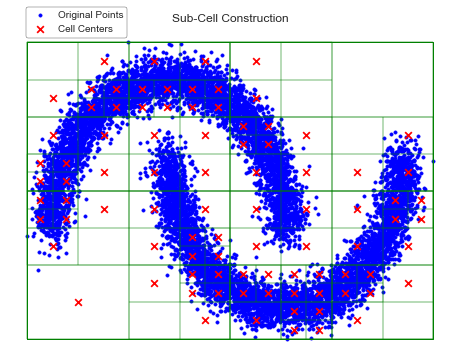

In [52]:
S_moons = coreset_construction(moons, k, d, eps, len(moons)); 

# K means for moons

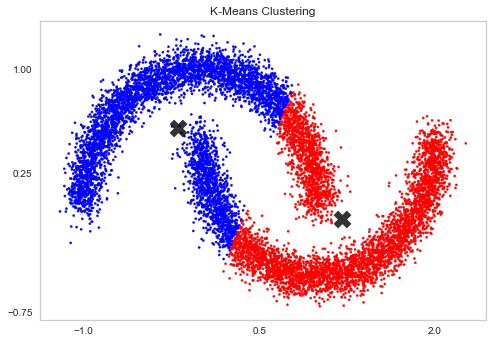

In [39]:
kmeans_moons = KMeans(n_clusters=2, random_state=0)
y_kmeans_moons = kmeans_moons.fit_predict(moons)

plt.scatter(moons[:, 0], moons[:, 1], c=y_kmeans_moons, s=5, cmap='bwr')
centers_moons = kmeans_moons.cluster_centers_
plt.scatter(centers_moons[:, 0], centers_moons[:, 1], c='black', s=300, alpha=0.8, marker='X')
plt.title('K-Means Clustering')
plt.grid(which='major')

x_ticks = [-1,0.5,2]
plt.xticks(x_ticks)

y_ticks = [-0.75,0.25,1]
plt.yticks(y_ticks)
plt.show()

In [18]:
silhouette_score_moons = metrics.silhouette_score(moons, y_kmeans_moons)
inertia_moons = kmeans_moons.inertia_

print(f"Silhouette Score: {silhouette_score_moons}") #how well-separated the clusters are
print(f"Inertia: {inertia_moons}") # how far the points within a cluster are from the center of that cluster.

Silhouette Score: 0.48811580965749146
Inertia: 4085.2056641854706


# K means for coreset of moons

In [19]:
coordinates_moons = np.array([item[0] for item in S_moons])
coreset_array_moons = coordinates_moons.reshape(-1, 2)
coreset_array_moons[0:5]

array([[-0.768625  , -0.46625   ],
       [ 0.3148125 , -0.588625  ],
       [-0.1185625 , -0.343875  ],
       [ 0.20646875, -0.4050625 ],
       [ 0.42315625, -0.4050625 ]])

C:\Users\Stasius\AppData\Roaming\Python\Python38\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


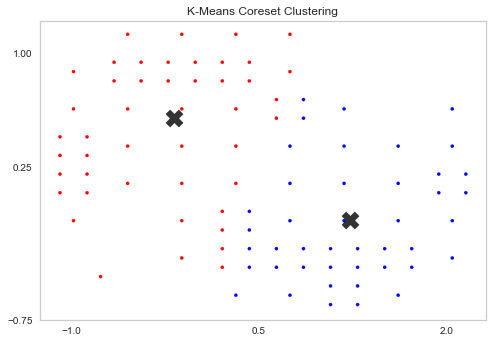

In [41]:
corekmeans_moons = KMeans(n_clusters=2, random_state=0)
y_corekmeans_moons = corekmeans_moons.fit_predict(coreset_array_moons, sample_weight= [item[1] for item in S_moons])

plt.scatter(coreset_array_moons[:, 0], coreset_array_moons[:, 1], c=y_corekmeans_moons, s=10, cmap='bwr')
corecenters_moons = corekmeans_moons.cluster_centers_
plt.scatter(corecenters_moons[:, 0], corecenters_moons[:, 1], c='black', s=300, alpha=0.8, marker='X')
plt.title('K-Means Coreset Clustering')
plt.grid(which='major')

x_ticks = [-1,0.5,2]
plt.xticks(x_ticks)

y_ticks = [-0.75,0.25,1]
plt.yticks(y_ticks)
plt.show()

In [21]:
silhouette_score_core_moons = metrics.silhouette_score(coreset_array_moons, y_corekmeans_moons)
inertia_core_moons = corekmeans_moons.inertia_

print(f"Silhouette Score: {silhouette_score_core_moons}") #how well-separated the clusters are
print(f"Inertia: {inertia_core_moons}") # how far the points within a cluster are from the center of that cluster.

Silhouette Score: 0.45549599194472734
Inertia: 4272.425805525627


# Circles

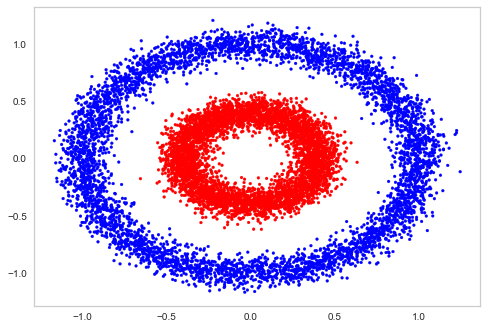

In [50]:
circles, circles_labels = sk.datasets.make_circles(n_samples=n, random_state=1, noise = 0.07, factor=0.4)
circles = circles.round(3)
plt.scatter(circles[:, 0], circles[:, 1], c=circles_labels, cmap="bwr", s=8)
plt.grid(which='major');

The array is non-empty, proceeding with coreset construction algorithm
delta = 6
cs = 91
Number of guesses for opt approximation = 94

Iteration j = 0, with approximation Opt = (1+eps)^j = 1.0

Threshold value: 0.09375 Points in cell: 9998
Threshold value: 0.1875 Points in cell: 2666
Threshold value: 0.375 Points in cell: 290
Threshold value: 0.75 Points in cell: 0
Threshold value: 0.75 Points in cell: 24
Threshold value: 1.5 Points in cell: 0
Threshold value: 1.5 Points in cell: 0
Threshold value: 1.5 Points in cell: 3
Threshold value: 3.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 1
Threshold value: 3.0 Points in cell: 2
Threshold value: 1.5 Points in cell: 21
Threshold value: 3.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 1
Threshold value: 6.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 4
Thres

Threshold value: 1.5 Points in cell: 247
Threshold value: 3.0 Points in cell: 58
Threshold value: 6.0 Points in cell: 9
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 12
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 5
Threshold value: 6.0 Points in cell: 14
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 5
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 23
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 5
Threshold value: 12.0 Points in cell: 7
Threshold value: 12.0 Points in cell: 9
Threshold value: 3.0 Points in cell: 60
Threshold value: 6.0 Points in cell: 19
Threshold value: 12.0 Points in cell: 8


Threshold value: 12.0 Points in cell: 5
Threshold value: 6.0 Points in cell: 5
Threshold value: 1.5 Points in cell: 24
Threshold value: 3.0 Points in cell: 1
Threshold value: 3.0 Points in cell: 0
Threshold value: 3.0 Points in cell: 18
Threshold value: 6.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 1
Threshold value: 6.0 Points in cell: 7
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 1
Threshold value: 3.0 Points in cell: 5
Threshold value: 6.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 0
Threshold value: 1.5 Points in cell: 202
Threshold value: 3.0 Points in cell: 58
Threshold v

Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 0
Threshold value: 1.5 Points in cell: 85
Threshold value: 3.0 Points in cell: 19
Threshold value: 6.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 5
Threshold value: 6.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 10
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 5
Threshold value: 3.0 Points in cell: 20
Threshold value: 6.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 0
Threshold value: 6.0 Points in cell: 1
Threshold

Threshold value: 0.75 Points in cell: 215
Threshold value: 1.5 Points in cell: 96
Threshold value: 3.0 Points in cell: 16
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 1
Threshold value: 6.0 Points in cell: 9
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 3
Threshold value: 3.0 Points in cell: 21
Threshold value: 6.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 9
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 4
Threshold value: 3.0 Points in cell: 27
Threshold value: 6.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 1
Thresho

Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 4
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 1
Threshold value: 3.0 Points in cell: 22
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 5
Threshold value: 6.0 Points in cell: 8
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 3
Threshold value: 12.0 Points in cell: 4
Threshold value: 6.0 Points in cell: 6
Threshold value: 12.0 Points in cell: 1
Threshold value: 12.0 Points in cell: 0
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 3
Threshold value: 1.5 Points in cell: 70
Threshold value: 3.0 Points in cell: 23
Threshold value: 6.0 Points in cell: 2
Threshold value: 6.0 Points in cell: 3
Threshold value: 6.0 Points in cell: 9
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 2
Threshold value: 12.0 Points in cell: 0
Thresho

Threshold value: 0.825 Points in cell: 129
Threshold value: 1.65 Points in cell: 0
Threshold value: 1.65 Points in cell: 14
Threshold value: 3.3 Points in cell: 0
Threshold value: 3.3 Points in cell: 3
Threshold value: 3.3 Points in cell: 0
Threshold value: 3.3 Points in cell: 11
Threshold value: 6.6 Points in cell: 1
Threshold value: 6.6 Points in cell: 3
Threshold value: 6.6 Points in cell: 2
Threshold value: 6.6 Points in cell: 5
Threshold value: 1.65 Points in cell: 7
Threshold value: 3.3 Points in cell: 0
Threshold value: 3.3 Points in cell: 1
Threshold value: 3.3 Points in cell: 3
Threshold value: 3.3 Points in cell: 3
Threshold value: 1.65 Points in cell: 108
Threshold value: 3.3 Points in cell: 11
Threshold value: 6.6 Points in cell: 1
Threshold value: 6.6 Points in cell: 0
Threshold value: 6.6 Points in cell: 0
Threshold value: 6.6 Points in cell: 10
Threshold value: 13.2 Points in cell: 1
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 3
Threshol

Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 2
Threshold value: 3.3 Points in cell: 58
Threshold value: 6.6 Points in cell: 24
Threshold value: 13.2 Points in cell: 6
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 7
Threshold value: 13.2 Points in cell: 6
Threshold value: 6.6 Points in cell: 10
Threshold value: 13.2 Points in cell: 0
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 3
Threshold value: 6.6 Points in cell: 11
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 1
Threshold value: 6.6 Points in cell: 13
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 5
Threshold value: 0.825 Points in cell: 41
Threshold value: 1.65 Points in cell: 

Threshold value: 6.6 Points in cell: 5
Threshold value: 6.6 Points in cell: 2
Threshold value: 3.3 Points in cell: 1
Threshold value: 1.65 Points in cell: 0
Threshold value: 1.65 Points in cell: 140
Threshold value: 3.3 Points in cell: 31
Threshold value: 6.6 Points in cell: 6
Threshold value: 6.6 Points in cell: 2
Threshold value: 6.6 Points in cell: 11
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 3
Threshold value: 6.6 Points in cell: 12
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 0
Threshold value: 13.2 Points in cell: 9
Threshold value: 13.2 Points in cell: 1
Threshold value: 3.3 Points in cell: 14
Threshold value: 6.6 Points in cell: 3
Threshold value: 6.6 Points in cell: 2
Threshold value: 6.6 Points in cell: 6
Threshold value: 6.6 Points in cell: 3
Threshold value: 3.3 Points in cell: 57
Threshold value: 6.6 Points in cell: 19
Thresho

Threshold value: 6.6 Points in cell: 17
Threshold value: 13.2 Points in cell: 1
Threshold value: 13.2 Points in cell: 7
Threshold value: 13.2 Points in cell: 7
Threshold value: 13.2 Points in cell: 2
Threshold value: 3.3 Points in cell: 50
Threshold value: 6.6 Points in cell: 11
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 1
Threshold value: 13.2 Points in cell: 5
Threshold value: 13.2 Points in cell: 2
Threshold value: 6.6 Points in cell: 16
Threshold value: 13.2 Points in cell: 2
Threshold value: 13.2 Points in cell: 6
Threshold value: 13.2 Points in cell: 1
Threshold value: 13.2 Points in cell: 7
Threshold value: 6.6 Points in cell: 12
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 1
Threshold value: 13.2 Points in cell: 3
Threshold value: 13.2 Points in cell: 5
Threshold value: 6.6 Points in cell: 11
Threshold value: 13.2 Points in cell: 7
Threshold value: 13.2 Points in cell: 0
Threshold value: 13.2 Points in cell: 3


Threshold value: 7.26 Points in cell: 3
Threshold value: 1.815 Points in cell: 82
Threshold value: 3.63 Points in cell: 23
Threshold value: 7.26 Points in cell: 6
Threshold value: 7.26 Points in cell: 4
Threshold value: 7.26 Points in cell: 9
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 1
Threshold value: 7.26 Points in cell: 4
Threshold value: 3.63 Points in cell: 28
Threshold value: 7.26 Points in cell: 4
Threshold value: 7.26 Points in cell: 6
Threshold value: 7.26 Points in cell: 9
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 5
Threshold value: 14.52 Points in cell: 0
Threshold value: 7.26 Points in cell: 9
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 2
Threshold value: 3.63 Po

Threshold value: 1.815 Points in cell: 89
Threshold value: 3.63 Points in cell: 22
Threshold value: 7.26 Points in cell: 5
Threshold value: 7.26 Points in cell: 7
Threshold value: 7.26 Points in cell: 4
Threshold value: 7.26 Points in cell: 6
Threshold value: 3.63 Points in cell: 29
Threshold value: 7.26 Points in cell: 10
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 2
Threshold value: 7.26 Points in cell: 3
Threshold value: 7.26 Points in cell: 13
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 3
Threshold value: 14.52 Points in cell: 4
Threshold value: 7.26 Points in cell: 3
Threshold value: 3.63 Points in cell: 16
Threshold value: 7.26 Points in cell: 3
Threshold value: 7.26 Points in cell: 6
Threshold value: 7.26 Points in cell: 5
Threshold value: 7.26 Points in cell: 2
Threshold value: 3.63 Poi

Threshold value: 0.45375 Points in cell: 1306
Threshold value: 0.9075 Points in cell: 543
Threshold value: 1.815 Points in cell: 104
Threshold value: 3.63 Points in cell: 8
Threshold value: 7.26 Points in cell: 1
Threshold value: 7.26 Points in cell: 3
Threshold value: 7.26 Points in cell: 1
Threshold value: 7.26 Points in cell: 3
Threshold value: 3.63 Points in cell: 53
Threshold value: 7.26 Points in cell: 15
Threshold value: 14.52 Points in cell: 6
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 3
Threshold value: 7.26 Points in cell: 17
Threshold value: 14.52 Points in cell: 6
Threshold value: 14.52 Points in cell: 6
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 1
Threshold value: 7.26 Points in cell: 8
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 2
Threshold va

Threshold value: 7.26 Points in cell: 2
Threshold value: 7.26 Points in cell: 2
Threshold value: 3.63 Points in cell: 1
Threshold value: 1.815 Points in cell: 132
Threshold value: 3.63 Points in cell: 64
Threshold value: 7.26 Points in cell: 26
Threshold value: 14.52 Points in cell: 9
Threshold value: 14.52 Points in cell: 8
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 5
Threshold value: 7.26 Points in cell: 13
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 6
Threshold value: 14.52 Points in cell: 1
Threshold value: 14.52 Points in cell: 5
Threshold value: 7.26 Points in cell: 13
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 4
Threshold value: 14.52 Points in cell: 3
Threshold value: 7.26 Points in cell: 12
Threshold value: 14.52 Points in cell: 5
Threshold value: 14.52 Points in cell: 2
Threshold value: 14.52 Points in cell: 2
Threshold value: 

Threshold value: 7.986 Points in cell: 2
Threshold value: 7.986 Points in cell: 1
Threshold value: 7.986 Points in cell: 0
Threshold value: 7.986 Points in cell: 1
Threshold value: 3.993 Points in cell: 19
Threshold value: 7.986 Points in cell: 3
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 8
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 1
Threshold value: 3.993 Points in cell: 9
Threshold value: 7.986 Points in cell: 2
Threshold value: 7.986 Points in cell: 2
Threshold value: 7.986 Points in cell: 2
Threshold value: 7.986 Points in cell: 3
Threshold value: 1.9965 Points in cell: 82
Threshold value: 3.993 Points in cell: 23
Threshold value: 7.986 Points in cell: 6
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 9
Threshold value: 15.972 Points in cell: 4
Thresho

Threshold value: 7.986 Points in cell: 5
Threshold value: 7.986 Points in cell: 0
Threshold value: 7.986 Points in cell: 3
Threshold value: 3.993 Points in cell: 21
Threshold value: 7.986 Points in cell: 6
Threshold value: 7.986 Points in cell: 7
Threshold value: 7.986 Points in cell: 3
Threshold value: 7.986 Points in cell: 5
Threshold value: 3.993 Points in cell: 2
Threshold value: 3.993 Points in cell: 6
Threshold value: 7.986 Points in cell: 2
Threshold value: 7.986 Points in cell: 2
Threshold value: 7.986 Points in cell: 0
Threshold value: 7.986 Points in cell: 2
Threshold value: 1.9965 Points in cell: 89
Threshold value: 3.993 Points in cell: 22
Threshold value: 7.986 Points in cell: 5
Threshold value: 7.986 Points in cell: 7
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 6
Threshold value: 3.993 Points in cell: 29
Threshold value: 7.986 Points in cell: 10
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 2
Threshol

Threshold value: 7.986 Points in cell: 4
Threshold value: 3.993 Points in cell: 6
Threshold value: 7.986 Points in cell: 1
Threshold value: 7.986 Points in cell: 1
Threshold value: 7.986 Points in cell: 3
Threshold value: 7.986 Points in cell: 1
Threshold value: 1.9965 Points in cell: 1
Threshold value: 1.9965 Points in cell: 76
Threshold value: 3.993 Points in cell: 21
Threshold value: 7.986 Points in cell: 8
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 0
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 3
Threshold value: 7.986 Points in cell: 4
Threshold value: 7.986 Points in cell: 5
Threshold value: 7.986 Points in cell: 4
Threshold value: 3.993 Points in cell: 7
Threshold value: 7.986 Points in cell: 2
Threshold value: 7.986 Points in cell: 0
Threshold value: 7.986 Points in cell: 2
Threshold value: 7.986 Points in cell: 3
Threshold value: 3.993 Points in cell: 23
Threshold value: 7.986 Points in cell: 9
Thresho

Threshold value: 15.972 Points in cell: 6
Threshold value: 3.993 Points in cell: 64
Threshold value: 7.986 Points in cell: 20
Threshold value: 15.972 Points in cell: 6
Threshold value: 15.972 Points in cell: 7
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 3
Threshold value: 7.986 Points in cell: 14
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 4
Threshold value: 15.972 Points in cell: 5
Threshold value: 7.986 Points in cell: 17
Threshold value: 15.972 Points in cell: 7
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 5
Threshold value: 15.972 Points in cell: 2
Threshold value: 7.986 Points in cell: 13
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 2
Threshold value: 15.972 Points in cell: 3
Threshold value: 15.972 Points in cell: 5
Threshold value: 0.99825 Points in cell: 366
Threshold value: 1.9965 Points 

Threshold value: 8.7846 Points in cell: 0
Threshold value: 4.3923 Points in cell: 14
Threshold value: 8.7846 Points in cell: 4
Threshold value: 8.7846 Points in cell: 1
Threshold value: 8.7846 Points in cell: 4
Threshold value: 8.7846 Points in cell: 5
Threshold value: 4.3923 Points in cell: 25
Threshold value: 8.7846 Points in cell: 6
Threshold value: 8.7846 Points in cell: 7
Threshold value: 8.7846 Points in cell: 5
Threshold value: 8.7846 Points in cell: 7
Threshold value: 4.3923 Points in cell: 31
Threshold value: 8.7846 Points in cell: 4
Threshold value: 8.7846 Points in cell: 10
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 1
Threshold value: 8.7846 Points in cell: 9
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 1
Threshold value: 17.5692 Points in cell: 1
Threshold value: 8.784

Threshold value: 4.3923 Points in cell: 6
Threshold value: 8.7846 Points in cell: 1
Threshold value: 8.7846 Points in cell: 3
Threshold value: 8.7846 Points in cell: 0
Threshold value: 8.7846 Points in cell: 2
Threshold value: 4.3923 Points in cell: 2
Threshold value: 4.3923 Points in cell: 5
Threshold value: 8.7846 Points in cell: 1
Threshold value: 8.7846 Points in cell: 3
Threshold value: 8.7846 Points in cell: 1
Threshold value: 8.7846 Points in cell: 0
Threshold value: 0.54904 Points in cell: 208
Threshold value: 1.09808 Points in cell: 6
Threshold value: 2.19615 Points in cell: 0
Threshold value: 2.19615 Points in cell: 0
Threshold value: 2.19615 Points in cell: 6
Threshold value: 4.3923 Points in cell: 0
Threshold value: 4.3923 Points in cell: 0
Threshold value: 4.3923 Points in cell: 4
Threshold value: 4.3923 Points in cell: 2
Threshold value: 2.19615 Points in cell: 0
Threshold value: 1.09808 Points in cell: 0
Threshold value: 1.09808 Points in cell: 197
Threshold value: 2.196

Threshold value: 8.7846 Points in cell: 4
Threshold value: 4.3923 Points in cell: 61
Threshold value: 8.7846 Points in cell: 20
Threshold value: 17.5692 Points in cell: 8
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 5
Threshold value: 8.7846 Points in cell: 14
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 7
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 2
Threshold value: 8.7846 Points in cell: 16
Threshold value: 17.5692 Points in cell: 3
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 6
Threshold value: 17.5692 Points in cell: 3
Threshold value: 8.7846 Points in cell: 11
Threshold value: 17.5692 Points in cell: 0
Threshold value: 17.5692 Points in cell: 5
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 2
Threshold value: 4.3923 Points in cell: 30
Threshold va

Threshold value: 8.7846 Points in cell: 5
Threshold value: 8.7846 Points in cell: 5
Threshold value: 8.7846 Points in cell: 5
Threshold value: 8.7846 Points in cell: 1
Threshold value: 2.19615 Points in cell: 45
Threshold value: 4.3923 Points in cell: 25
Threshold value: 8.7846 Points in cell: 12
Threshold value: 17.5692 Points in cell: 4
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 2
Threshold value: 17.5692 Points in cell: 4
Threshold value: 8.7846 Points in cell: 5
Threshold value: 8.7846 Points in cell: 6
Threshold value: 8.7846 Points in cell: 2
Threshold value: 4.3923 Points in cell: 16
Threshold value: 8.7846 Points in cell: 7
Threshold value: 8.7846 Points in cell: 7
Threshold value: 8.7846 Points in cell: 1
Threshold value: 8.7846 Points in cell: 1
Threshold value: 4.3923 Points in cell: 3
Threshold value: 4.3923 Points in cell: 1
Threshold value: 2.19615 Points in cell: 12
Threshold value: 4.3923 Points in cell: 8
Threshold value: 8.7846

Threshold value: 19.32612 Points in cell: 3
Threshold value: 19.32612 Points in cell: 1
Threshold value: 19.32612 Points in cell: 5
Threshold value: 19.32612 Points in cell: 4
Threshold value: 1.20788 Points in cell: 566
Threshold value: 2.41577 Points in cell: 40
Threshold value: 4.83153 Points in cell: 3
Threshold value: 4.83153 Points in cell: 4
Threshold value: 4.83153 Points in cell: 11
Threshold value: 9.66306 Points in cell: 1
Threshold value: 9.66306 Points in cell: 2
Threshold value: 9.66306 Points in cell: 5
Threshold value: 9.66306 Points in cell: 3
Threshold value: 4.83153 Points in cell: 22
Threshold value: 9.66306 Points in cell: 4
Threshold value: 9.66306 Points in cell: 5
Threshold value: 9.66306 Points in cell: 7
Threshold value: 9.66306 Points in cell: 6
Threshold value: 2.41577 Points in cell: 85
Threshold value: 4.83153 Points in cell: 7
Threshold value: 9.66306 Points in cell: 0
Threshold value: 9.66306 Points in cell: 0
Threshold value: 9.66306 Points in cell: 2
T

Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 0
Threshold value: 4.83153 Points in cell: 69
Threshold value: 9.66306 Points in cell: 17
Threshold value: 19.32612 Points in cell: 3
Threshold value: 19.32612 Points in cell: 7
Threshold value: 19.32612 Points in cell: 6
Threshold value: 19.32612 Points in cell: 1
Threshold value: 9.66306 Points in cell: 21
Threshold value: 19.32612 Points in cell: 7
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 5
Threshold value: 19.32612 Points in cell: 5
Threshold value: 9.66306 Points in cell: 15
Threshold value: 19.32612 Points in cell: 2
Threshold value: 19.32612 Points in cell: 6
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 3
Threshold value: 9.66306 Points in cell: 16
Threshold value: 19.32612 Points in cell: 4
Threshold value: 19.32612 Points in cell: 5
Threshold value: 19.32612 Points

Threshold value: 4.83153 Points in cell: 8
Threshold value: 9.66306 Points in cell: 1
Threshold value: 9.66306 Points in cell: 0
Threshold value: 9.66306 Points in cell: 3
Threshold value: 9.66306 Points in cell: 4
Threshold value: 2.41577 Points in cell: 15
Threshold value: 4.83153 Points in cell: 2
Threshold value: 4.83153 Points in cell: 0
Threshold value: 4.83153 Points in cell: 4
Threshold value: 4.83153 Points in cell: 9
Threshold value: 9.66306 Points in cell: 2
Threshold value: 9.66306 Points in cell: 1
Threshold value: 9.66306 Points in cell: 6
Threshold value: 9.66306 Points in cell: 0
Threshold value: 1.20788 Points in cell: 123
Threshold value: 2.41577 Points in cell: 40
Threshold value: 4.83153 Points in cell: 10
Threshold value: 9.66306 Points in cell: 2
Threshold value: 9.66306 Points in cell: 3
Threshold value: 9.66306 Points in cell: 2
Threshold value: 9.66306 Points in cell: 3
Threshold value: 4.83153 Points in cell: 19
Threshold value: 9.66306 Points in cell: 7
Thres

Threshold value: 10.62937 Points in cell: 2
Threshold value: 10.62937 Points in cell: 6
Threshold value: 10.62937 Points in cell: 6
Threshold value: 2.65734 Points in cell: 75
Threshold value: 5.31468 Points in cell: 5
Threshold value: 5.31468 Points in cell: 14
Threshold value: 10.62937 Points in cell: 4
Threshold value: 10.62937 Points in cell: 1
Threshold value: 10.62937 Points in cell: 4
Threshold value: 10.62937 Points in cell: 5
Threshold value: 5.31468 Points in cell: 25
Threshold value: 10.62937 Points in cell: 6
Threshold value: 10.62937 Points in cell: 7
Threshold value: 10.62937 Points in cell: 5
Threshold value: 10.62937 Points in cell: 7
Threshold value: 5.31468 Points in cell: 31
Threshold value: 10.62937 Points in cell: 4
Threshold value: 10.62937 Points in cell: 10
Threshold value: 10.62937 Points in cell: 9
Threshold value: 10.62937 Points in cell: 8
Threshold value: 2.65734 Points in cell: 86
Threshold value: 5.31468 Points in cell: 19
Threshold value: 10.62937 Points

Threshold value: 1.32867 Points in cell: 471
Threshold value: 2.65734 Points in cell: 66
Threshold value: 5.31468 Points in cell: 11
Threshold value: 10.62937 Points in cell: 2
Threshold value: 10.62937 Points in cell: 0
Threshold value: 10.62937 Points in cell: 4
Threshold value: 10.62937 Points in cell: 5
Threshold value: 5.31468 Points in cell: 3
Threshold value: 5.31468 Points in cell: 31
Threshold value: 10.62937 Points in cell: 10
Threshold value: 10.62937 Points in cell: 5
Threshold value: 10.62937 Points in cell: 6
Threshold value: 10.62937 Points in cell: 10
Threshold value: 5.31468 Points in cell: 21
Threshold value: 10.62937 Points in cell: 4
Threshold value: 10.62937 Points in cell: 2
Threshold value: 10.62937 Points in cell: 10
Threshold value: 10.62937 Points in cell: 5
Threshold value: 2.65734 Points in cell: 24
Threshold value: 5.31468 Points in cell: 1
Threshold value: 5.31468 Points in cell: 0
Threshold value: 5.31468 Points in cell: 18
Threshold value: 10.62937 Point

Threshold value: 21.25873 Points in cell: 6
Threshold value: 21.25873 Points in cell: 4
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 3
Threshold value: 10.62937 Points in cell: 14
Threshold value: 21.25873 Points in cell: 2
Threshold value: 21.25873 Points in cell: 3
Threshold value: 21.25873 Points in cell: 4
Threshold value: 21.25873 Points in cell: 5
Threshold value: 5.31468 Points in cell: 36
Threshold value: 10.62937 Points in cell: 6
Threshold value: 10.62937 Points in cell: 17
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 4
Threshold value: 21.25873 Points in cell: 3
Threshold value: 21.25873 Points in cell: 3
Threshold value: 10.62937 Points in cell: 4
Threshold value: 10.62937 Points in cell: 9
Threshold value: 5.31468 Points in cell: 50
Threshold value: 10.62937 Points in cell: 16
Threshold value: 21.25873 Points in cell: 7
Threshold value: 21.25873 Points in cell: 3
Threshold value: 21.25873 Poi

Threshold value: 1.32867 Points in cell: 185
Threshold value: 2.65734 Points in cell: 68
Threshold value: 5.31468 Points in cell: 20
Threshold value: 10.62937 Points in cell: 3
Threshold value: 10.62937 Points in cell: 7
Threshold value: 10.62937 Points in cell: 5
Threshold value: 10.62937 Points in cell: 5
Threshold value: 5.31468 Points in cell: 17
Threshold value: 10.62937 Points in cell: 7
Threshold value: 10.62937 Points in cell: 3
Threshold value: 10.62937 Points in cell: 3
Threshold value: 10.62937 Points in cell: 4
Threshold value: 5.31468 Points in cell: 16
Threshold value: 10.62937 Points in cell: 2
Threshold value: 10.62937 Points in cell: 4
Threshold value: 10.62937 Points in cell: 6
Threshold value: 10.62937 Points in cell: 4
Threshold value: 5.31468 Points in cell: 15
Threshold value: 10.62937 Points in cell: 3
Threshold value: 10.62937 Points in cell: 5
Threshold value: 10.62937 Points in cell: 2
Threshold value: 10.62937 Points in cell: 5
Threshold value: 2.65734 Points

Threshold value: 11.6923 Points in cell: 3
Threshold value: 5.84615 Points in cell: 2
Threshold value: 2.92308 Points in cell: 20
Threshold value: 5.84615 Points in cell: 11
Threshold value: 11.6923 Points in cell: 4
Threshold value: 11.6923 Points in cell: 4
Threshold value: 11.6923 Points in cell: 2
Threshold value: 11.6923 Points in cell: 1
Threshold value: 5.84615 Points in cell: 7
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 1
Threshold value: 11.6923 Points in cell: 0
Threshold value: 5.84615 Points in cell: 2
Threshold value: 5.84615 Points in cell: 0
Threshold value: 2.92308 Points in cell: 17
Threshold value: 5.84615 Points in cell: 10
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 1
Threshold value: 5.84615 Points in cell: 1
Threshold value: 5.84615 Points in cell: 5
Thresho

Threshold value: 23.38461 Points in cell: 10
Threshold value: 23.38461 Points in cell: 2
Threshold value: 23.38461 Points in cell: 6
Threshold value: 11.6923 Points in cell: 17
Threshold value: 23.38461 Points in cell: 5
Threshold value: 23.38461 Points in cell: 6
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 3
Threshold value: 5.84615 Points in cell: 25
Threshold value: 11.6923 Points in cell: 9
Threshold value: 11.6923 Points in cell: 4
Threshold value: 11.6923 Points in cell: 8
Threshold value: 11.6923 Points in cell: 4
Threshold value: 5.84615 Points in cell: 61
Threshold value: 11.6923 Points in cell: 20
Threshold value: 23.38461 Points in cell: 8
Threshold value: 23.38461 Points in cell: 4
Threshold value: 23.38461 Points in cell: 3
Threshold value: 23.38461 Points in cell: 5
Threshold value: 11.6923 Points in cell: 14
Threshold value: 23.38461 Points in cell: 2
Threshold value: 23.38461 Points in cell: 7
Threshold value: 23.38461 Points in

Threshold value: 11.6923 Points in cell: 4
Threshold value: 11.6923 Points in cell: 5
Threshold value: 11.6923 Points in cell: 7
Threshold value: 5.84615 Points in cell: 23
Threshold value: 11.6923 Points in cell: 4
Threshold value: 11.6923 Points in cell: 6
Threshold value: 11.6923 Points in cell: 9
Threshold value: 11.6923 Points in cell: 4
Threshold value: 5.84615 Points in cell: 26
Threshold value: 11.6923 Points in cell: 9
Threshold value: 11.6923 Points in cell: 7
Threshold value: 11.6923 Points in cell: 5
Threshold value: 11.6923 Points in cell: 5
Threshold value: 2.92308 Points in cell: 44
Threshold value: 5.84615 Points in cell: 4
Threshold value: 5.84615 Points in cell: 11
Threshold value: 11.6923 Points in cell: 3
Threshold value: 11.6923 Points in cell: 2
Threshold value: 11.6923 Points in cell: 4
Threshold value: 11.6923 Points in cell: 2
Threshold value: 5.84615 Points in cell: 12
Threshold value: 11.6923 Points in cell: 2
Threshold value: 11.6923 Points in cell: 4
Thresh

Threshold value: 12.86153 Points in cell: 20
Threshold value: 25.72307 Points in cell: 7
Threshold value: 25.72307 Points in cell: 4
Threshold value: 25.72307 Points in cell: 6
Threshold value: 25.72307 Points in cell: 3
Threshold value: 12.86153 Points in cell: 13
Threshold value: 25.72307 Points in cell: 1
Threshold value: 25.72307 Points in cell: 5
Threshold value: 25.72307 Points in cell: 4
Threshold value: 25.72307 Points in cell: 3
Threshold value: 12.86153 Points in cell: 17
Threshold value: 25.72307 Points in cell: 5
Threshold value: 25.72307 Points in cell: 2
Threshold value: 25.72307 Points in cell: 7
Threshold value: 25.72307 Points in cell: 3
Threshold value: 6.43077 Points in cell: 32
Threshold value: 12.86153 Points in cell: 11
Threshold value: 12.86153 Points in cell: 7
Threshold value: 12.86153 Points in cell: 12
Threshold value: 12.86153 Points in cell: 2
Threshold value: 6.43077 Points in cell: 67
Threshold value: 12.86153 Points in cell: 16
Threshold value: 25.72307 

Threshold value: 25.72307 Points in cell: 4
Threshold value: 25.72307 Points in cell: 6
Threshold value: 25.72307 Points in cell: 3
Threshold value: 12.86153 Points in cell: 11
Threshold value: 6.43077 Points in cell: 30
Threshold value: 12.86153 Points in cell: 1
Threshold value: 12.86153 Points in cell: 8
Threshold value: 12.86153 Points in cell: 14
Threshold value: 25.72307 Points in cell: 3
Threshold value: 25.72307 Points in cell: 6
Threshold value: 25.72307 Points in cell: 3
Threshold value: 25.72307 Points in cell: 2
Threshold value: 12.86153 Points in cell: 7
Threshold value: 3.21538 Points in cell: 43
Threshold value: 6.43077 Points in cell: 4
Threshold value: 6.43077 Points in cell: 31
Threshold value: 12.86153 Points in cell: 8
Threshold value: 12.86153 Points in cell: 12
Threshold value: 12.86153 Points in cell: 3
Threshold value: 12.86153 Points in cell: 8
Threshold value: 6.43077 Points in cell: 3
Threshold value: 6.43077 Points in cell: 5
Threshold value: 3.21538 Points 

Threshold value: 1.60769 Points in cell: 50
Threshold value: 3.21538 Points in cell: 0
Threshold value: 3.21538 Points in cell: 0
Threshold value: 3.21538 Points in cell: 21
Threshold value: 6.43077 Points in cell: 1
Threshold value: 6.43077 Points in cell: 2
Threshold value: 6.43077 Points in cell: 8
Threshold value: 12.86153 Points in cell: 2
Threshold value: 12.86153 Points in cell: 2
Threshold value: 12.86153 Points in cell: 2
Threshold value: 12.86153 Points in cell: 2
Threshold value: 6.43077 Points in cell: 10
Threshold value: 12.86153 Points in cell: 1
Threshold value: 12.86153 Points in cell: 1
Threshold value: 12.86153 Points in cell: 3
Threshold value: 12.86153 Points in cell: 5
Threshold value: 3.21538 Points in cell: 29
Threshold value: 6.43077 Points in cell: 1
Threshold value: 6.43077 Points in cell: 4
Threshold value: 6.43077 Points in cell: 13
Threshold value: 12.86153 Points in cell: 2
Threshold value: 12.86153 Points in cell: 0
Threshold value: 12.86153 Points in cel

Threshold value: 1.76846 Points in cell: 21
Threshold value: 3.53692 Points in cell: 7
Threshold value: 7.07384 Points in cell: 5
Threshold value: 7.07384 Points in cell: 2
Threshold value: 7.07384 Points in cell: 0
Threshold value: 7.07384 Points in cell: 0
Threshold value: 3.53692 Points in cell: 13
Threshold value: 7.07384 Points in cell: 3
Threshold value: 7.07384 Points in cell: 8
Threshold value: 14.14769 Points in cell: 2
Threshold value: 14.14769 Points in cell: 4
Threshold value: 14.14769 Points in cell: 1
Threshold value: 14.14769 Points in cell: 1
Threshold value: 7.07384 Points in cell: 0
Threshold value: 7.07384 Points in cell: 2
Threshold value: 3.53692 Points in cell: 1
Threshold value: 3.53692 Points in cell: 0
Threshold value: 1.76846 Points in cell: 148
Threshold value: 3.53692 Points in cell: 41
Threshold value: 7.07384 Points in cell: 12
Threshold value: 14.14769 Points in cell: 4
Threshold value: 14.14769 Points in cell: 5
Threshold value: 14.14769 Points in cell: 

Threshold value: 1.76846 Points in cell: 227
Threshold value: 3.53692 Points in cell: 70
Threshold value: 7.07384 Points in cell: 17
Threshold value: 14.14769 Points in cell: 3
Threshold value: 14.14769 Points in cell: 7
Threshold value: 14.14769 Points in cell: 1
Threshold value: 14.14769 Points in cell: 6
Threshold value: 7.07384 Points in cell: 20
Threshold value: 14.14769 Points in cell: 2
Threshold value: 14.14769 Points in cell: 5
Threshold value: 14.14769 Points in cell: 5
Threshold value: 14.14769 Points in cell: 8
Threshold value: 7.07384 Points in cell: 11
Threshold value: 14.14769 Points in cell: 2
Threshold value: 14.14769 Points in cell: 4
Threshold value: 14.14769 Points in cell: 1
Threshold value: 14.14769 Points in cell: 4
Threshold value: 7.07384 Points in cell: 22
Threshold value: 14.14769 Points in cell: 7
Threshold value: 14.14769 Points in cell: 10
Threshold value: 14.14769 Points in cell: 2
Threshold value: 14.14769 Points in cell: 3
Threshold value: 3.53692 Point

Threshold value: 3.89061 Points in cell: 86
Threshold value: 7.78123 Points in cell: 19
Threshold value: 15.56245 Points in cell: 2
Threshold value: 15.56245 Points in cell: 3
Threshold value: 15.56245 Points in cell: 8
Threshold value: 15.56245 Points in cell: 6
Threshold value: 7.78123 Points in cell: 26
Threshold value: 15.56245 Points in cell: 7
Threshold value: 15.56245 Points in cell: 4
Threshold value: 15.56245 Points in cell: 6
Threshold value: 15.56245 Points in cell: 9
Threshold value: 7.78123 Points in cell: 22
Threshold value: 15.56245 Points in cell: 6
Threshold value: 15.56245 Points in cell: 3
Threshold value: 15.56245 Points in cell: 8
Threshold value: 15.56245 Points in cell: 5
Threshold value: 7.78123 Points in cell: 19
Threshold value: 15.56245 Points in cell: 6
Threshold value: 15.56245 Points in cell: 4
Threshold value: 15.56245 Points in cell: 2
Threshold value: 15.56245 Points in cell: 7
Threshold value: 1.94531 Points in cell: 230
Threshold value: 3.89061 Points

Threshold value: 3.89061 Points in cell: 219
Threshold value: 7.78123 Points in cell: 63
Threshold value: 15.56245 Points in cell: 19
Threshold value: 31.12491 Points in cell: 6
Threshold value: 31.12491 Points in cell: 7
Threshold value: 31.12491 Points in cell: 1
Threshold value: 31.12491 Points in cell: 5
Threshold value: 15.56245 Points in cell: 16
Threshold value: 31.12491 Points in cell: 3
Threshold value: 31.12491 Points in cell: 7
Threshold value: 31.12491 Points in cell: 5
Threshold value: 31.12491 Points in cell: 1
Threshold value: 15.56245 Points in cell: 14
Threshold value: 15.56245 Points in cell: 14
Threshold value: 7.78123 Points in cell: 46
Threshold value: 15.56245 Points in cell: 12
Threshold value: 15.56245 Points in cell: 10
Threshold value: 15.56245 Points in cell: 14
Threshold value: 15.56245 Points in cell: 10
Threshold value: 7.78123 Points in cell: 69
Threshold value: 15.56245 Points in cell: 17
Threshold value: 31.12491 Points in cell: 3
Threshold value: 31.12

Threshold value: 15.56245 Points in cell: 2
Threshold value: 3.89061 Points in cell: 4
Threshold value: 7.78123 Points in cell: 4
Threshold value: 7.78123 Points in cell: 0
Threshold value: 7.78123 Points in cell: 0
Threshold value: 7.78123 Points in cell: 0
Threshold value: 1.94531 Points in cell: 392
Threshold value: 3.89061 Points in cell: 205
Threshold value: 7.78123 Points in cell: 55
Threshold value: 15.56245 Points in cell: 15
Threshold value: 15.56245 Points in cell: 11
Threshold value: 15.56245 Points in cell: 12
Threshold value: 15.56245 Points in cell: 17
Threshold value: 31.12491 Points in cell: 7
Threshold value: 31.12491 Points in cell: 5
Threshold value: 31.12491 Points in cell: 1
Threshold value: 31.12491 Points in cell: 4
Threshold value: 7.78123 Points in cell: 58
Threshold value: 15.56245 Points in cell: 15
Threshold value: 15.56245 Points in cell: 11
Threshold value: 15.56245 Points in cell: 15
Threshold value: 15.56245 Points in cell: 17
Threshold value: 31.12491 P

Threshold value: 4.27968 Points in cell: 209
Threshold value: 8.55935 Points in cell: 46
Threshold value: 17.1187 Points in cell: 7
Threshold value: 17.1187 Points in cell: 10
Threshold value: 17.1187 Points in cell: 7
Threshold value: 17.1187 Points in cell: 22
Threshold value: 34.2374 Points in cell: 7
Threshold value: 34.2374 Points in cell: 8
Threshold value: 34.2374 Points in cell: 4
Threshold value: 34.2374 Points in cell: 3
Threshold value: 8.55935 Points in cell: 61
Threshold value: 17.1187 Points in cell: 13
Threshold value: 17.1187 Points in cell: 22
Threshold value: 34.2374 Points in cell: 6
Threshold value: 34.2374 Points in cell: 5
Threshold value: 34.2374 Points in cell: 7
Threshold value: 34.2374 Points in cell: 4
Threshold value: 17.1187 Points in cell: 15
Threshold value: 17.1187 Points in cell: 11
Threshold value: 8.55935 Points in cell: 53
Threshold value: 17.1187 Points in cell: 12
Threshold value: 17.1187 Points in cell: 7
Threshold value: 17.1187 Points in cell: 1

Threshold value: 4.27968 Points in cell: 216
Threshold value: 8.55935 Points in cell: 64
Threshold value: 17.1187 Points in cell: 10
Threshold value: 17.1187 Points in cell: 19
Threshold value: 34.2374 Points in cell: 5
Threshold value: 34.2374 Points in cell: 3
Threshold value: 34.2374 Points in cell: 9
Threshold value: 34.2374 Points in cell: 2
Threshold value: 17.1187 Points in cell: 12
Threshold value: 17.1187 Points in cell: 23
Threshold value: 34.2374 Points in cell: 4
Threshold value: 34.2374 Points in cell: 8
Threshold value: 34.2374 Points in cell: 4
Threshold value: 34.2374 Points in cell: 7
Threshold value: 8.55935 Points in cell: 42
Threshold value: 17.1187 Points in cell: 8
Threshold value: 17.1187 Points in cell: 12
Threshold value: 17.1187 Points in cell: 17
Threshold value: 17.1187 Points in cell: 5
Threshold value: 8.55935 Points in cell: 48
Threshold value: 17.1187 Points in cell: 17
Threshold value: 17.1187 Points in cell: 16
Threshold value: 17.1187 Points in cell: 

Threshold value: 2.35382 Points in cell: 230
Threshold value: 4.70764 Points in cell: 40
Threshold value: 9.41529 Points in cell: 3
Threshold value: 9.41529 Points in cell: 4
Threshold value: 9.41529 Points in cell: 11
Threshold value: 18.83057 Points in cell: 2
Threshold value: 18.83057 Points in cell: 3
Threshold value: 18.83057 Points in cell: 4
Threshold value: 18.83057 Points in cell: 2
Threshold value: 9.41529 Points in cell: 22
Threshold value: 18.83057 Points in cell: 4
Threshold value: 18.83057 Points in cell: 8
Threshold value: 18.83057 Points in cell: 4
Threshold value: 18.83057 Points in cell: 6
Threshold value: 4.70764 Points in cell: 38
Threshold value: 9.41529 Points in cell: 6
Threshold value: 9.41529 Points in cell: 4
Threshold value: 9.41529 Points in cell: 19
Threshold value: 18.83057 Points in cell: 3
Threshold value: 18.83057 Points in cell: 4
Threshold value: 18.83057 Points in cell: 4
Threshold value: 18.83057 Points in cell: 8
Threshold value: 9.41529 Points in 

Threshold value: 9.41529 Points in cell: 6
Threshold value: 9.41529 Points in cell: 0
Threshold value: 0.58846 Points in cell: 2578
Threshold value: 1.17691 Points in cell: 519
Threshold value: 2.35382 Points in cell: 218
Threshold value: 4.70764 Points in cell: 45
Threshold value: 9.41529 Points in cell: 6
Threshold value: 9.41529 Points in cell: 19
Threshold value: 18.83057 Points in cell: 5
Threshold value: 18.83057 Points in cell: 3
Threshold value: 18.83057 Points in cell: 4
Threshold value: 18.83057 Points in cell: 7
Threshold value: 9.41529 Points in cell: 3
Threshold value: 9.41529 Points in cell: 17
Threshold value: 18.83057 Points in cell: 3
Threshold value: 18.83057 Points in cell: 3
Threshold value: 18.83057 Points in cell: 5
Threshold value: 18.83057 Points in cell: 6
Threshold value: 4.70764 Points in cell: 65
Threshold value: 9.41529 Points in cell: 26
Threshold value: 18.83057 Points in cell: 6
Threshold value: 18.83057 Points in cell: 7
Threshold value: 18.83057 Points

Threshold value: 1.17691 Points in cell: 506
Threshold value: 2.35382 Points in cell: 50
Threshold value: 4.70764 Points in cell: 0
Threshold value: 4.70764 Points in cell: 0
Threshold value: 4.70764 Points in cell: 21
Threshold value: 9.41529 Points in cell: 1
Threshold value: 9.41529 Points in cell: 2
Threshold value: 9.41529 Points in cell: 8
Threshold value: 9.41529 Points in cell: 10
Threshold value: 18.83057 Points in cell: 1
Threshold value: 18.83057 Points in cell: 1
Threshold value: 18.83057 Points in cell: 3
Threshold value: 18.83057 Points in cell: 5
Threshold value: 4.70764 Points in cell: 29
Threshold value: 9.41529 Points in cell: 1
Threshold value: 9.41529 Points in cell: 4
Threshold value: 9.41529 Points in cell: 13
Threshold value: 18.83057 Points in cell: 2
Threshold value: 18.83057 Points in cell: 0
Threshold value: 18.83057 Points in cell: 6
Threshold value: 18.83057 Points in cell: 5
Threshold value: 9.41529 Points in cell: 11
Threshold value: 18.83057 Points in ce

Threshold value: 20.71363 Points in cell: 5
Threshold value: 10.35681 Points in cell: 3
Threshold value: 10.35681 Points in cell: 31
Threshold value: 20.71363 Points in cell: 10
Threshold value: 20.71363 Points in cell: 5
Threshold value: 20.71363 Points in cell: 6
Threshold value: 20.71363 Points in cell: 10
Threshold value: 10.35681 Points in cell: 21
Threshold value: 20.71363 Points in cell: 4
Threshold value: 20.71363 Points in cell: 2
Threshold value: 20.71363 Points in cell: 10
Threshold value: 20.71363 Points in cell: 5
Threshold value: 5.17841 Points in cell: 24
Threshold value: 10.35681 Points in cell: 1
Threshold value: 10.35681 Points in cell: 0
Threshold value: 10.35681 Points in cell: 18
Threshold value: 20.71363 Points in cell: 2
Threshold value: 20.71363 Points in cell: 3
Threshold value: 20.71363 Points in cell: 6
Threshold value: 20.71363 Points in cell: 7
Threshold value: 10.35681 Points in cell: 5
Threshold value: 5.17841 Points in cell: 202
Threshold value: 10.35681

Threshold value: 1.2946 Points in cell: 521
Threshold value: 2.5892 Points in cell: 70
Threshold value: 5.17841 Points in cell: 0
Threshold value: 5.17841 Points in cell: 38
Threshold value: 10.35681 Points in cell: 4
Threshold value: 10.35681 Points in cell: 16
Threshold value: 20.71363 Points in cell: 2
Threshold value: 20.71363 Points in cell: 10
Threshold value: 20.71363 Points in cell: 1
Threshold value: 20.71363 Points in cell: 3
Threshold value: 10.35681 Points in cell: 4
Threshold value: 10.35681 Points in cell: 14
Threshold value: 20.71363 Points in cell: 0
Threshold value: 20.71363 Points in cell: 7
Threshold value: 20.71363 Points in cell: 2
Threshold value: 20.71363 Points in cell: 5
Threshold value: 5.17841 Points in cell: 2
Threshold value: 5.17841 Points in cell: 30
Threshold value: 10.35681 Points in cell: 1
Threshold value: 10.35681 Points in cell: 8
Threshold value: 10.35681 Points in cell: 5
Threshold value: 10.35681 Points in cell: 16
Threshold value: 20.71363 Point

Threshold value: 22.78499 Points in cell: 5
Threshold value: 22.78499 Points in cell: 5
Threshold value: 11.3925 Points in cell: 30
Threshold value: 22.78499 Points in cell: 4
Threshold value: 22.78499 Points in cell: 7
Threshold value: 22.78499 Points in cell: 10
Threshold value: 22.78499 Points in cell: 9
Threshold value: 11.3925 Points in cell: 12
Threshold value: 22.78499 Points in cell: 0
Threshold value: 22.78499 Points in cell: 8
Threshold value: 22.78499 Points in cell: 2
Threshold value: 22.78499 Points in cell: 2
Threshold value: 11.3925 Points in cell: 30
Threshold value: 22.78499 Points in cell: 11
Threshold value: 22.78499 Points in cell: 7
Threshold value: 22.78499 Points in cell: 3
Threshold value: 22.78499 Points in cell: 9
Threshold value: 5.69625 Points in cell: 40
Threshold value: 11.3925 Points in cell: 10
Threshold value: 11.3925 Points in cell: 4
Threshold value: 11.3925 Points in cell: 16
Threshold value: 22.78499 Points in cell: 8
Threshold value: 22.78499 Point

Threshold value: 22.78499 Points in cell: 13
Threshold value: 22.78499 Points in cell: 13
Threshold value: 22.78499 Points in cell: 12
Threshold value: 11.3925 Points in cell: 17
Threshold value: 22.78499 Points in cell: 6
Threshold value: 22.78499 Points in cell: 3
Threshold value: 22.78499 Points in cell: 5
Threshold value: 22.78499 Points in cell: 3
Threshold value: 11.3925 Points in cell: 39
Threshold value: 22.78499 Points in cell: 16
Threshold value: 22.78499 Points in cell: 5
Threshold value: 22.78499 Points in cell: 9
Threshold value: 22.78499 Points in cell: 9
Threshold value: 11.3925 Points in cell: 12
Threshold value: 22.78499 Points in cell: 3
Threshold value: 22.78499 Points in cell: 1
Threshold value: 22.78499 Points in cell: 6
Threshold value: 22.78499 Points in cell: 2
Threshold value: 5.69625 Points in cell: 4
Threshold value: 2.84812 Points in cell: 392
Threshold value: 5.69625 Points in cell: 205
Threshold value: 11.3925 Points in cell: 55
Threshold value: 22.78499 P

Threshold value: 0.78323 Points in cell: 2415
Threshold value: 1.56647 Points in cell: 516
Threshold value: 3.13294 Points in cell: 223
Threshold value: 6.26587 Points in cell: 36
Threshold value: 12.53174 Points in cell: 2
Threshold value: 12.53174 Points in cell: 4
Threshold value: 12.53174 Points in cell: 17
Threshold value: 25.06349 Points in cell: 2
Threshold value: 25.06349 Points in cell: 2
Threshold value: 25.06349 Points in cell: 5
Threshold value: 25.06349 Points in cell: 8
Threshold value: 12.53174 Points in cell: 13
Threshold value: 25.06349 Points in cell: 3
Threshold value: 25.06349 Points in cell: 2
Threshold value: 25.06349 Points in cell: 5
Threshold value: 25.06349 Points in cell: 3
Threshold value: 6.26587 Points in cell: 32
Threshold value: 12.53174 Points in cell: 1
Threshold value: 12.53174 Points in cell: 2
Threshold value: 12.53174 Points in cell: 19
Threshold value: 25.06349 Points in cell: 3
Threshold value: 25.06349 Points in cell: 2
Threshold value: 25.06349

Threshold value: 12.53174 Points in cell: 25
Threshold value: 25.06349 Points in cell: 5
Threshold value: 25.06349 Points in cell: 8
Threshold value: 25.06349 Points in cell: 5
Threshold value: 25.06349 Points in cell: 7
Threshold value: 12.53174 Points in cell: 22
Threshold value: 25.06349 Points in cell: 8
Threshold value: 25.06349 Points in cell: 6
Threshold value: 25.06349 Points in cell: 3
Threshold value: 25.06349 Points in cell: 5
Threshold value: 6.26587 Points in cell: 14
Threshold value: 12.53174 Points in cell: 4
Threshold value: 12.53174 Points in cell: 10
Threshold value: 12.53174 Points in cell: 0
Threshold value: 12.53174 Points in cell: 0
Threshold value: 6.26587 Points in cell: 13
Threshold value: 12.53174 Points in cell: 7
Threshold value: 12.53174 Points in cell: 4
Threshold value: 12.53174 Points in cell: 0
Threshold value: 12.53174 Points in cell: 2
Threshold value: 0.78323 Points in cell: 2339
Threshold value: 1.56647 Points in cell: 1138
Threshold value: 3.13294 

Threshold value: 27.56984 Points in cell: 5
Threshold value: 13.78492 Points in cell: 16
Threshold value: 27.56984 Points in cell: 3
Threshold value: 27.56984 Points in cell: 4
Threshold value: 27.56984 Points in cell: 6
Threshold value: 27.56984 Points in cell: 3
Threshold value: 3.44623 Points in cell: 124
Threshold value: 6.89246 Points in cell: 9
Threshold value: 13.78492 Points in cell: 0
Threshold value: 13.78492 Points in cell: 0
Threshold value: 13.78492 Points in cell: 7
Threshold value: 13.78492 Points in cell: 2
Threshold value: 6.89246 Points in cell: 2
Threshold value: 6.89246 Points in cell: 84
Threshold value: 13.78492 Points in cell: 17
Threshold value: 27.56984 Points in cell: 4
Threshold value: 27.56984 Points in cell: 1
Threshold value: 27.56984 Points in cell: 5
Threshold value: 27.56984 Points in cell: 7
Threshold value: 13.78492 Points in cell: 14
Threshold value: 27.56984 Points in cell: 3
Threshold value: 27.56984 Points in cell: 2
Threshold value: 27.56984 Poin

Threshold value: 13.78492 Points in cell: 25
Threshold value: 27.56984 Points in cell: 12
Threshold value: 27.56984 Points in cell: 5
Threshold value: 27.56984 Points in cell: 6
Threshold value: 27.56984 Points in cell: 2
Threshold value: 13.78492 Points in cell: 16
Threshold value: 27.56984 Points in cell: 7
Threshold value: 27.56984 Points in cell: 7
Threshold value: 27.56984 Points in cell: 1
Threshold value: 27.56984 Points in cell: 1
Threshold value: 13.78492 Points in cell: 3
Threshold value: 13.78492 Points in cell: 1
Threshold value: 6.89246 Points in cell: 12
Threshold value: 13.78492 Points in cell: 8
Threshold value: 13.78492 Points in cell: 4
Threshold value: 13.78492 Points in cell: 0
Threshold value: 13.78492 Points in cell: 0
Threshold value: 3.44623 Points in cell: 19
Threshold value: 6.89246 Points in cell: 18
Threshold value: 13.78492 Points in cell: 14
Threshold value: 27.56984 Points in cell: 7
Threshold value: 27.56984 Points in cell: 4
Threshold value: 27.56984 Po

Threshold value: 15.16341 Points in cell: 24
Threshold value: 30.32682 Points in cell: 2
Threshold value: 30.32682 Points in cell: 3
Threshold value: 30.32682 Points in cell: 12
Threshold value: 30.32682 Points in cell: 7
Threshold value: 15.16341 Points in cell: 47
Threshold value: 30.32682 Points in cell: 12
Threshold value: 30.32682 Points in cell: 8
Threshold value: 30.32682 Points in cell: 15
Threshold value: 30.32682 Points in cell: 12
Threshold value: 15.16341 Points in cell: 58
Threshold value: 30.32682 Points in cell: 24
Threshold value: 30.32682 Points in cell: 10
Threshold value: 30.32682 Points in cell: 11
Threshold value: 30.32682 Points in cell: 13
Threshold value: 3.79085 Points in cell: 41
Threshold value: 7.58171 Points in cell: 0
Threshold value: 7.58171 Points in cell: 1
Threshold value: 7.58171 Points in cell: 40
Threshold value: 15.16341 Points in cell: 9
Threshold value: 15.16341 Points in cell: 0
Threshold value: 15.16341 Points in cell: 22
Threshold value: 30.32

Threshold value: 15.16341 Points in cell: 4
Threshold value: 15.16341 Points in cell: 8
Threshold value: 15.16341 Points in cell: 8
Threshold value: 15.16341 Points in cell: 17
Threshold value: 30.32682 Points in cell: 3
Threshold value: 30.32682 Points in cell: 3
Threshold value: 30.32682 Points in cell: 6
Threshold value: 30.32682 Points in cell: 5
Threshold value: 7.58171 Points in cell: 81
Threshold value: 15.16341 Points in cell: 14
Threshold value: 15.16341 Points in cell: 12
Threshold value: 15.16341 Points in cell: 33
Threshold value: 30.32682 Points in cell: 11
Threshold value: 30.32682 Points in cell: 7
Threshold value: 30.32682 Points in cell: 7
Threshold value: 30.32682 Points in cell: 8
Threshold value: 15.16341 Points in cell: 22
Threshold value: 30.32682 Points in cell: 3
Threshold value: 30.32682 Points in cell: 5
Threshold value: 30.32682 Points in cell: 8
Threshold value: 30.32682 Points in cell: 6
Threshold value: 7.58171 Points in cell: 70
Threshold value: 15.16341 

Threshold value: 16.67975 Points in cell: 20
Threshold value: 33.3595 Points in cell: 6
Threshold value: 33.3595 Points in cell: 6
Threshold value: 33.3595 Points in cell: 1
Threshold value: 33.3595 Points in cell: 7
Threshold value: 16.67975 Points in cell: 18
Threshold value: 33.3595 Points in cell: 8
Threshold value: 33.3595 Points in cell: 5
Threshold value: 33.3595 Points in cell: 1
Threshold value: 33.3595 Points in cell: 4
Threshold value: 16.67975 Points in cell: 28
Threshold value: 33.3595 Points in cell: 5
Threshold value: 33.3595 Points in cell: 5
Threshold value: 33.3595 Points in cell: 13
Threshold value: 33.3595 Points in cell: 5
Threshold value: 8.33988 Points in cell: 4
Threshold value: 8.33988 Points in cell: 48
Threshold value: 16.67975 Points in cell: 10
Threshold value: 16.67975 Points in cell: 19
Threshold value: 33.3595 Points in cell: 8
Threshold value: 33.3595 Points in cell: 4
Threshold value: 33.3595 Points in cell: 4
Threshold value: 33.3595 Points in cell: 3

Threshold value: 9.17386 Points in cell: 4
Threshold value: 9.17386 Points in cell: 0
Threshold value: 2.29347 Points in cell: 1360
Threshold value: 4.58693 Points in cell: 129
Threshold value: 9.17386 Points in cell: 0
Threshold value: 9.17386 Points in cell: 14
Threshold value: 18.34773 Points in cell: 0
Threshold value: 18.34773 Points in cell: 3
Threshold value: 18.34773 Points in cell: 0
Threshold value: 18.34773 Points in cell: 11
Threshold value: 9.17386 Points in cell: 7
Threshold value: 9.17386 Points in cell: 108
Threshold value: 18.34773 Points in cell: 11
Threshold value: 18.34773 Points in cell: 21
Threshold value: 36.69545 Points in cell: 2
Threshold value: 36.69545 Points in cell: 6
Threshold value: 36.69545 Points in cell: 9
Threshold value: 36.69545 Points in cell: 4
Threshold value: 18.34773 Points in cell: 28
Threshold value: 36.69545 Points in cell: 3
Threshold value: 36.69545 Points in cell: 10
Threshold value: 36.69545 Points in cell: 4
Threshold value: 36.69545 P

Threshold value: 18.34773 Points in cell: 25
Threshold value: 36.69545 Points in cell: 8
Threshold value: 36.69545 Points in cell: 3
Threshold value: 36.69545 Points in cell: 9
Threshold value: 36.69545 Points in cell: 5
Threshold value: 9.17386 Points in cell: 24
Threshold value: 18.34773 Points in cell: 14
Threshold value: 18.34773 Points in cell: 1
Threshold value: 18.34773 Points in cell: 8
Threshold value: 18.34773 Points in cell: 1
Threshold value: 9.17386 Points in cell: 132
Threshold value: 18.34773 Points in cell: 64
Threshold value: 36.69545 Points in cell: 26
Threshold value: 36.69545 Points in cell: 13
Threshold value: 36.69545 Points in cell: 13
Threshold value: 36.69545 Points in cell: 12
Threshold value: 18.34773 Points in cell: 17
Threshold value: 18.34773 Points in cell: 39
Threshold value: 36.69545 Points in cell: 16
Threshold value: 36.69545 Points in cell: 5
Threshold value: 36.69545 Points in cell: 9
Threshold value: 36.69545 Points in cell: 9
Threshold value: 18.3

Threshold value: 5.04562 Points in cell: 163
Threshold value: 10.09125 Points in cell: 66
Threshold value: 20.1825 Points in cell: 15
Threshold value: 20.1825 Points in cell: 11
Threshold value: 20.1825 Points in cell: 30
Threshold value: 40.365 Points in cell: 12
Threshold value: 40.365 Points in cell: 5
Threshold value: 40.365 Points in cell: 6
Threshold value: 40.365 Points in cell: 7
Threshold value: 20.1825 Points in cell: 10
Threshold value: 10.09125 Points in cell: 2
Threshold value: 10.09125 Points in cell: 87
Threshold value: 20.1825 Points in cell: 32
Threshold value: 40.365 Points in cell: 7
Threshold value: 40.365 Points in cell: 10
Threshold value: 40.365 Points in cell: 4
Threshold value: 40.365 Points in cell: 11
Threshold value: 20.1825 Points in cell: 16
Threshold value: 20.1825 Points in cell: 18
Threshold value: 20.1825 Points in cell: 21
Threshold value: 40.365 Points in cell: 13
Threshold value: 40.365 Points in cell: 4
Threshold value: 40.365 Points in cell: 1
Thr

Threshold value: 22.20075 Points in cell: 0
Threshold value: 22.20075 Points in cell: 3
Threshold value: 22.20075 Points in cell: 0
Threshold value: 22.20075 Points in cell: 11
Threshold value: 11.10037 Points in cell: 7
Threshold value: 11.10037 Points in cell: 108
Threshold value: 22.20075 Points in cell: 11
Threshold value: 22.20075 Points in cell: 21
Threshold value: 22.20075 Points in cell: 28
Threshold value: 44.4015 Points in cell: 3
Threshold value: 44.4015 Points in cell: 10
Threshold value: 44.4015 Points in cell: 4
Threshold value: 44.4015 Points in cell: 11
Threshold value: 22.20075 Points in cell: 48
Threshold value: 44.4015 Points in cell: 6
Threshold value: 44.4015 Points in cell: 16
Threshold value: 44.4015 Points in cell: 13
Threshold value: 44.4015 Points in cell: 13
Threshold value: 5.55019 Points in cell: 566
Threshold value: 11.10037 Points in cell: 40
Threshold value: 22.20075 Points in cell: 3
Threshold value: 22.20075 Points in cell: 4
Threshold value: 22.20075 

Threshold value: 22.20075 Points in cell: 12
Threshold value: 22.20075 Points in cell: 17
Threshold value: 11.10037 Points in cell: 78
Threshold value: 22.20075 Points in cell: 20
Threshold value: 22.20075 Points in cell: 22
Threshold value: 22.20075 Points in cell: 28
Threshold value: 44.4015 Points in cell: 6
Threshold value: 44.4015 Points in cell: 9
Threshold value: 44.4015 Points in cell: 6
Threshold value: 44.4015 Points in cell: 7
Threshold value: 22.20075 Points in cell: 8
Threshold value: 5.55019 Points in cell: 57
Threshold value: 11.10037 Points in cell: 38
Threshold value: 22.20075 Points in cell: 18
Threshold value: 22.20075 Points in cell: 4
Threshold value: 22.20075 Points in cell: 12
Threshold value: 22.20075 Points in cell: 4
Threshold value: 11.10037 Points in cell: 1
Threshold value: 11.10037 Points in cell: 18
Threshold value: 22.20075 Points in cell: 15
Threshold value: 22.20075 Points in cell: 2
Threshold value: 22.20075 Points in cell: 1
Threshold value: 22.20075

Threshold value: 3.0526 Points in cell: 241
Threshold value: 6.10521 Points in cell: 6
Threshold value: 6.10521 Points in cell: 227
Threshold value: 12.21041 Points in cell: 70
Threshold value: 24.42082 Points in cell: 17
Threshold value: 24.42082 Points in cell: 20
Threshold value: 24.42082 Points in cell: 11
Threshold value: 24.42082 Points in cell: 22
Threshold value: 12.21041 Points in cell: 66
Threshold value: 24.42082 Points in cell: 23
Threshold value: 24.42082 Points in cell: 6
Threshold value: 24.42082 Points in cell: 21
Threshold value: 24.42082 Points in cell: 16
Threshold value: 12.21041 Points in cell: 16
Threshold value: 24.42082 Points in cell: 5
Threshold value: 24.42082 Points in cell: 9
Threshold value: 24.42082 Points in cell: 0
Threshold value: 24.42082 Points in cell: 2
Threshold value: 12.21041 Points in cell: 75
Threshold value: 24.42082 Points in cell: 14
Threshold value: 24.42082 Points in cell: 33
Threshold value: 48.84165 Points in cell: 14
Threshold value: 4

Threshold value: 26.86291 Points in cell: 27
Threshold value: 53.72581 Points in cell: 3
Threshold value: 53.72581 Points in cell: 9
Threshold value: 53.72581 Points in cell: 9
Threshold value: 53.72581 Points in cell: 6
Threshold value: 13.43145 Points in cell: 2
Threshold value: 13.43145 Points in cell: 76
Threshold value: 26.86291 Points in cell: 14
Threshold value: 26.86291 Points in cell: 26
Threshold value: 26.86291 Points in cell: 6
Threshold value: 26.86291 Points in cell: 30
Threshold value: 53.72581 Points in cell: 7
Threshold value: 53.72581 Points in cell: 10
Threshold value: 53.72581 Points in cell: 8
Threshold value: 53.72581 Points in cell: 5
Threshold value: 6.71573 Points in cell: 77
Threshold value: 13.43145 Points in cell: 25
Threshold value: 26.86291 Points in cell: 8
Threshold value: 26.86291 Points in cell: 2
Threshold value: 26.86291 Points in cell: 12
Threshold value: 26.86291 Points in cell: 3
Threshold value: 13.43145 Points in cell: 0
Threshold value: 13.4314

Threshold value: 3.69365 Points in cell: 516
Threshold value: 7.3873 Points in cell: 223
Threshold value: 14.7746 Points in cell: 36
Threshold value: 29.5492 Points in cell: 2
Threshold value: 29.5492 Points in cell: 4
Threshold value: 29.5492 Points in cell: 17
Threshold value: 29.5492 Points in cell: 13
Threshold value: 14.7746 Points in cell: 32
Threshold value: 29.5492 Points in cell: 1
Threshold value: 29.5492 Points in cell: 2
Threshold value: 29.5492 Points in cell: 19
Threshold value: 29.5492 Points in cell: 10
Threshold value: 14.7746 Points in cell: 68
Threshold value: 29.5492 Points in cell: 22
Threshold value: 29.5492 Points in cell: 15
Threshold value: 29.5492 Points in cell: 17
Threshold value: 29.5492 Points in cell: 14
Threshold value: 14.7746 Points in cell: 87
Threshold value: 29.5492 Points in cell: 25
Threshold value: 29.5492 Points in cell: 30
Threshold value: 59.0984 Points in cell: 5
Threshold value: 59.0984 Points in cell: 9
Threshold value: 59.0984 Points in ce

Threshold value: 32.50412 Points in cell: 21
Threshold value: 32.50412 Points in cell: 10
Threshold value: 8.12603 Points in cell: 12
Threshold value: 16.25206 Points in cell: 7
Threshold value: 16.25206 Points in cell: 1
Threshold value: 16.25206 Points in cell: 4
Threshold value: 16.25206 Points in cell: 0
Threshold value: 4.06301 Points in cell: 1360
Threshold value: 8.12603 Points in cell: 129
Threshold value: 16.25206 Points in cell: 0
Threshold value: 16.25206 Points in cell: 14
Threshold value: 16.25206 Points in cell: 7
Threshold value: 16.25206 Points in cell: 108
Threshold value: 32.50412 Points in cell: 11
Threshold value: 32.50412 Points in cell: 21
Threshold value: 32.50412 Points in cell: 28
Threshold value: 32.50412 Points in cell: 48
Threshold value: 65.00824 Points in cell: 6
Threshold value: 65.00824 Points in cell: 16
Threshold value: 65.00824 Points in cell: 13
Threshold value: 65.00824 Points in cell: 13
Threshold value: 8.12603 Points in cell: 566
Threshold value:

Threshold value: 4.46932 Points in cell: 513
Threshold value: 8.93863 Points in cell: 189
Threshold value: 17.87726 Points in cell: 4
Threshold value: 17.87726 Points in cell: 24
Threshold value: 35.75453 Points in cell: 1
Threshold value: 35.75453 Points in cell: 3
Threshold value: 35.75453 Points in cell: 5
Threshold value: 35.75453 Points in cell: 15
Threshold value: 17.87726 Points in cell: 75
Threshold value: 35.75453 Points in cell: 5
Threshold value: 35.75453 Points in cell: 14
Threshold value: 35.75453 Points in cell: 25
Threshold value: 35.75453 Points in cell: 31
Threshold value: 17.87726 Points in cell: 86
Threshold value: 35.75453 Points in cell: 19
Threshold value: 35.75453 Points in cell: 26
Threshold value: 35.75453 Points in cell: 22
Threshold value: 35.75453 Points in cell: 19
Threshold value: 8.93863 Points in cell: 230
Threshold value: 17.87726 Points in cell: 40
Threshold value: 35.75453 Points in cell: 3
Threshold value: 35.75453 Points in cell: 4
Threshold value: 

Threshold value: 2.45812 Points in cell: 2666
Threshold value: 4.91625 Points in cell: 290
Threshold value: 9.8325 Points in cell: 0
Threshold value: 9.8325 Points in cell: 24
Threshold value: 19.66499 Points in cell: 0
Threshold value: 19.66499 Points in cell: 0
Threshold value: 19.66499 Points in cell: 3
Threshold value: 19.66499 Points in cell: 21
Threshold value: 39.32998 Points in cell: 0
Threshold value: 39.32998 Points in cell: 3
Threshold value: 39.32998 Points in cell: 4
Threshold value: 39.32998 Points in cell: 14
Threshold value: 9.8325 Points in cell: 22
Threshold value: 19.66499 Points in cell: 0
Threshold value: 19.66499 Points in cell: 1
Threshold value: 19.66499 Points in cell: 0
Threshold value: 19.66499 Points in cell: 21
Threshold value: 39.32998 Points in cell: 1
Threshold value: 39.32998 Points in cell: 3
Threshold value: 39.32998 Points in cell: 4
Threshold value: 39.32998 Points in cell: 13
Threshold value: 9.8325 Points in cell: 244
Threshold value: 19.66499 Poi

Threshold value: 2.70394 Points in cell: 2666
Threshold value: 5.40787 Points in cell: 290
Threshold value: 10.81575 Points in cell: 0
Threshold value: 10.81575 Points in cell: 24
Threshold value: 21.63149 Points in cell: 0
Threshold value: 21.63149 Points in cell: 0
Threshold value: 21.63149 Points in cell: 3
Threshold value: 21.63149 Points in cell: 21
Threshold value: 10.81575 Points in cell: 22
Threshold value: 21.63149 Points in cell: 0
Threshold value: 21.63149 Points in cell: 1
Threshold value: 21.63149 Points in cell: 0
Threshold value: 21.63149 Points in cell: 21
Threshold value: 10.81575 Points in cell: 244
Threshold value: 21.63149 Points in cell: 33
Threshold value: 43.26298 Points in cell: 1
Threshold value: 43.26298 Points in cell: 3
Threshold value: 43.26298 Points in cell: 7
Threshold value: 43.26298 Points in cell: 22
Threshold value: 21.63149 Points in cell: 95
Threshold value: 43.26298 Points in cell: 13
Threshold value: 43.26298 Points in cell: 25
Threshold value: 4

Threshold value: 2.97433 Points in cell: 2666
Threshold value: 5.94866 Points in cell: 290
Threshold value: 11.89732 Points in cell: 0
Threshold value: 11.89732 Points in cell: 24
Threshold value: 23.79464 Points in cell: 0
Threshold value: 23.79464 Points in cell: 0
Threshold value: 23.79464 Points in cell: 3
Threshold value: 23.79464 Points in cell: 21
Threshold value: 11.89732 Points in cell: 22
Threshold value: 23.79464 Points in cell: 0
Threshold value: 23.79464 Points in cell: 1
Threshold value: 23.79464 Points in cell: 0
Threshold value: 23.79464 Points in cell: 21
Threshold value: 11.89732 Points in cell: 244
Threshold value: 23.79464 Points in cell: 33
Threshold value: 47.58928 Points in cell: 1
Threshold value: 47.58928 Points in cell: 3
Threshold value: 47.58928 Points in cell: 7
Threshold value: 47.58928 Points in cell: 22
Threshold value: 23.79464 Points in cell: 95
Threshold value: 47.58928 Points in cell: 13
Threshold value: 47.58928 Points in cell: 25
Threshold value: 4

Threshold value: 13.08705 Points in cell: 230
Threshold value: 26.1741 Points in cell: 40
Threshold value: 52.34821 Points in cell: 3
Threshold value: 52.34821 Points in cell: 4
Threshold value: 52.34821 Points in cell: 11
Threshold value: 52.34821 Points in cell: 22
Threshold value: 26.1741 Points in cell: 38
Threshold value: 52.34821 Points in cell: 6
Threshold value: 52.34821 Points in cell: 4
Threshold value: 52.34821 Points in cell: 19
Threshold value: 52.34821 Points in cell: 9
Threshold value: 26.1741 Points in cell: 82
Threshold value: 52.34821 Points in cell: 23
Threshold value: 52.34821 Points in cell: 28
Threshold value: 52.34821 Points in cell: 13
Threshold value: 52.34821 Points in cell: 18
Threshold value: 26.1741 Points in cell: 70
Threshold value: 52.34821 Points in cell: 23
Threshold value: 52.34821 Points in cell: 20
Threshold value: 52.34821 Points in cell: 14
Threshold value: 52.34821 Points in cell: 13
Threshold value: 13.08705 Points in cell: 82
Threshold value: 2

Threshold value: 28.79151 Points in cell: 247
Threshold value: 57.58303 Points in cell: 58
Threshold value: 115.16605 Points in cell: 9
Threshold value: 115.16605 Points in cell: 12
Threshold value: 115.16605 Points in cell: 14
Threshold value: 115.16605 Points in cell: 23
Threshold value: 57.58303 Points in cell: 60
Threshold value: 115.16605 Points in cell: 19
Threshold value: 115.16605 Points in cell: 13
Threshold value: 115.16605 Points in cell: 15
Threshold value: 115.16605 Points in cell: 13
Threshold value: 57.58303 Points in cell: 74
Threshold value: 115.16605 Points in cell: 23
Threshold value: 115.16605 Points in cell: 17
Threshold value: 115.16605 Points in cell: 23
Threshold value: 115.16605 Points in cell: 11
Threshold value: 57.58303 Points in cell: 55
Threshold value: 28.79151 Points in cell: 194
Threshold value: 57.58303 Points in cell: 52
Threshold value: 57.58303 Points in cell: 62
Threshold value: 115.16605 Points in cell: 14
Threshold value: 115.16605 Points in cell

Threshold value: 31.67067 Points in cell: 202
Threshold value: 63.34133 Points in cell: 58
Threshold value: 63.34133 Points in cell: 58
Threshold value: 63.34133 Points in cell: 42
Threshold value: 63.34133 Points in cell: 44
Threshold value: 31.67067 Points in cell: 179
Threshold value: 63.34133 Points in cell: 50
Threshold value: 63.34133 Points in cell: 24
Threshold value: 63.34133 Points in cell: 47
Threshold value: 63.34133 Points in cell: 58
Threshold value: 15.83533 Points in cell: 41
Threshold value: 31.67067 Points in cell: 0
Threshold value: 31.67067 Points in cell: 1
Threshold value: 31.67067 Points in cell: 40
Threshold value: 63.34133 Points in cell: 9
Threshold value: 63.34133 Points in cell: 0
Threshold value: 63.34133 Points in cell: 22
Threshold value: 63.34133 Points in cell: 9
Threshold value: 31.67067 Points in cell: 0
Threshold value: 15.83533 Points in cell: 271
Threshold value: 31.67067 Points in cell: 45
Threshold value: 63.34133 Points in cell: 6
Threshold valu

Threshold value: 69.67546 Points in cell: 27
Threshold value: 69.67546 Points in cell: 32
Threshold value: 34.83773 Points in cell: 92
Threshold value: 69.67546 Points in cell: 22
Threshold value: 69.67546 Points in cell: 23
Threshold value: 69.67546 Points in cell: 25
Threshold value: 69.67546 Points in cell: 22
Threshold value: 34.83773 Points in cell: 14
Threshold value: 34.83773 Points in cell: 13
Threshold value: 4.35472 Points in cell: 2339
Threshold value: 8.70943 Points in cell: 1138
Threshold value: 17.41887 Points in cell: 361
Threshold value: 34.83773 Points in cell: 2
Threshold value: 34.83773 Points in cell: 82
Threshold value: 69.67546 Points in cell: 6
Threshold value: 69.67546 Points in cell: 31
Threshold value: 69.67546 Points in cell: 13
Threshold value: 69.67546 Points in cell: 32
Threshold value: 34.83773 Points in cell: 65
Threshold value: 69.67546 Points in cell: 2
Threshold value: 69.67546 Points in cell: 12
Threshold value: 69.67546 Points in cell: 21
Threshold 

Threshold value: 42.15366 Points in cell: 185
Threshold value: 84.30731 Points in cell: 64
Threshold value: 84.30731 Points in cell: 32
Threshold value: 84.30731 Points in cell: 67
Threshold value: 84.30731 Points in cell: 22
Threshold value: 21.07683 Points in cell: 111
Threshold value: 42.15366 Points in cell: 74
Threshold value: 84.30731 Points in cell: 36
Threshold value: 84.30731 Points in cell: 21
Threshold value: 84.30731 Points in cell: 15
Threshold value: 84.30731 Points in cell: 2
Threshold value: 42.15366 Points in cell: 20
Threshold value: 42.15366 Points in cell: 17
Threshold value: 42.15366 Points in cell: 0
Threshold value: 5.26921 Points in cell: 2415
Threshold value: 10.53841 Points in cell: 516
Threshold value: 21.07683 Points in cell: 223
Threshold value: 42.15366 Points in cell: 36
Threshold value: 42.15366 Points in cell: 32
Threshold value: 42.15366 Points in cell: 68
Threshold value: 84.30731 Points in cell: 22
Threshold value: 84.30731 Points in cell: 15
Thresho

Threshold value: 23.18451 Points in cell: 211
Threshold value: 46.36902 Points in cell: 10
Threshold value: 46.36902 Points in cell: 79
Threshold value: 92.73804 Points in cell: 9
Threshold value: 92.73804 Points in cell: 21
Threshold value: 92.73804 Points in cell: 23
Threshold value: 92.73804 Points in cell: 26
Threshold value: 46.36902 Points in cell: 44
Threshold value: 46.36902 Points in cell: 78
Threshold value: 92.73804 Points in cell: 20
Threshold value: 92.73804 Points in cell: 22
Threshold value: 92.73804 Points in cell: 28
Threshold value: 92.73804 Points in cell: 8
Threshold value: 23.18451 Points in cell: 57
Threshold value: 46.36902 Points in cell: 38
Threshold value: 46.36902 Points in cell: 1
Threshold value: 46.36902 Points in cell: 18
Threshold value: 46.36902 Points in cell: 0
Threshold value: 11.59226 Points in cell: 506
Threshold value: 23.18451 Points in cell: 50
Threshold value: 46.36902 Points in cell: 0
Threshold value: 46.36902 Points in cell: 0
Threshold valu

Threshold value: 56.10652 Points in cell: 104
Threshold value: 112.21303 Points in cell: 8
Threshold value: 112.21303 Points in cell: 53
Threshold value: 112.21303 Points in cell: 8
Threshold value: 112.21303 Points in cell: 35
Threshold value: 56.10652 Points in cell: 189
Threshold value: 112.21303 Points in cell: 73
Threshold value: 112.21303 Points in cell: 25
Threshold value: 112.21303 Points in cell: 61
Threshold value: 112.21303 Points in cell: 30
Threshold value: 56.10652 Points in cell: 43
Threshold value: 56.10652 Points in cell: 207
Threshold value: 112.21303 Points in cell: 65
Threshold value: 112.21303 Points in cell: 54
Threshold value: 112.21303 Points in cell: 35
Threshold value: 112.21303 Points in cell: 53
Threshold value: 28.05326 Points in cell: 204
Threshold value: 56.10652 Points in cell: 21
Threshold value: 56.10652 Points in cell: 0
Threshold value: 56.10652 Points in cell: 140
Threshold value: 112.21303 Points in cell: 31
Threshold value: 112.21303 Points in cel

Threshold value: 135.77777 Points in cell: 44
Threshold value: 67.88888 Points in cell: 179
Threshold value: 135.77777 Points in cell: 50
Threshold value: 135.77777 Points in cell: 24
Threshold value: 135.77777 Points in cell: 47
Threshold value: 135.77777 Points in cell: 58
Threshold value: 33.94444 Points in cell: 41
Threshold value: 67.88888 Points in cell: 0
Threshold value: 67.88888 Points in cell: 1
Threshold value: 67.88888 Points in cell: 40
Threshold value: 67.88888 Points in cell: 0
Threshold value: 33.94444 Points in cell: 271
Threshold value: 67.88888 Points in cell: 45
Threshold value: 67.88888 Points in cell: 149
Threshold value: 135.77777 Points in cell: 40
Threshold value: 135.77777 Points in cell: 64
Threshold value: 135.77777 Points in cell: 14
Threshold value: 135.77777 Points in cell: 31
Threshold value: 67.88888 Points in cell: 1
Threshold value: 67.88888 Points in cell: 76
Threshold value: 135.77777 Points in cell: 12
Threshold value: 135.77777 Points in cell: 32


Threshold value: 41.07277 Points in cell: 21
Threshold value: 41.07277 Points in cell: 148
Threshold value: 82.14555 Points in cell: 41
Threshold value: 82.14555 Points in cell: 89
Threshold value: 164.2911 Points in cell: 22
Threshold value: 164.2911 Points in cell: 29
Threshold value: 164.2911 Points in cell: 16
Threshold value: 164.2911 Points in cell: 22
Threshold value: 82.14555 Points in cell: 3
Threshold value: 82.14555 Points in cell: 15
Threshold value: 20.53639 Points in cell: 208
Threshold value: 41.07277 Points in cell: 6
Threshold value: 41.07277 Points in cell: 0
Threshold value: 41.07277 Points in cell: 197
Threshold value: 82.14555 Points in cell: 55
Threshold value: 82.14555 Points in cell: 6
Threshold value: 82.14555 Points in cell: 96
Threshold value: 164.2911 Points in cell: 24
Threshold value: 164.2911 Points in cell: 30
Threshold value: 164.2911 Points in cell: 12
Threshold value: 164.2911 Points in cell: 30
Threshold value: 82.14555 Points in cell: 40
Threshold v

Threshold value: 99.39611 Points in cell: 212
Threshold value: 198.79223 Points in cell: 35
Threshold value: 198.79223 Points in cell: 55
Threshold value: 198.79223 Points in cell: 58
Threshold value: 198.79223 Points in cell: 64
Threshold value: 49.69806 Points in cell: 366
Threshold value: 99.39611 Points in cell: 206
Threshold value: 198.79223 Points in cell: 61
Threshold value: 198.79223 Points in cell: 52
Threshold value: 198.79223 Points in cell: 68
Threshold value: 198.79223 Points in cell: 25
Threshold value: 99.39611 Points in cell: 24
Threshold value: 99.39611 Points in cell: 132
Threshold value: 198.79223 Points in cell: 64
Threshold value: 198.79223 Points in cell: 17
Threshold value: 198.79223 Points in cell: 39
Threshold value: 198.79223 Points in cell: 12
Threshold value: 99.39611 Points in cell: 4
Threshold value: 49.69806 Points in cell: 392
Threshold value: 99.39611 Points in cell: 205
Threshold value: 198.79223 Points in cell: 55
Threshold value: 198.79223 Points in 

Threshold value: 66.14811 Points in cell: 543
Threshold value: 132.29623 Points in cell: 104
Threshold value: 132.29623 Points in cell: 189
Threshold value: 264.59246 Points in cell: 73
Threshold value: 264.59246 Points in cell: 25
Threshold value: 264.59246 Points in cell: 61
Threshold value: 264.59246 Points in cell: 30
Threshold value: 132.29623 Points in cell: 43
Threshold value: 132.29623 Points in cell: 207
Threshold value: 264.59246 Points in cell: 65
Threshold value: 264.59246 Points in cell: 54
Threshold value: 264.59246 Points in cell: 35
Threshold value: 264.59246 Points in cell: 53
Threshold value: 66.14811 Points in cell: 204
Threshold value: 132.29623 Points in cell: 21
Threshold value: 132.29623 Points in cell: 0
Threshold value: 132.29623 Points in cell: 140
Threshold value: 264.59246 Points in cell: 31
Threshold value: 264.59246 Points in cell: 14
Threshold value: 264.59246 Points in cell: 57
Threshold value: 264.59246 Points in cell: 38
Threshold value: 132.29623 Poin

Threshold value: 88.04314 Points in cell: 408
Threshold value: 176.08628 Points in cell: 162
Threshold value: 176.08628 Points in cell: 9
Threshold value: 176.08628 Points in cell: 219
Threshold value: 352.17256 Points in cell: 63
Threshold value: 352.17256 Points in cell: 46
Threshold value: 352.17256 Points in cell: 69
Threshold value: 352.17256 Points in cell: 41
Threshold value: 176.08628 Points in cell: 18
Threshold value: 44.02157 Points in cell: 500
Threshold value: 88.04314 Points in cell: 198
Threshold value: 176.08628 Points in cell: 25
Threshold value: 176.08628 Points in cell: 95
Threshold value: 176.08628 Points in cell: 2
Threshold value: 176.08628 Points in cell: 76
Threshold value: 88.04314 Points in cell: 77
Threshold value: 88.04314 Points in cell: 62
Threshold value: 88.04314 Points in cell: 163
Threshold value: 176.08628 Points in cell: 66
Threshold value: 176.08628 Points in cell: 2
Threshold value: 176.08628 Points in cell: 87
Threshold value: 176.08628 Points in 

Threshold value: 64.45198 Points in cell: 503
Threshold value: 128.90396 Points in cell: 157
Threshold value: 257.80792 Points in cell: 1
Threshold value: 257.80792 Points in cell: 61
Threshold value: 257.80792 Points in cell: 19
Threshold value: 257.80792 Points in cell: 76
Threshold value: 128.90396 Points in cell: 96
Threshold value: 128.90396 Points in cell: 238
Threshold value: 257.80792 Points in cell: 36
Threshold value: 257.80792 Points in cell: 91
Threshold value: 257.80792 Points in cell: 36
Threshold value: 257.80792 Points in cell: 75
Threshold value: 128.90396 Points in cell: 12
Threshold value: 64.45198 Points in cell: 1360
Threshold value: 128.90396 Points in cell: 129
Threshold value: 257.80792 Points in cell: 0
Threshold value: 257.80792 Points in cell: 14
Threshold value: 257.80792 Points in cell: 7
Threshold value: 257.80792 Points in cell: 108
Threshold value: 128.90396 Points in cell: 566
Threshold value: 257.80792 Points in cell: 40
Threshold value: 257.80792 Poin

Threshold value: 94.36414 Points in cell: 519
Threshold value: 188.72829 Points in cell: 218
Threshold value: 377.45658 Points in cell: 45
Threshold value: 377.45658 Points in cell: 65
Threshold value: 377.45658 Points in cell: 25
Threshold value: 377.45658 Points in cell: 83
Threshold value: 188.72829 Points in cell: 27
Threshold value: 188.72829 Points in cell: 147
Threshold value: 188.72829 Points in cell: 127
Threshold value: 94.36414 Points in cell: 1306
Threshold value: 188.72829 Points in cell: 543
Threshold value: 377.45658 Points in cell: 104
Threshold value: 377.45658 Points in cell: 189
Threshold value: 377.45658 Points in cell: 43
Threshold value: 377.45658 Points in cell: 207
Threshold value: 188.72829 Points in cell: 204
Threshold value: 377.45658 Points in cell: 21
Threshold value: 377.45658 Points in cell: 0
Threshold value: 377.45658 Points in cell: 140
Threshold value: 377.45658 Points in cell: 43
Threshold value: 188.72829 Points in cell: 75
Threshold value: 188.7282

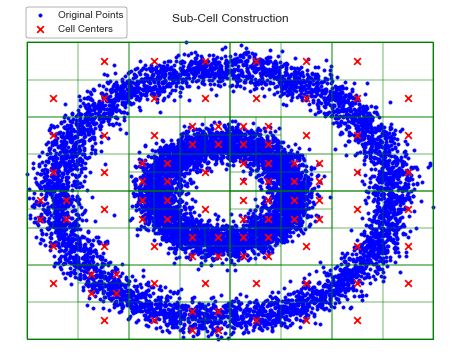

In [53]:
S_circles = coreset_construction(circles, k, d, eps, len(circles));

# K means for circles

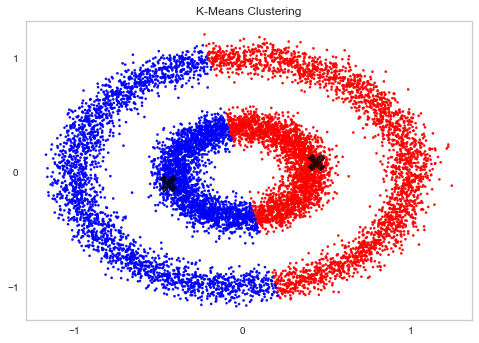

In [36]:
kmeans_circles = KMeans(n_clusters=2, random_state=0)
y_kmeans_circles = kmeans_circles.fit_predict(circles)

plt.scatter(circles[:, 0], circles[:, 1], c=y_kmeans_circles, s=5, cmap='bwr')
centers_circles = kmeans_circles.cluster_centers_
plt.scatter(centers_circles[:, 0], centers_circles[:, 1], c='black', s=300, alpha=0.8, marker='X')
plt.title('K-Means Clustering')
plt.grid(which='major')

x_ticks = [-1,0,1]
plt.xticks(x_ticks)

y_ticks = [-1,0,1]
plt.yticks(y_ticks)

plt.show()

In [25]:
silhouette_score_circles = metrics.silhouette_score(circles, y_kmeans_circles)
inertia_circles = kmeans_circles.inertia_

print(f"Silhouette Score: {silhouette_score_circles}") #how well-separated the clusters are
print(f"Inertia: {inertia_circles}") # how far the points within a cluster are from the center of that cluster.

Silhouette Score: 0.32721535582005234
Inertia: 3873.6991437232386


# K means for coreset of circles

In [26]:
coordinates_circles = np.array([item[0] for item in S_circles])
coreset_array_circles = coordinates_circles.reshape(-1, 2)
coreset_array_circles[0:5]

array([[-0.7133125 , -1.0204375 ],
       [-1.0144375 , -0.7233125 ],
       [-0.78859375, -0.79759375],
       [-0.63803125, -0.79759375],
       [-0.78859375, -0.64903125]])

C:\Users\Stasius\AppData\Roaming\Python\Python38\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


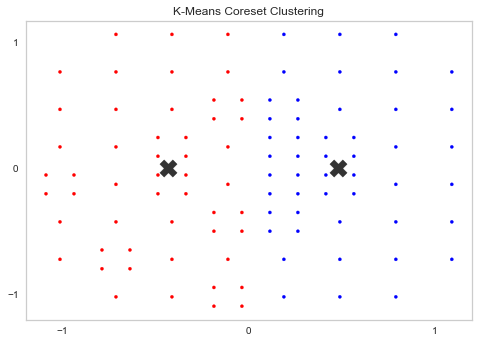

In [35]:
corekmeans_circles = KMeans(n_clusters=2, random_state=0)
y_corekmeans_circles = corekmeans_circles.fit_predict(coreset_array_circles, sample_weight= [item[1] for item in S_circles])

plt.scatter(coreset_array_circles[:, 0], coreset_array_circles[:, 1], c=y_corekmeans_circles, s=10, cmap='bwr')
corecenters_circles = corekmeans_circles.cluster_centers_
plt.scatter(corecenters_circles[:, 0], corecenters_circles[:, 1], c='black', s=300, alpha=0.8, marker='X')
plt.title('K-Means Coreset Clustering')
plt.grid(which='major')

x_ticks = [-1,0,1]
plt.xticks(x_ticks)

y_ticks = [-1,0,1]
plt.yticks(y_ticks)

plt.show()

In [28]:
silhouette_score_circles = metrics.silhouette_score(coreset_array_circles, y_corekmeans_circles)
inertia_circles = corekmeans_circles.inertia_

print(f"Silhouette Score: {silhouette_score_circles}") #how well-separated the clusters are
print(f"Inertia: {inertia_circles}") # how far the points within a cluster are from the center of that cluster.

Silhouette Score: 0.31936340295012805
Inertia: 4008.359514552354


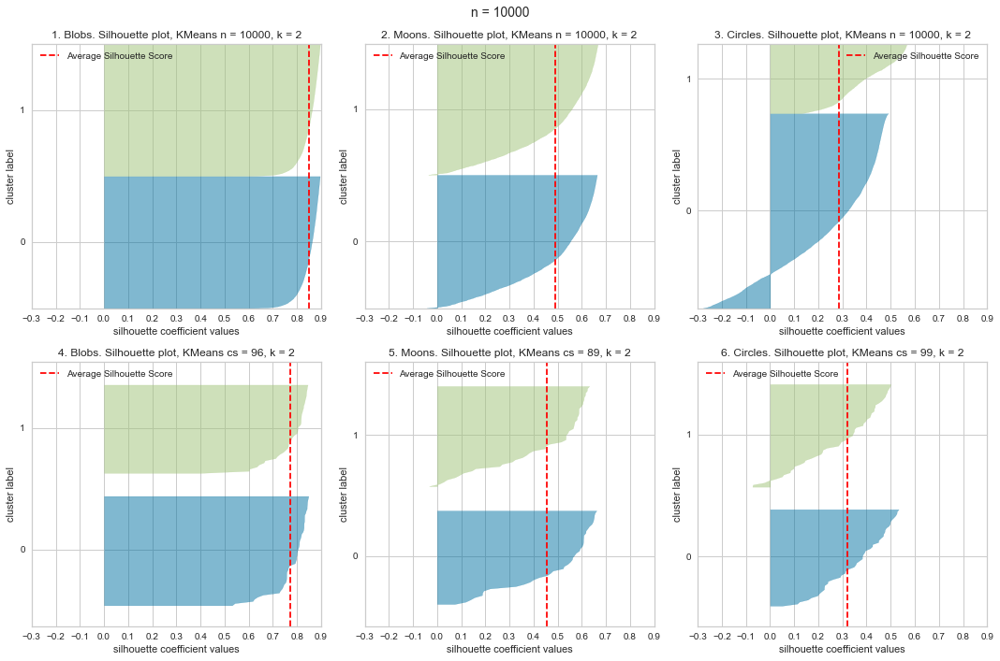

In [31]:
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
axs = axs.ravel()
x_range = (-0.3, 0.9)

#blobs
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=axs[0],
                                  title=f"1. Blobs. Silhouette plot, KMeans n = {X.shape[0]}, k = {k}")
visualizer.fit(X)
visualizer.finalize()
axs[0].set_xlim(x_range)

#blobs core
visualizer = SilhouetteVisualizer(corekmeans, colors='yellowbrick', ax=axs[3],
                                  title=f"4. Blobs. Silhouette plot, KMeans cs = {coreset_array.shape[0]}, k = {k}")
visualizer.fit(coreset_array)
visualizer.finalize()
axs[3].set_xlim(x_range)

#moons
visualizer = SilhouetteVisualizer(kmeans_moons, colors='yellowbrick', ax=axs[1],
                                  title=f"2. Moons. Silhouette plot, KMeans n = {moons.shape[0]}, k = {k}")
visualizer.fit(moons)
visualizer.finalize()
axs[1].set_xlim(x_range)

#moons core
visualizer = SilhouetteVisualizer(corekmeans_moons, colors='yellowbrick', ax=axs[4],
                                  title=f"5. Moons. Silhouette plot, KMeans cs = {coreset_array_moons.shape[0]}, k = {k}")
visualizer.fit(coreset_array_moons)
visualizer.finalize()
axs[4].set_xlim(x_range)

#circles
visualizer = SilhouetteVisualizer(kmeans_moons, colors='yellowbrick', ax=axs[2],
                                  title=f"3. Circles. Silhouette plot, KMeans n = {circles.shape[0]}, k = {k}")
visualizer.fit(circles)
visualizer.finalize()
axs[2].set_xlim(x_range)

#circles core
visualizer = SilhouetteVisualizer(corekmeans_circles, colors='yellowbrick', ax=axs[5],
                                  title=f"6. Circles. Silhouette plot, KMeans cs = {coreset_array_circles.shape[0]}, k = {k}")
visualizer.fit(coreset_array_circles)
visualizer.finalize()
axs[5].set_xlim(x_range)

fig.suptitle(f'n = {n}', fontsize=14)
plt.tight_layout()
plt.show()